# machinehack-ml-merchandise-popularity-prediction




Big Brands spend a significant amount on popularizing a product.  Nevertheless, their efforts go in vain while establishing the merchandise in the hyperlocal market. Based on different geographical conditions same attributes can communicate a piece of much different information about the customer. Hence, insights this is a must for any brand owner.

We need to predict the popularity from all the other data from dataset like Store_Ratio, Basket Ratio, Store Score. 

# ABOUT DATASET

Train.csv - 18208 x 12  (Includes popularity Column as Target variable)

Test.csv - 12140 x 11 

# COLUMNS IN THE DATASET

storeratio

 basketratio

category1

 storescore

category2

 storepresence

score1 

score2

score3 

score4

time

popularity (Target Column)

# Importing required libraries

In [2]:
# Import all necessary libraries
import seaborn as sns
import numpy as np
from sklearn.metrics import log_loss
import pandas as pd
from scipy.stats import skew,kurtosis,zscore
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stat
from matplotlib import pylab
from pylab import *
import warnings
warnings.filterwarnings("ignore")

# Importing the dataset

In [ ]:
# Load the dataset using pandas
train_df = pd.read_csv('/content/MPP_Dataset/Train.csv')
test_df = pd.read_csv('/content/MPP_Dataset/Test.csv')

In [9]:
# Make a copy of the dataset 
df = train_df

# Identifying the number of features or columns

In [ ]:

# Check the shape of train dataset
train_df.shape

(18208, 12)

In [ ]:
# Check the shape of test dataset
test_df.shape

(12140, 11)

# Know all the names of the columns

In [ ]:
# Check the columns in the train dataset
train_df.columns

Index(['Store_Ratio', 'Basket_Ratio', 'Category_1', 'Store_Score',
       'Category_2', 'Store_Presence', 'Score_1', 'Score_2', 'Score_3',
       'Score_4', 'time', 'popularity'],
      dtype='object')

# Knows more about the data in the columns like data type it contains and total samples of each

In [ ]:
# Check which columns are having categorical, numerical or boolean values
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18208 entries, 0 to 18207
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Store_Ratio     18208 non-null  float64
 1   Basket_Ratio    18208 non-null  float64
 2   Category_1      18208 non-null  int64  
 3   Store_Score     18208 non-null  float64
 4   Category_2      18208 non-null  int64  
 5   Store_Presence  18208 non-null  float64
 6   Score_1         18208 non-null  float64
 7   Score_2         18208 non-null  float64
 8   Score_3         18208 non-null  float64
 9   Score_4         18208 non-null  float64
 10  time            18208 non-null  int64  
 11  popularity      18208 non-null  int64  
dtypes: float64(8), int64(4)
memory usage: 1.7 MB


After checking the Dtypes of all the columns

object - String values

float64 - Numerical values

Observation: There are no String values so there are no categorical data

In [ ]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12140 entries, 0 to 12139
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Store_Ratio     12140 non-null  float64
 1   Basket_Ratio    12140 non-null  float64
 2   Category_1      12140 non-null  int64  
 3   Store_Score     12140 non-null  float64
 4   Category_2      12140 non-null  int64  
 5   Store_Presence  12140 non-null  float64
 6   Score_1         12140 non-null  float64
 7   Score_2         12140 non-null  float64
 8   Score_3         12140 non-null  float64
 9   Score_4         12140 non-null  float64
 10  time            12140 non-null  int64  
dtypes: float64(8), int64(3)
memory usage: 1.0 MB


After checking the Dtypes of all the columns

object - String values

float64 - Numerical values

Observation: There are no String values so there are no categorical data

# Know more mathematical relations of the dataset like count, min, max values, standarad deviation values, mean and different percentile values

In [ ]:
# For more information on the dataset like the total count in all the columns
# min, max values and more information of the respective columns  
train_df.describe()

,Store_Ratio,Basket_Ratio,Category_1,Store_Score,Category_2,Store_Presence,Score_1,Score_2,Score_3,Score_4,time,popularity
count,18208.000000,18208.000000,18208.000000,18208.000000,18208.000000,18208.000000,18208.000000,18208.000000,18208.000000,18208.000000,1.820800e+04,18208.000000
mean,0.544283,0.483585,5.155536,-12.198086,0.648506,0.477702,0.322109,0.164888,0.421440,115.305776,2.180101e+05,3.850231
std,0.202709,0.302010,3.535068,8.370566,0.477450,0.380634,0.413493,0.136531,0.271922,31.478303,9.648289e+04,0.544226
min,0.000000,0.000216,0.000000,-47.576000,0.000000,0.000000,0.000000,0.011900,0.000000,0.000000,3.184400e+04,0.000000
25%,0.411000,0.200000,2.000000,-16.496250,0.000000,0.086175,0.000001,0.095300,0.184750,90.974250,1.696202e+05,4.000000
50%,0.573000,0.517000,5.000000,-9.166500,1.000000,0.430000,0.002245,0.112000,0.393000,114.022500,2.046460e+05,4.000000
75%,0.699000,0.742000,8.000000,-5.943750,1.000000,0.895000,0.859000,0.176000,0.640000,134.997000,2.471562e+05,4.000000
max,0.998000,1.000000,11.000000,-0.079000,1.000000,0.996000,1.000000,0.991000,0.999000,219.701000,3.908467e+06,5.000000


In [ ]:
test_df.describe()

,Store_Ratio,Basket_Ratio,Category_1,Store_Score,Category_2,Store_Presence,Score_1,Score_2,Score_3,Score_4,time
count,12140.000000,12140.000000,12140.000000,12140.000000,12140.000000,12140.000000,12140.000000,12140.000000,12140.000000,12140.000000,1.214000e+04
mean,0.543776,0.488879,5.121417,-12.062847,0.642916,0.474675,0.321641,0.165942,0.420485,115.748041,2.154031e+05
std,0.200109,0.301217,3.528765,8.300385,0.479160,0.377582,0.414438,0.139109,0.270508,31.519999,8.231108e+04
min,0.000000,0.000000,0.000000,-46.847000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.406700e+04
25%,0.414750,0.213000,2.000000,-16.066000,0.000000,0.087775,0.000001,0.095900,0.190000,90.908750,1.700000e+05
50%,0.570000,0.521000,5.000000,-9.046500,1.000000,0.430500,0.002050,0.112000,0.392000,114.618500,2.043415e+05
75%,0.696000,0.745000,8.000000,-5.891750,1.000000,0.882000,0.861000,0.173250,0.633000,135.829250,2.445222e+05
max,0.978000,1.000000,11.000000,0.662000,1.000000,0.996000,1.000000,0.994000,1.000000,219.701000,1.782178e+06


# Get the total number of samples in the dataset using the len() function

In [ ]:
print('train data length: ',len(train_df))
print('test data length: ',len(test_df))

train data length:  18208
test data length:  12140


# Counting the total number of missing value

In [ ]:
# Check for missing values in all the columnns of the dataset
train_df.isnull().sum()

Store_Ratio       0
Basket_Ratio      0
Category_1        0
Store_Score       0
Category_2        0
Store_Presence    0
Score_1           0
Score_2           0
Score_3           0
Score_4           0
time              0
popularity        0
dtype: int64

There is no missing values in this dataset

In [ ]:
# Check for missing values in all the columnns of the dataset
test_df.isnull().sum()

Store_Ratio       0
Basket_Ratio      0
Category_1        0
Store_Score       0
Category_2        0
Store_Presence    0
Score_1           0
Score_2           0
Score_3           0
Score_4           0
time              0
dtype: int64

There is no missing values in this dataset

#Get unique values

In [ ]:
for x in train_df.columns:
    print(x,':',len(train_df[x].unique()))

In [ ]:
for x in test_df.columns:
    print(x,':',len(test_df[x].unique()))

# EDA

# CORRELATION MATRIX

Why ?

A correlation matrix is a table showing correlation coefficients between variables

There are three broad reasons for computing a correlation matrix:

1. To summarize a large amount of data where the goal is to see patterns. In our example above, the observable pattern is that all the variables highly correlate with each other.
2. To input into other analyses. For example, people commonly use correlation matrixes as inputs for exploratory factor analysis, confirmatory factor analysis, structural equation models, and linear regression when excluding missing values pairwise.
3. As a diagnostic when checking other analyses. For example, with linear regression, a high amount of correlations suggests that the linear regression estimates will be unreliable

In [ ]:
#correlation 
# Using pandas
corr = train_df.corr()
corr.style.background_gradient(cmap='coolwarm').set_precision(2)

,Store_Ratio,Basket_Ratio,Category_1,Store_Score,Category_2,Store_Presence,Score_1,Score_2,Score_3,Score_4,time,popularity
Store_Ratio,1.00,0.47,0.04,0.60,-0.10,-0.47,-0.45,-0.04,0.62,0.12,-0.06,0.23
Basket_Ratio,0.47,1.00,0.05,0.83,-0.11,-0.82,-0.61,0.28,0.53,0.25,0.10,0.20
Category_1,0.04,0.05,1.00,0.04,-0.14,-0.05,-0.03,0.02,0.04,0.00,-0.01,0.00
Store_Score,0.60,0.83,0.04,1.00,-0.09,-0.72,-0.73,0.15,0.52,0.26,0.08,0.20
Category_2,-0.10,-0.11,-0.14,-0.09,1.00,0.10,0.02,-0.04,-0.04,-0.05,-0.01,-0.03
Store_Presence,-0.47,-0.82,-0.05,-0.72,0.10,1.00,0.57,-0.19,-0.43,-0.22,-0.07,-0.20
Score_1,-0.45,-0.61,-0.03,-0.73,0.02,0.57,1.00,-0.10,-0.47,-0.20,-0.11,-0.16
Score_2,-0.04,0.28,0.02,0.15,-0.04,-0.19,-0.10,1.00,0.03,0.02,-0.00,0.00
Score_3,0.62,0.53,0.04,0.52,-0.04,-0.43,-0.47,0.03,1.00,0.18,0.01,0.18
Score_4,0.12,0.25,0.00,0.26,-0.05,-0.22,-0.20,0.02,0.18,1.00,0.03,0.04


** Observations from above correlation matrix**

1. store ratio is strongly correlated with basket ratio , store score, score3 ,store presence score1 , score3
2. basket ratio is correlatd to store score, store presence, score1 score3.
3. category1 is correlated with category2
4. score presence is correlated with score1, score2, score3, popularity
5. score1 is correlated with score3 , score4, time, popularity


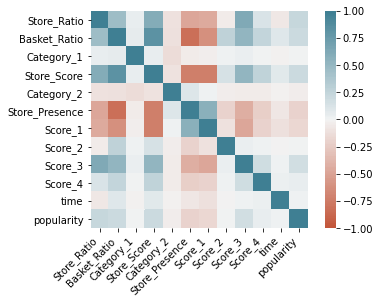

In [ ]:
# Using seaborn
ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
);

# SCATTER PLOT
Scatter plot is a graph in which the values of two variables are plotted along two axes, the pattern of the resulting points revealing any correlation present

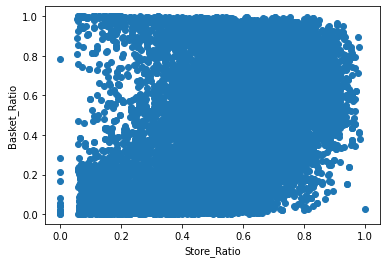

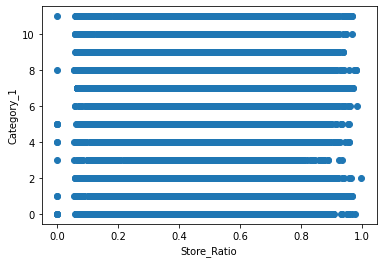

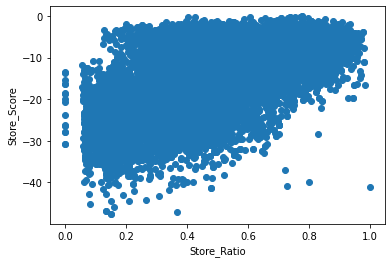

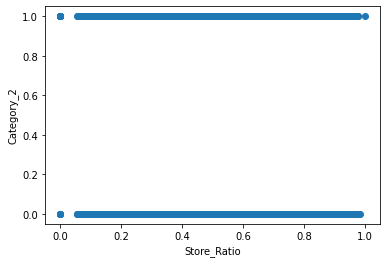

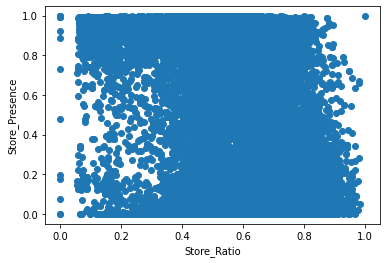

...

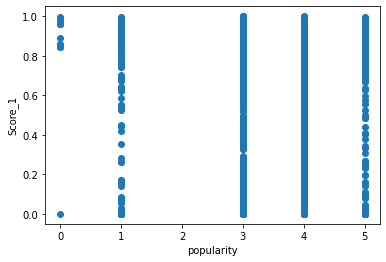

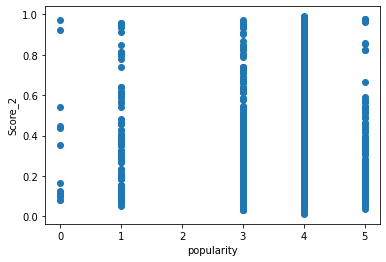

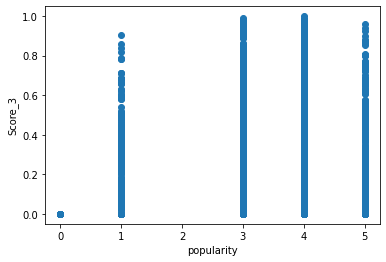

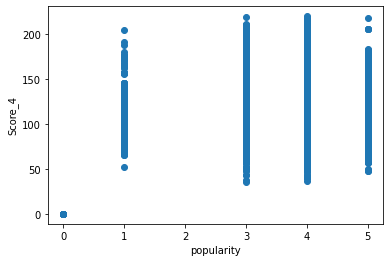

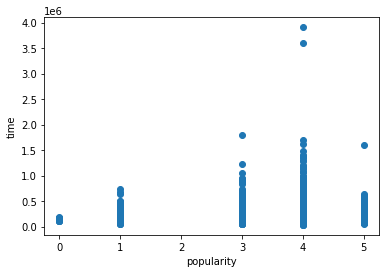

In [ ]:
# scatter plot
# Using matplotlib 
def plot_scatter(x, y):
  plt.figure()
  plt.xlabel(x)
  plt.ylabel(y)
  plt.scatter(train_df[x], train_df[y])
  plt.show()





# Loop through the different columns 
for i in train_df.columns :
    for j in train_df.columns:
        if i != j:
            plot_scatter(i, j)


** Observations from above scatter plot **

1. As value of store presence increases value of basket ratio decreases.
2. As value of store scrore increases value of basket ratio increases.
3. Increase in value of store ratio results in the increase of basket ratio's value

# HISTOGRAM
histogram shows the number of occurrences of different values in a dataset. At first glance, it is very similar to a bar chart.

The words used to describe the patterns in a histogram are: "symmetric", "skewed left" or "right", "unimodal", "bimodal" or "multimodal".

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fc04c095c10>,
      dtype=object)

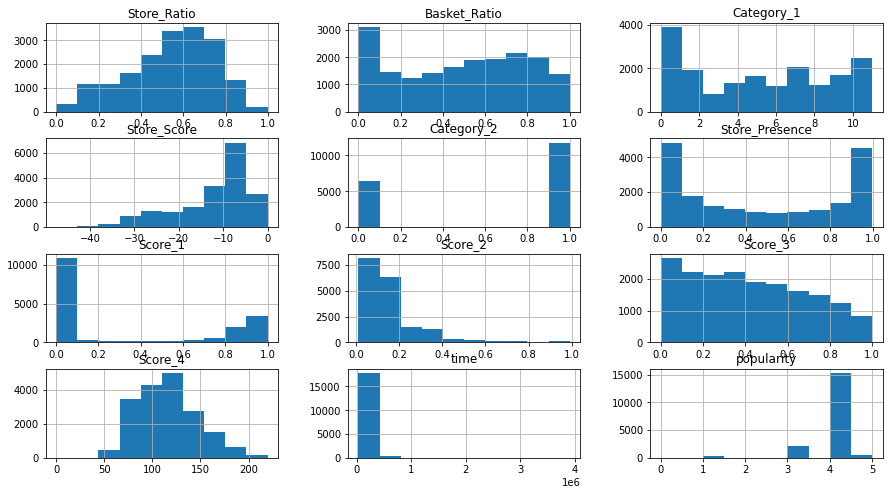

In [ ]:
# histogram 
# Using pandas 
train_df.hist(figsize=(15, 8))

**observation from above histogram**
1. The data distribution of store presence is bimodal
2. Score_2, score 1, score3 and time data distribution is skewed left.
3. Store score and popularity data distribution is skewed right.
4. distribution of basket ratio, carwgort 1  is multimodal.
5. distribution of store eatio is bimodal and skewed



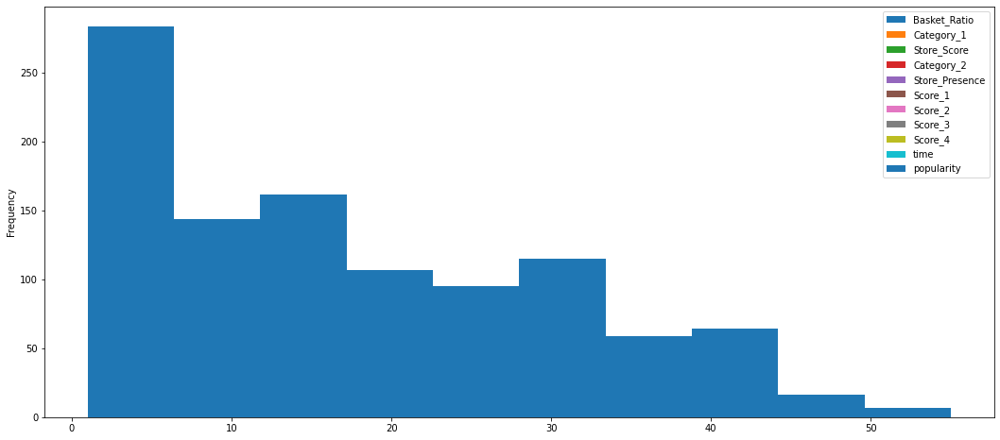

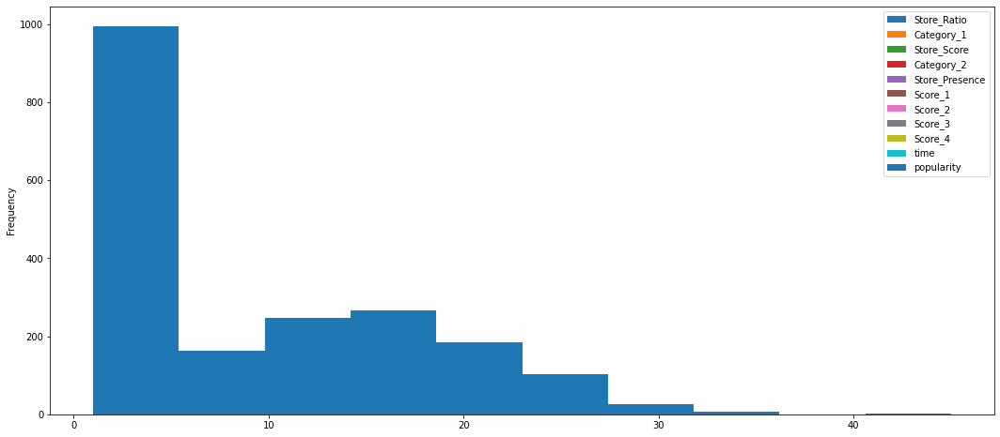

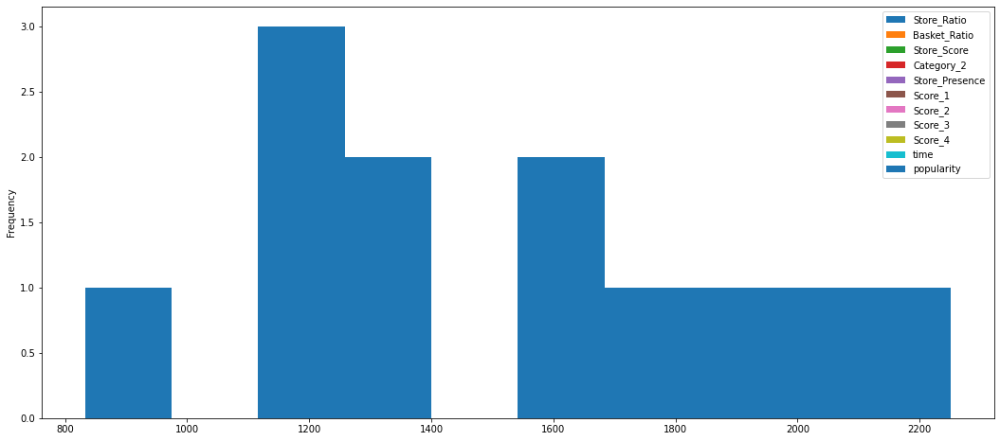

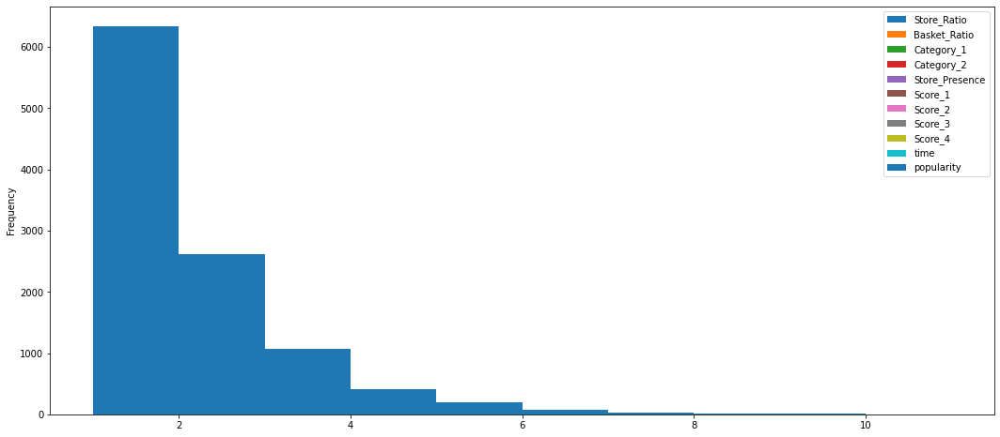

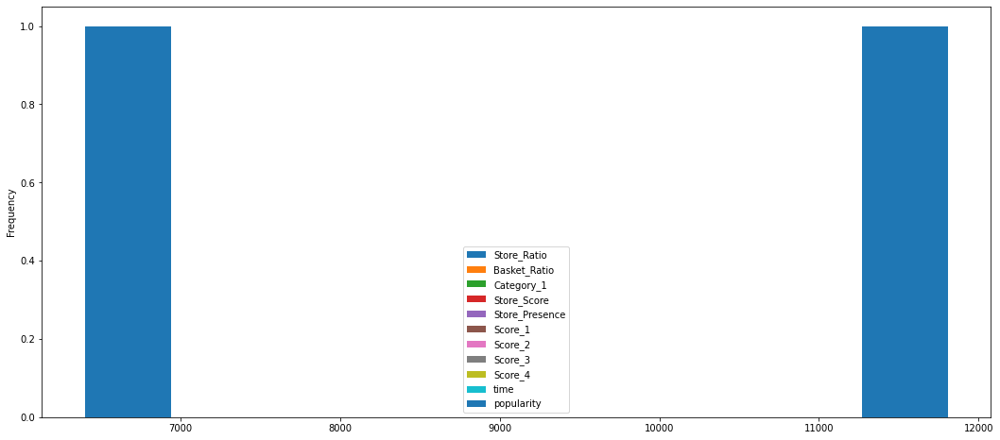

...

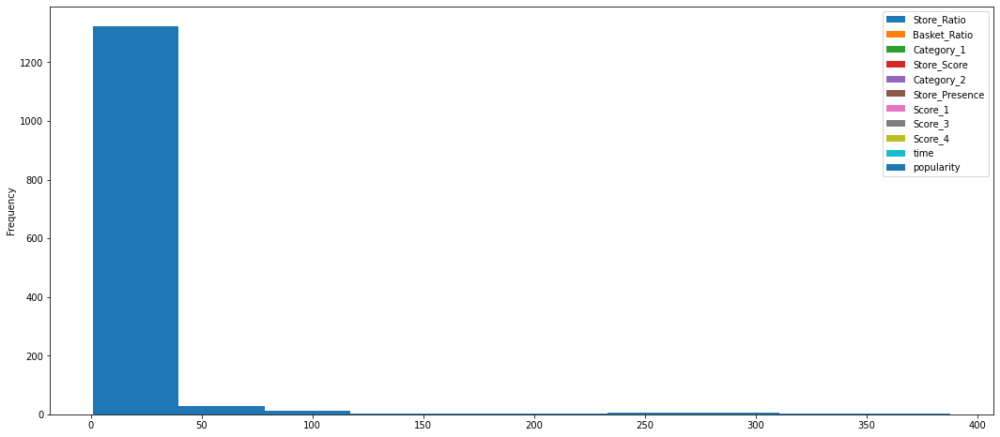

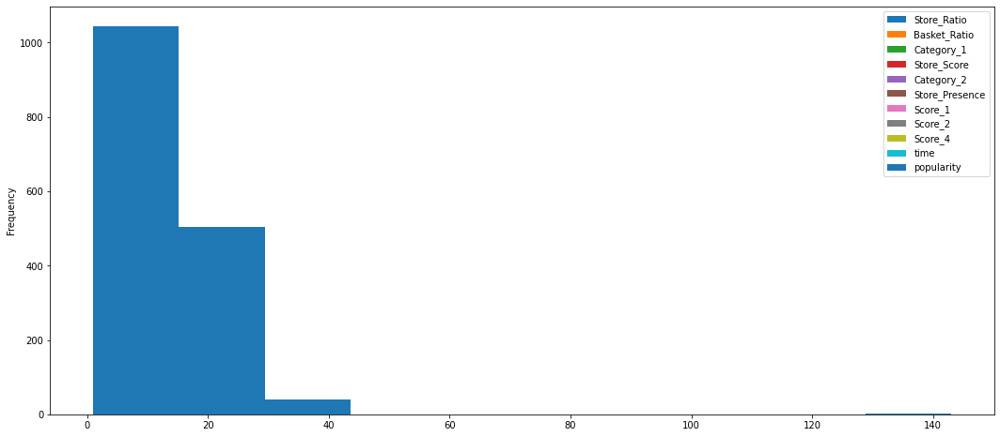

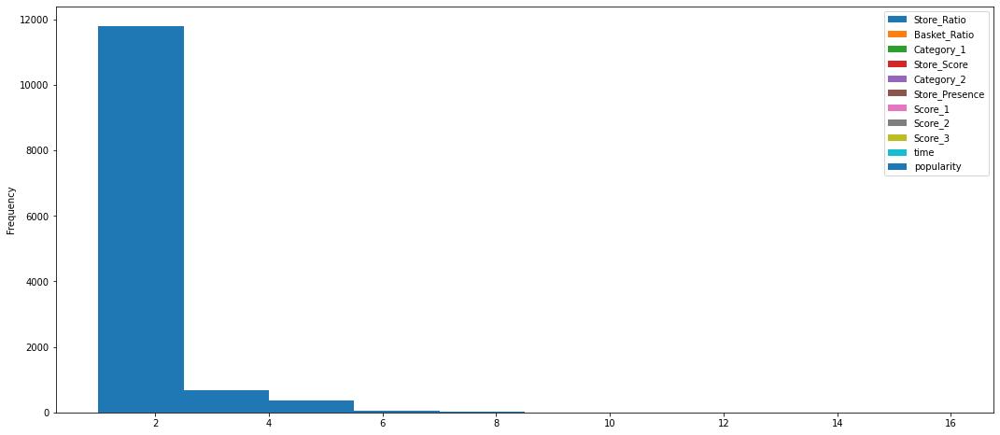

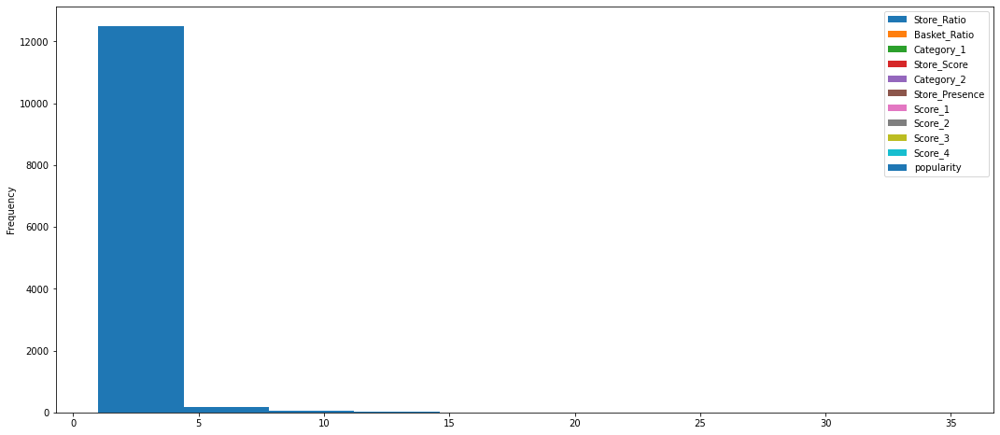

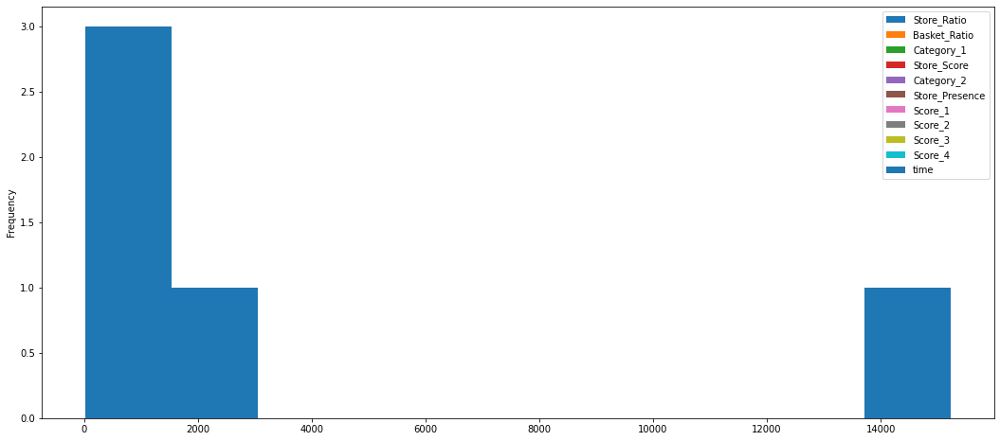

In [ ]:
for x in train_df.columns:
  train_df.groupby(x).count().plot(kind='hist', figsize=(18, 8))

# VIF - Variance inflation factor

1. The variance inflation factor (VIF) quantifies the extent of correlation between one predictor and the other predictors in a model.
2. It is used for diagnosing collinearity/multicollinearity.
3. Higher values signify that it is difficult to impossible to assess accurately the contribution of predictors to a model.

In [11]:
import statsmodels.api as sm

In [12]:
# creating a dataframe of just numerical values
train_for_vif = train_df.drop(['popularity'] ,axis=1)

# target values
target = train_df['popularity']

# numerical values column names
names =['Store_Ratio', 'Basket_Ratio', 'Category_1', 'Store_Score',
       'Category_2', 'Store_Presence', 'Score_1', 'Score_2', 'Score_3',
       'Score_4', 'time']

names

['Store_Ratio',
 'Basket_Ratio',
 'Category_1',
 'Store_Score',
 'Category_2',
 'Store_Presence',
 'Score_1',
 'Score_2',
 'Score_3',
 'Score_4',
 'time']

In [27]:
train_for_vif.columns != names[0]

array([False,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True])

In [22]:
temp = pd.DataFrame()

temp = train_for_vif.loc[:, train_for_vif.columns == names[i]]
temp.head()

,time
0,189125
1,186513
2,172143
3,184000
4,186507


In [21]:
temp = train_for_vif.loc[:, train_for_vif.columns != names[i]]
temp.head()

,Store_Ratio,Basket_Ratio,Category_1,Store_Score,Category_2,Store_Presence,Score_1,Score_2,Score_3,Score_4
0,0.407,0.00380,2,-35.865,1,0.9920,0.944,0.0988,0.1100,113.911
1,0.234,0.10500,0,-19.884,1,0.9440,0.900,0.1290,0.0382,76.332
2,0.668,0.72600,9,-7.512,1,0.0387,0.000,0.1340,0.4530,124.075
3,0.184,0.00561,4,-34.357,1,0.8490,0.931,0.1110,0.0641,79.037
4,0.231,0.13100,6,-22.842,1,0.9370,0.000,0.1090,0.0677,109.560


In [ ]:
# Calculating VIF for each feature.
for i in range(0, len(names)):
  # taking one column as target variable
  y = train_for_vif.loc[:, train_for_vif.columns == names[i]]
  # taking all other remaining columns as fetaure variable
  x = train_for_vif.loc[:,train_for_vif.columns != names[i]]
  # firting the OLS model on y and x
  model = sm.OLS(y, x)
  results = model.fit()
  # geting the r^2 value of results.
  rsq = results.rsquared
  # calculating vif value
  vif = round(1/(1-rsq),2)
  print("R Square value of {} columns is {} keeping all other columns as features".format(names[i],(round(rsq, 2))))
  print("Variance inflation Factor of {} columns is {} \n".format(names[i], vif))

R Square value of Store_Ratio columns is 0.91 keeping all other columns as features
Variance inflation Factor of Store_Ratio columns is 11.74 

R Square value of Basket_Ratio columns is 0.92 keeping all other columns as features
Variance inflation Factor of Basket_Ratio columns is 12.13 

R Square value of Category_1 columns is 0.68 keeping all other columns as features
Variance inflation Factor of Category_1 columns is 3.11 

R Square value of Store_Score columns is 0.9 keeping all other columns as features
Variance inflation Factor of Store_Score columns is 9.87 

R Square value of Category_2 columns is 0.65 keeping all other columns as features
Variance inflation Factor of Category_2 columns is 2.83 

R Square value of Store_Presence columns is 0.85 keeping all other columns as features
Variance inflation Factor of Store_Presence columns is 6.69 

R Square value of Score_1 columns is 0.72 keeping all other columns as features
Variance inflation Factor of Score_1 columns is 3.59 

R 

Observations:

there is colinearity/multicolinearity between variables as the VIF value is almost upto 2.5

Store_Ratio, Basket_Ratio, Category_1, Store_Score, Category_2, Store_Presence, Score_1, Score_2, Score_3, Score_4, time they all have colinearity with all the variables.

# BOX PLOT

This is an easy and effective way to visualize groups of numerical data through their quartiles.

{'boxes': [<matplotlib.lines.Line2D at 0x7f002137c9d0>],
 'caps': [<matplotlib.lines.Line2D at 0x7f0021381950>,
 'fliers': [<matplotlib.lines.Line2D at 0x7f0021387990>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x7f0021387450>],
 'whiskers': [<matplotlib.lines.Line2D at 0x7f00213c8150>,
  <matplotlib.lines.Line2D at 0x7f0021381410>]}

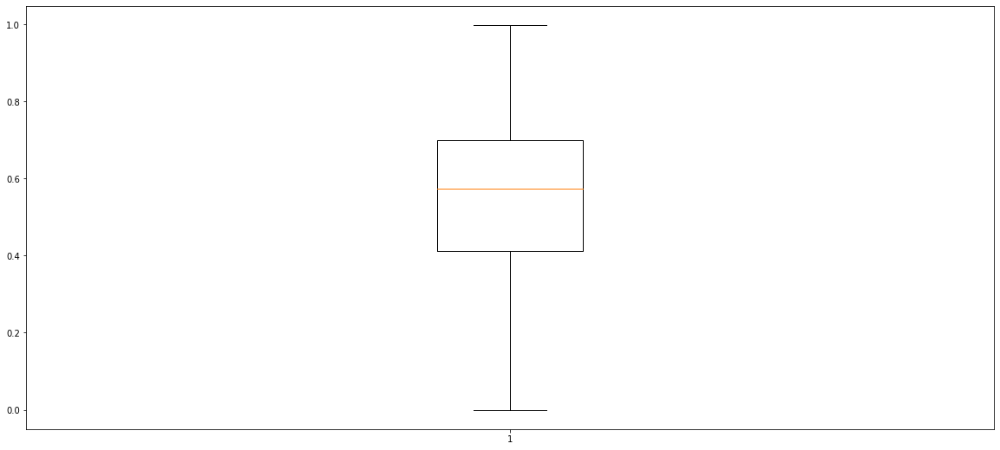

In [ ]:
# Using matplotlib 
plt.figure(figsize=(20, 9))
plt.boxplot(x=train_df['Store_Ratio'])

from above box plot graph:

Store ratio

1. 25% of  store ratio have value between range 0 to 0.4.

2. 25% of store ratio have value between range 0.4 to 0.6.
3. 25% of store ratio have value between range 0.6 to 0.7.
4. 25% of store ratio have value between range 0.7 to 1.

The mean store ratio is around 6.

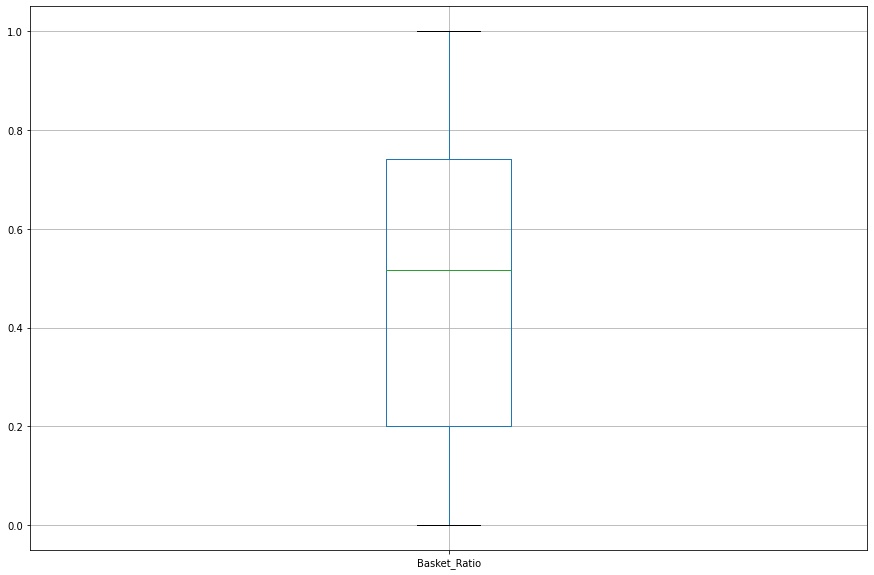

In [ ]:

# Using pandas 
train_df.boxplot(column='Basket_Ratio', figsize=(15, 10))

from above box plot graph:

basket ratio

1. 25% of  basket ratio have value between range 0 to 0.2.

2. 25% of basket ratio have value between range 0.4 to 0.52
3. 25% of basket ratio have value between range 0.52 to 0.78.
4. 25% of basket ratio have value between range 0.78 to 1.

The mean basket ratio is around 0.52

{'boxes': [<matplotlib.lines.Line2D at 0x7f0ba52aec50>],
 'caps': [<matplotlib.lines.Line2D at 0x7f0ba52c2c90>,
 'fliers': [<matplotlib.lines.Line2D at 0x7f0ba52cad10>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x7f0ba52ca790>],
 'whiskers': [<matplotlib.lines.Line2D at 0x7f0ba52e9710>,
  <matplotlib.lines.Line2D at 0x7f0ba52c2750>]}

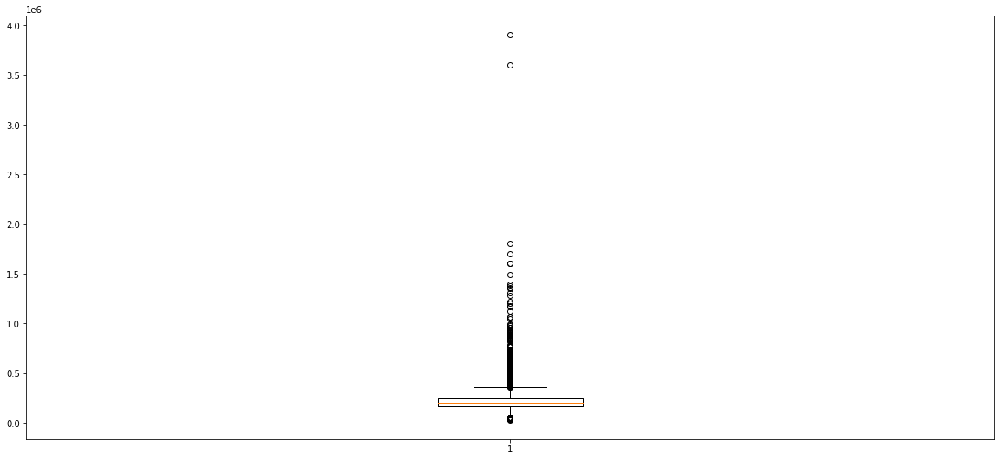

In [ ]:
plt.figure(figsize=(20, 9))
plt.boxplot(x=train_df['time'])

from above box plot graph:

time

1. 25% of  time have value between range 0 to 0.2.

2. 25% of time have value between range 0.2 to 0.25
3. 25% of time have value between range 0.25 to 0.3.
4. 25% of time have value between range 0.3 to 0.4

The mean time is around 0.25

{'boxes': [<matplotlib.lines.Line2D at 0x7f0ba4da0910>],
 'caps': [<matplotlib.lines.Line2D at 0x7f0ba4da49d0>,
 'fliers': [<matplotlib.lines.Line2D at 0x7f0ba4daca10>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x7f0ba4dac4d0>],
 'whiskers': [<matplotlib.lines.Line2D at 0x7f0ba4da0f10>,
  <matplotlib.lines.Line2D at 0x7f0ba4da4490>]}

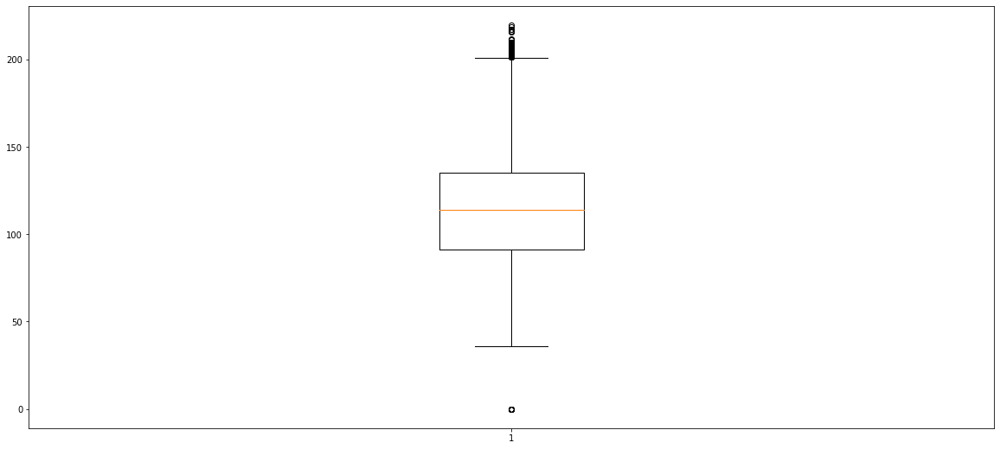

In [ ]:
plt.figure(figsize=(20, 9))
plt.boxplot(x=train_df['Score_4'])

from above box plot graph:

score 4

1. 25% of  score 4 have value between range 40 to 90.

2. 25% of score 4 have value between range 90 to 125
3. 25% of score 4 have value between range 125 to 140.
4. 25% of score 4 have value between range 140 to 200.

The mean score 4 is around 125

{'boxes': [<matplotlib.lines.Line2D at 0x7f0ba4d8be90>],
 'caps': [<matplotlib.lines.Line2D at 0x7f0ba4d92f50>,
 'fliers': [<matplotlib.lines.Line2D at 0x7f0ba4d1af90>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x7f0ba4d1aa50>],
 'whiskers': [<matplotlib.lines.Line2D at 0x7f0ba4d924d0>,
  <matplotlib.lines.Line2D at 0x7f0ba4d92a10>]}

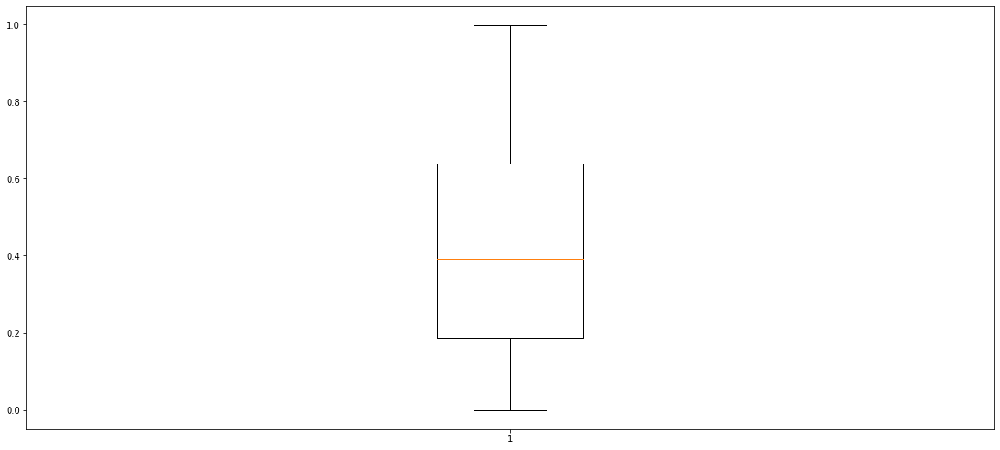

In [ ]:
plt.figure(figsize=(20, 9))
plt.boxplot(x=train_df['Score_3'])

from above box plot graph:

score3

1. 25% of  score3 have value between range 0 to 0.2.

2. 25% of score3 have value between range 0.2 to 0.4
3. 25% of score3 have value between range 0.4 to 0.62.
4. 25% of score3 have value between range 0.62 to 1.

The mean score3 is around 0.4

{'boxes': [<matplotlib.lines.Line2D at 0x7f0ba4cffcd0>],
 'caps': [<matplotlib.lines.Line2D at 0x7f0ba4d06d90>,
 'fliers': [<matplotlib.lines.Line2D at 0x7f0ba4d0bdd0>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x7f0ba4d0b890>],
 'whiskers': [<matplotlib.lines.Line2D at 0x7f0ba4d06310>,
  <matplotlib.lines.Line2D at 0x7f0ba4d06850>]}

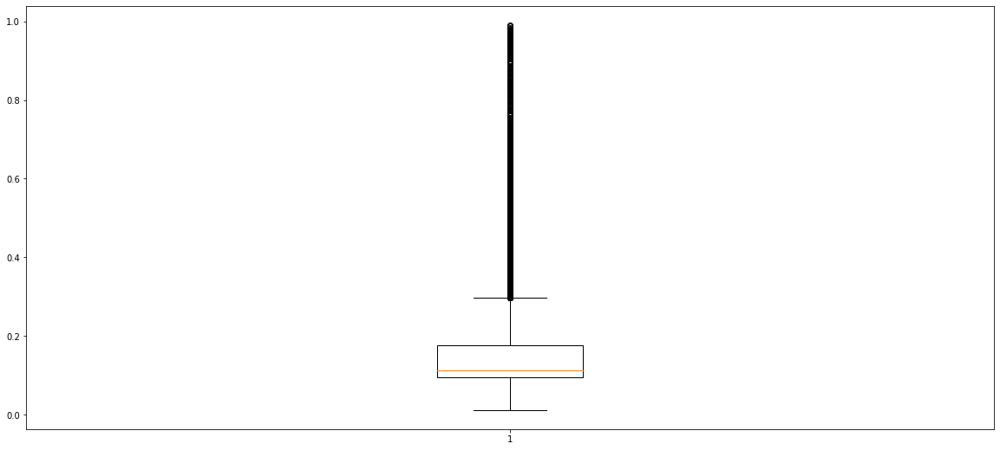

In [ ]:
plt.figure(figsize=(20, 9))
plt.boxplot(x=train_df['Score_2'])

from above box plot graph:

score2

1. 25% of  score2 have value between range 0 to 0.1.

2. 25% of score2 have value between range 0.1 to 0.12
3. 25% of score2 have value between range 0.12 to 0.18.
4. 25% of score2 have value between range 0.18 to 1.

The mean score2 is around 0.12

{'boxes': [<matplotlib.lines.Line2D at 0x7f0ba4d5da50>],
 'caps': [<matplotlib.lines.Line2D at 0x7f0ba4dd0750>,
 'fliers': [<matplotlib.lines.Line2D at 0x7f0ba4d554d0>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x7f0ba4d8bd10>],
 'whiskers': [<matplotlib.lines.Line2D at 0x7f0ba4d64110>,
  <matplotlib.lines.Line2D at 0x7f0ba4d64750>]}

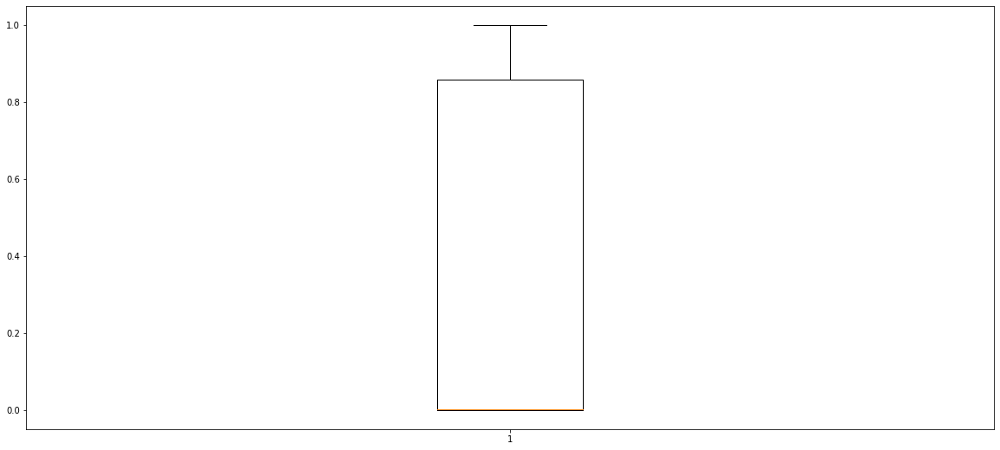

In [ ]:
plt.figure(figsize=(20, 9))
plt.boxplot(x=train_df['Score_1'])

from above box plot graph:

score1

1. 25% of  score1 have value between range 0 to 0.0.

2. 25% of score1 have value between range 0.0 to 0.0
3. 25% of score1 have value between range 0.0 to 0.9
4. 25% of score1 have value between range 0.9 to 1.

The mean score1 is around 0.0

{'boxes': [<matplotlib.lines.Line2D at 0x7f0ba4c54250>],
 'caps': [<matplotlib.lines.Line2D at 0x7f0ba4c59310>,
 'fliers': [<matplotlib.lines.Line2D at 0x7f0ba4be1350>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x7f0ba4c59dd0>],
 'whiskers': [<matplotlib.lines.Line2D at 0x7f0ba4c54850>,
  <matplotlib.lines.Line2D at 0x7f0ba4c54d90>]}

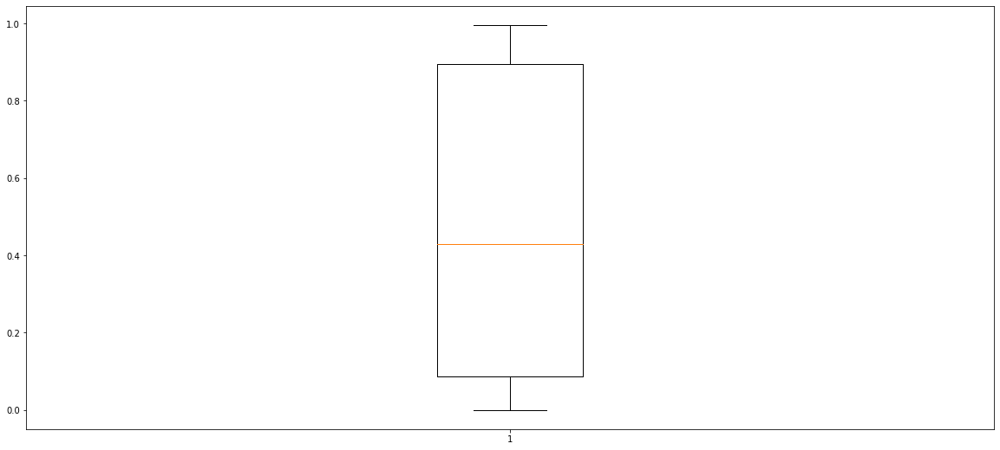

In [ ]:
plt.figure(figsize=(20, 9))
plt.boxplot(x=train_df['Store_Presence'])

from above box plot graph:

store presence

1. 25% of  store presence have value between range 0 to 0.35.

2. 25% of store presence have value between range 0.35 to 0.42
3. 25% of store presence have value between range 0.42 to 0.95.
4. 25% of store presence have value between range 0.95 to 1.

The mean store presence is around 0.42

{'boxes': [<matplotlib.lines.Line2D at 0x7f0ba4bbbc90>],
 'caps': [<matplotlib.lines.Line2D at 0x7f0ba4bc2d50>,
 'fliers': [<matplotlib.lines.Line2D at 0x7f0ba4bc8d90>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x7f0ba4bc8850>],
 'whiskers': [<matplotlib.lines.Line2D at 0x7f0ba4bc22d0>,
  <matplotlib.lines.Line2D at 0x7f0ba4bc2810>]}

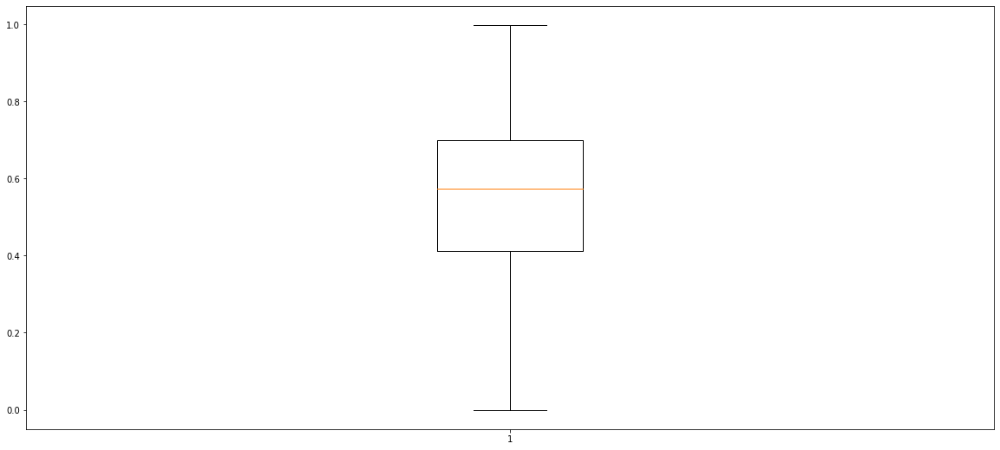

In [ ]:
plt.figure(figsize=(20, 9))
plt.boxplot(x=train_df['Store_Ratio'])

from above box plot graph:

store ratio

1. 25% of  store ratio have value between range 0 to 0.4.

2. 25% of store ratio have value between range 0.4 to 0.59
3. 25% of store ratio have value between range 0.59 to 0.71.
4. 25% of store ratio have value between range 0.71 to 1.

The mean store ratio is around 0.59

{'boxes': [<matplotlib.lines.Line2D at 0x7f0ba4b2b690>],
 'caps': [<matplotlib.lines.Line2D at 0x7f0ba4b30750>,
 'fliers': [<matplotlib.lines.Line2D at 0x7f0ba4b37790>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x7f0ba4b37250>],
 'whiskers': [<matplotlib.lines.Line2D at 0x7f0ba4b2bc90>,
  <matplotlib.lines.Line2D at 0x7f0ba4b30210>]}

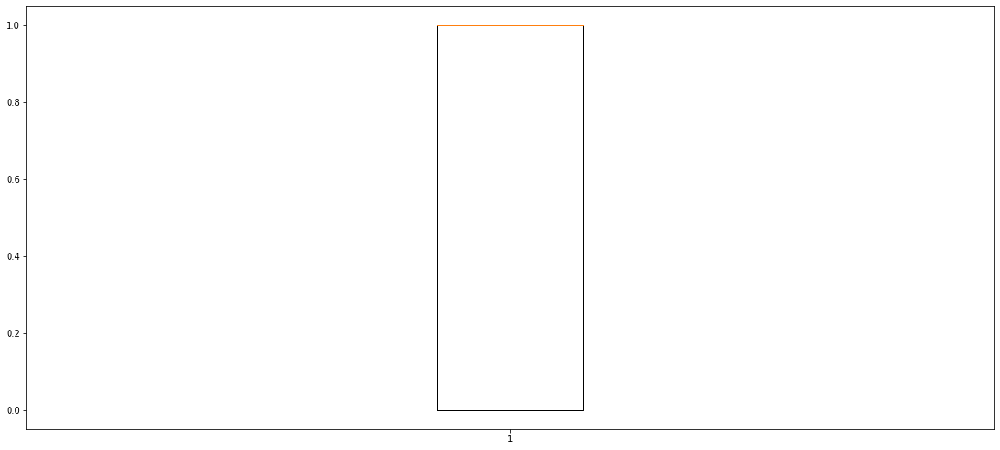

In [ ]:
plt.figure(figsize=(20, 9))
plt.boxplot(x=train_df['Category_2'])

from above box plot graph:

category 2

1. 25% of  category2 have value between range 0 to 0.0.

2. 25% of category2 have value between range 0.0 to 0.1
3. 25% of category2 have value between range 0.1 to 0.1
4. 25% of category2 have value between range 0.1 to 1.

The mean category2 is around 0.1

{'boxes': [<matplotlib.lines.Line2D at 0x7f0ba4a9b090>],
 'caps': [<matplotlib.lines.Line2D at 0x7f0ba4aa0150>,
 'fliers': [<matplotlib.lines.Line2D at 0x7f0ba4aa8190>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x7f0ba4aa0c10>],
 'whiskers': [<matplotlib.lines.Line2D at 0x7f0ba4a9b690>,
  <matplotlib.lines.Line2D at 0x7f0ba4a9bbd0>]}

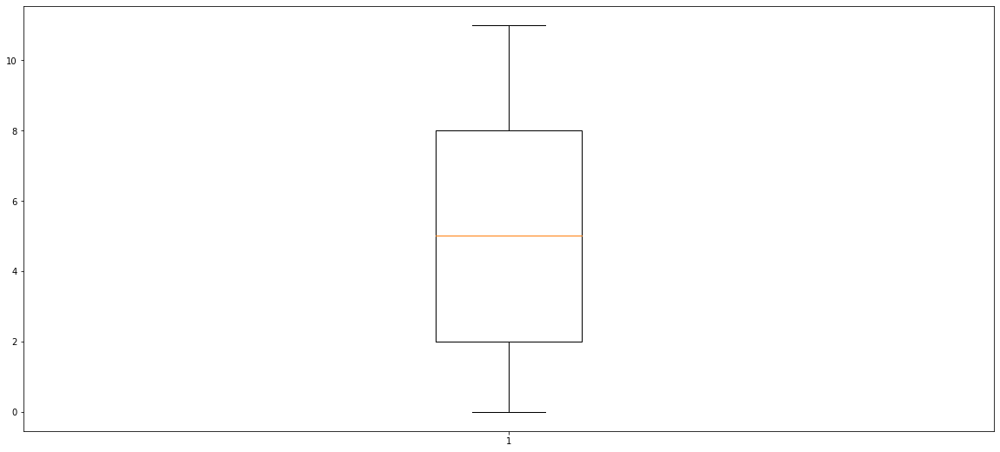

In [ ]:
plt.figure(figsize=(20, 9))
plt.boxplot(x=train_df['Category_1'])

from above box plot graph:

category1

1. 25% of  category1 have value between range 0 to 0.2.

2. 25% of category1 have value between range 0.2 to 0.5
3. 25% of category1 have value between range 0.5 to 0.8.
4. 25% of category1 have value between range 0.8 to 1.

The mean category1 is around 0.5

{'boxes': [<matplotlib.lines.Line2D at 0x7f0ba4a86910>],
 'caps': [<matplotlib.lines.Line2D at 0x7f0ba4a8b9d0>,
 'fliers': [<matplotlib.lines.Line2D at 0x7f0ba4a90a10>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x7f0ba4a904d0>],
 'whiskers': [<matplotlib.lines.Line2D at 0x7f0ba4a86f10>,
  <matplotlib.lines.Line2D at 0x7f0ba4a8b490>]}

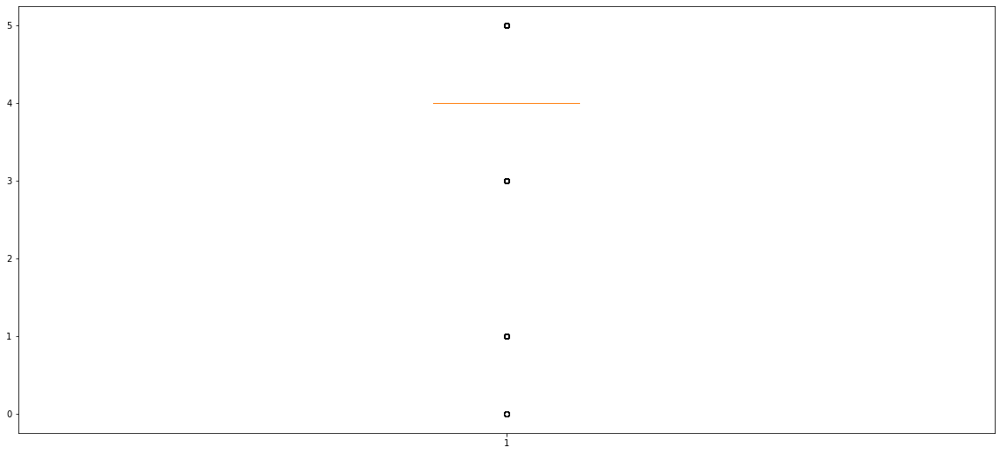

In [ ]:
plt.figure(figsize=(20, 9))
plt.boxplot(x=train_df['popularity'])

#COUNT PLOT
count plot is a graphical display to show the number of occurrences or frequency for each categorical data using bars.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


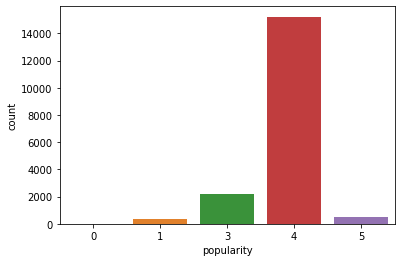

In [ ]:
# Perform the countplot on the pickup hour data
# Plot countplot on popularity column
sns.countplot(df.popularity)

From above count plot

distribution of values over complete dataset are skewed right

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


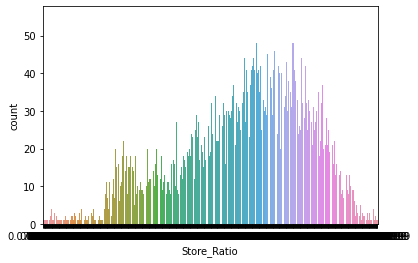

In [ ]:
sns.countplot(df.Store_Ratio)

From above count plot

distribution of values over complete dataset are skewed right.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


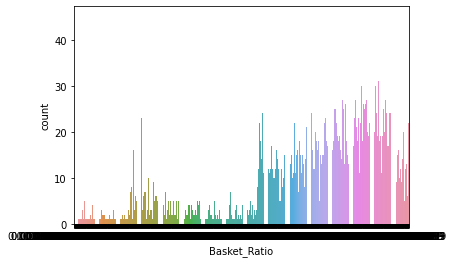

In [ ]:
sns.countplot(df.Basket_Ratio)

From above count plot

distribution of values over complete dataset are skewed right

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


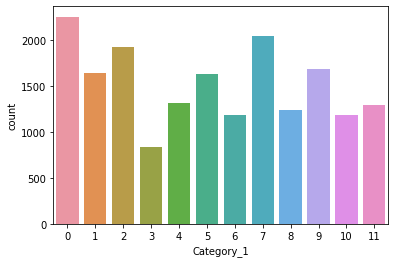

In [ ]:
sns.countplot(df.Category_1)

distribution of values over complete dataset is multimodal

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


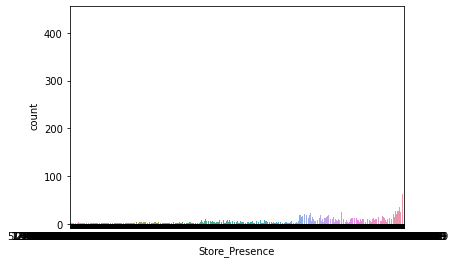

In [ ]:
sns.countplot(df.Store_Presence)

distribution of values over complete dataset is skewed to right

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


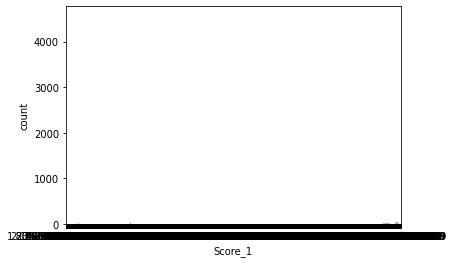

In [ ]:
sns.countplot(df.Score_1)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


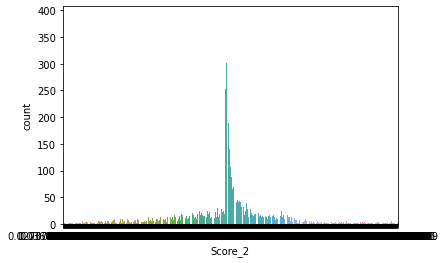

In [ ]:
sns.countplot(df.Score_2)

distribution of values over complete dataset is unimodal.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


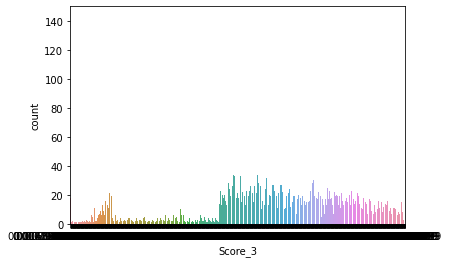

In [ ]:
sns.countplot(df.Score_3)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


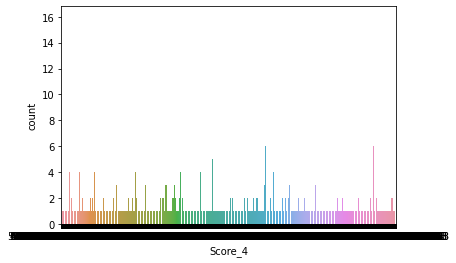

In [ ]:
sns.countplot(df.Score_4)

From above count plot

distribution of values over complete dataset are multi model that is more than one peak.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


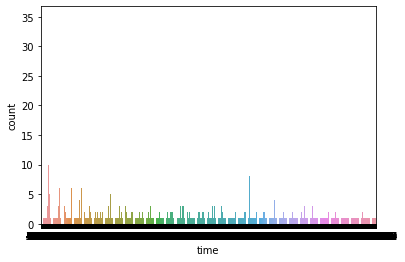

In [ ]:
sns.countplot(df.time)

distribution of values over complete dataset are multi model

# Point PLOT

A point plot uses scatter plot points to represent the central tendency of numeric data.

These plots make use of error bars to indicate any uncertainty around the numeric

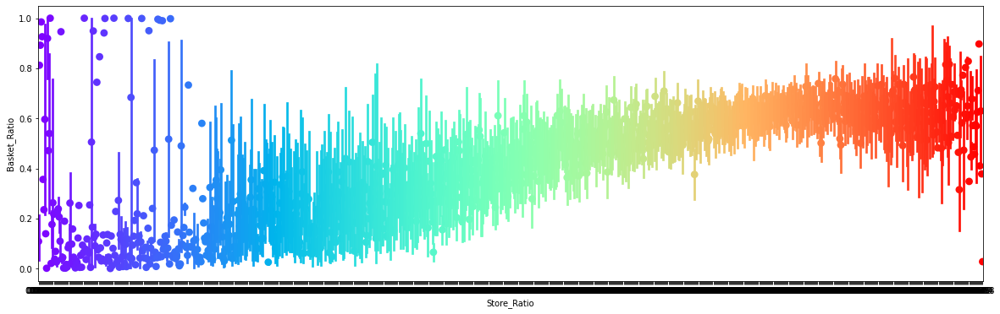

In [ ]:

plt.figure(figsize=(20,6))
sns.pointplot(x='Store_Ratio',y="Basket_Ratio",data= train_df, palette='rainbow')

From above point plot

There is a increase in basket ratio when there is a increase in store ratio. That is both are correlated

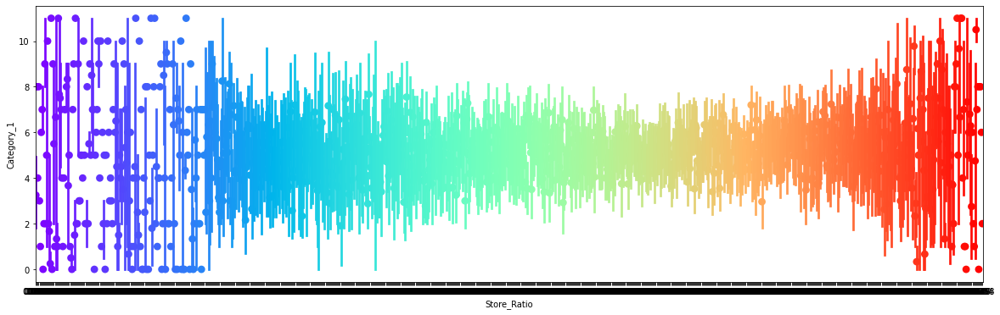

In [ ]:

plt.figure(figsize=(20,6))
sns.pointplot(x='Store_Ratio',y="Category_1",data= train_df, palette='rainbow')

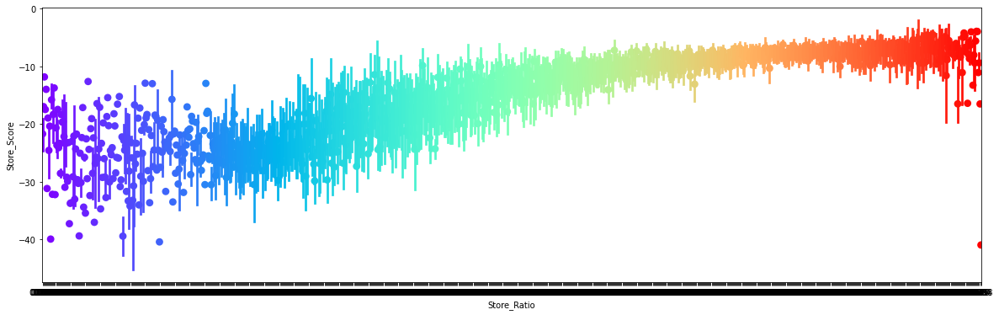

In [ ]:

plt.figure(figsize=(20,6))
sns.pointplot(x='Store_Ratio',y="Store_Score",data= train_df, palette='rainbow')

From above point plot

There is a increase in store score when there is a increase in store ratio. That is both are correlated

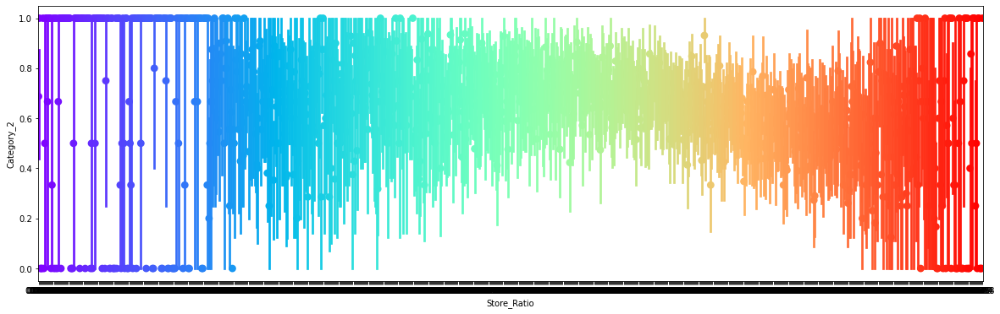

In [ ]:

plt.figure(figsize=(20,6))
sns.pointplot(x='Store_Ratio',y="Category_2",data= train_df, palette='rainbow')

increase decrease increase decrease

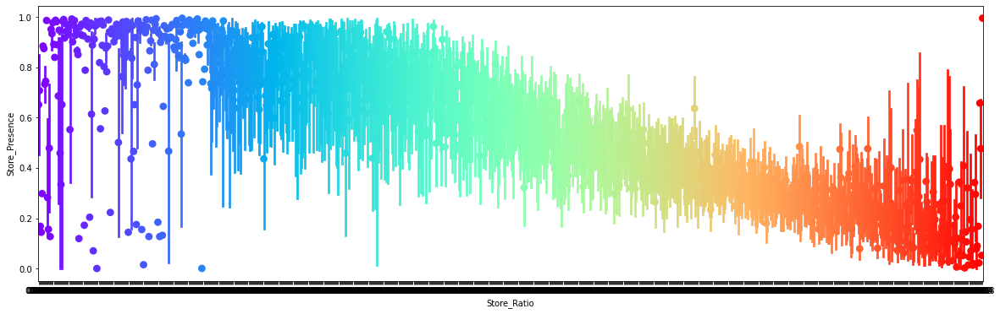

In [ ]:

plt.figure(figsize=(20,6))
sns.pointplot(x='Store_Ratio',y="Store_Presence",data= train_df, palette='rainbow')

From above point plot

There is a increase in store ratio when there is a decrease in store presence.

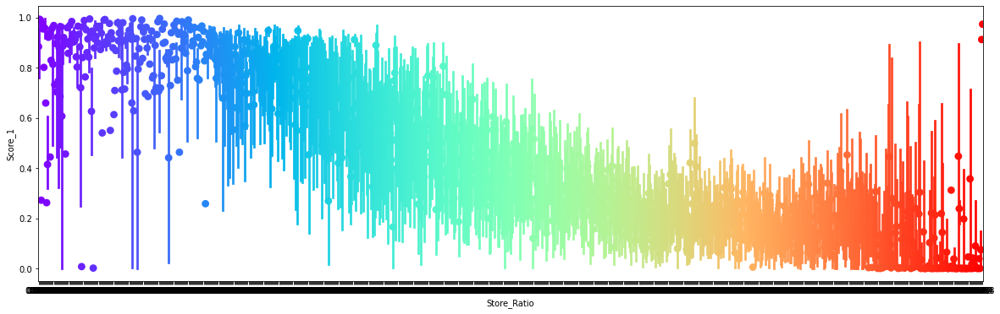

In [ ]:

plt.figure(figsize=(20,6))
sns.pointplot(x='Store_Ratio',y="Score_1",data= train_df, palette='rainbow')

From above point plot

There is a decrease in score3 when there is a increase in store ratio.

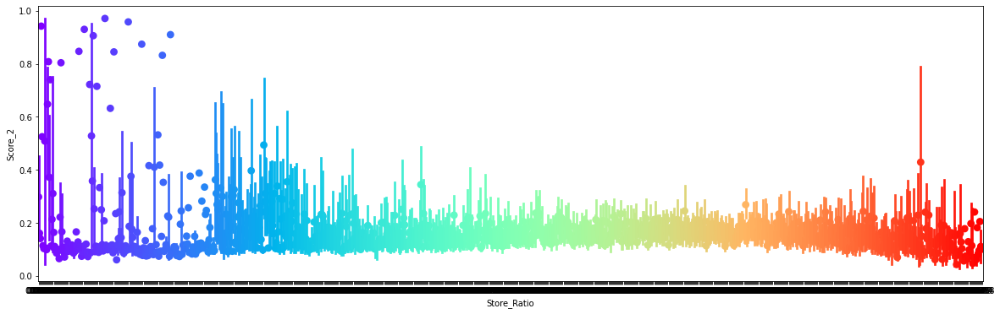

In [ ]:

plt.figure(figsize=(20,6))
sns.pointplot(x='Store_Ratio',y="Score_2",data= train_df, palette='rainbow')

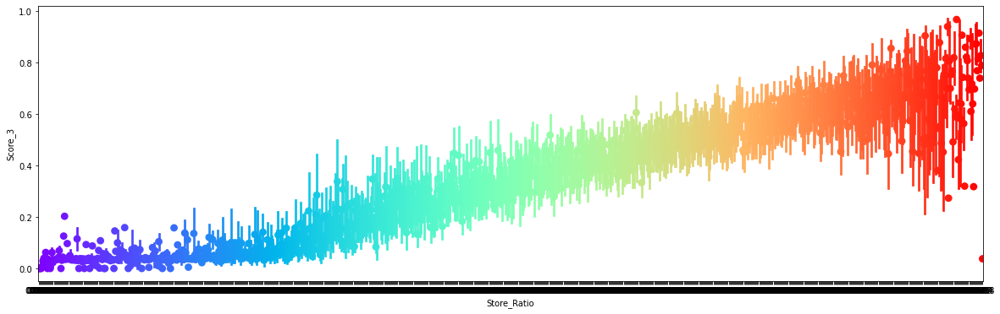

In [ ]:

plt.figure(figsize=(20,6))
sns.pointplot(x='Store_Ratio',y="Score_3",data= train_df, palette='rainbow')

From above point plot

There is a increase in store ratio when there is a increase in score3. That is both are correlated

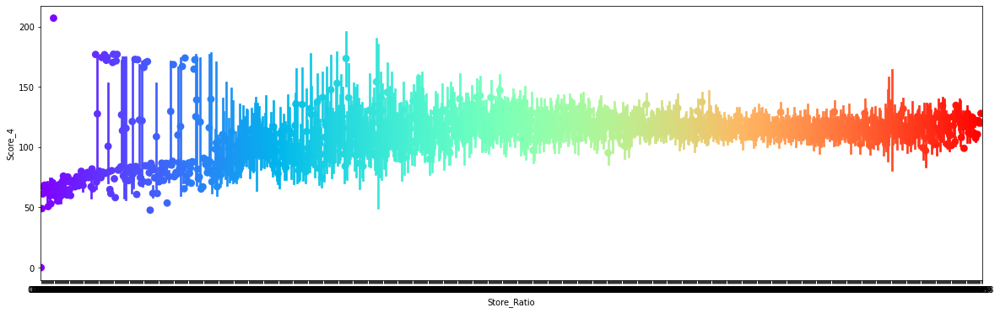

In [ ]:

plt.figure(figsize=(20,6))
sns.pointplot(x='Store_Ratio',y="Score_4",data= train_df, palette='rainbow')

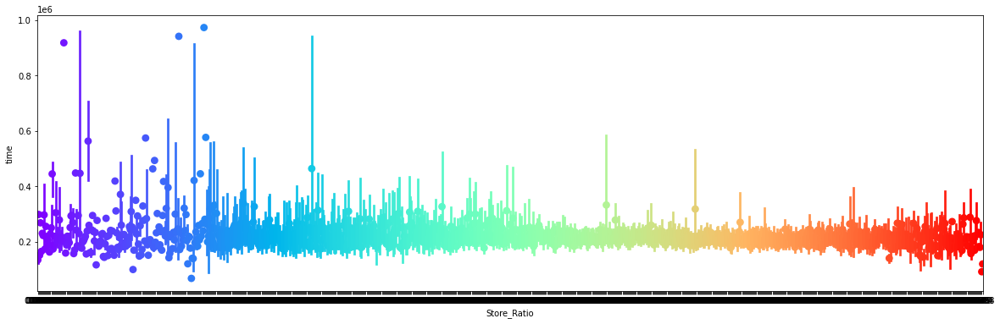

In [ ]:

plt.figure(figsize=(20,6))
sns.pointplot(x='Store_Ratio',y="time",data= train_df, palette='rainbow')

From above pointplot

1. Most of the points are between 0.2 to 0.3
2. Very few points above 0.3

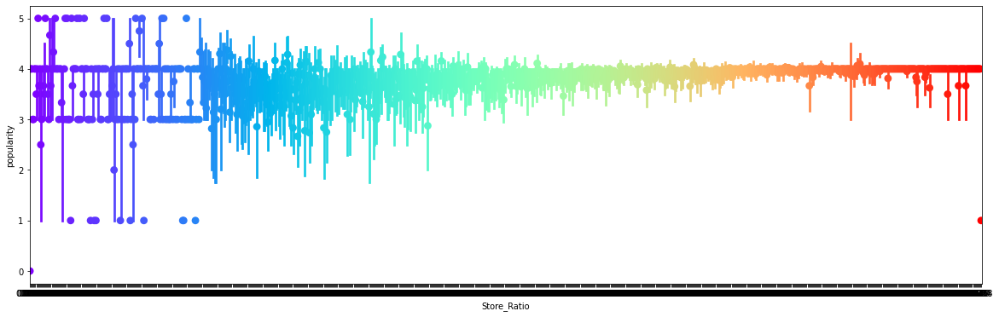

In [ ]:

plt.figure(figsize=(20,6))
sns.pointplot(x='Store_Ratio',y="popularity",data= train_df, palette='rainbow')

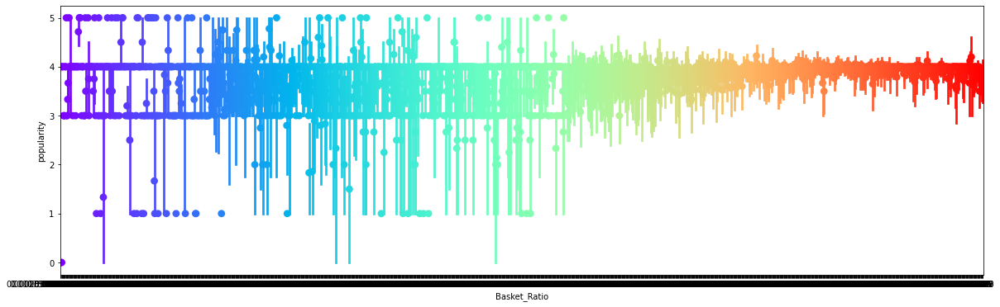

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Basket_Ratio',y="popularity",data= train_df, palette='rainbow')

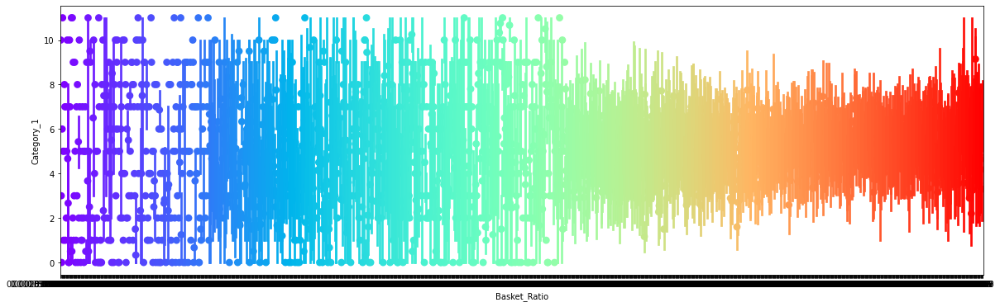

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Basket_Ratio',y="Category_1",data= train_df, palette='rainbow')

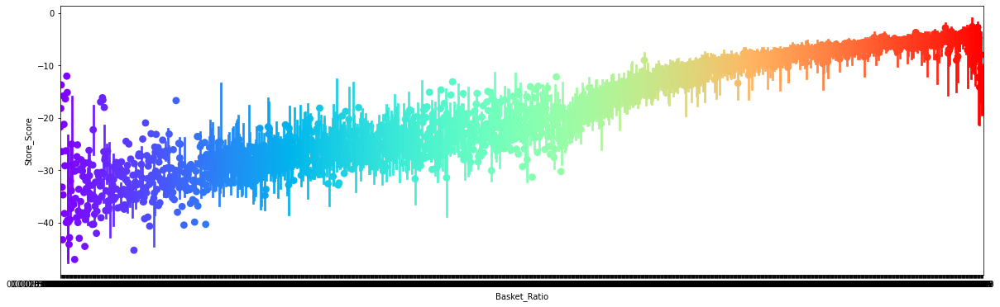

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Basket_Ratio',y="Store_Score",data= train_df, palette='rainbow')

From above point plot

There is a increase in store score when there is a increase in basket ratio. 

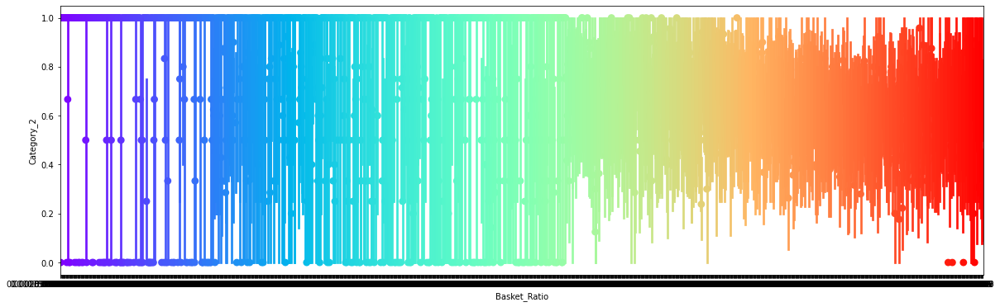

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Basket_Ratio',y="Category_2",data= train_df, palette='rainbow')

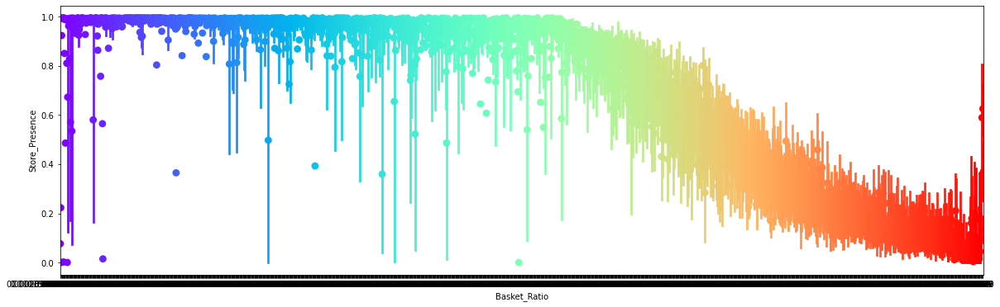

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Basket_Ratio',y="Store_Presence",data= train_df, palette='rainbow')

observation from above point plot 

there is decrease in value on store presence as value of basket ratio is increasing

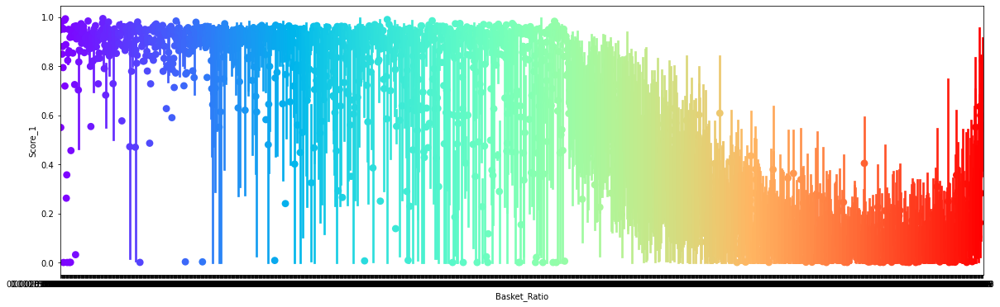

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Basket_Ratio',y="Score_1",data= train_df, palette='rainbow')

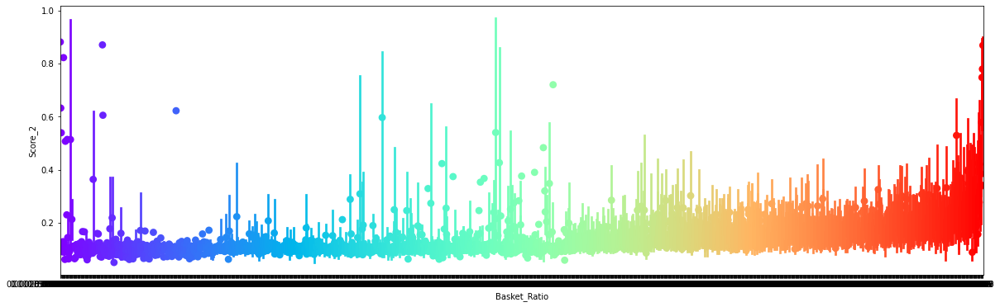

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Basket_Ratio',y="Score_2",data= train_df, palette='rainbow')

From above pointplot

1. Most of the points are between 0.0 to 0.2
2. Very few points above 0.2

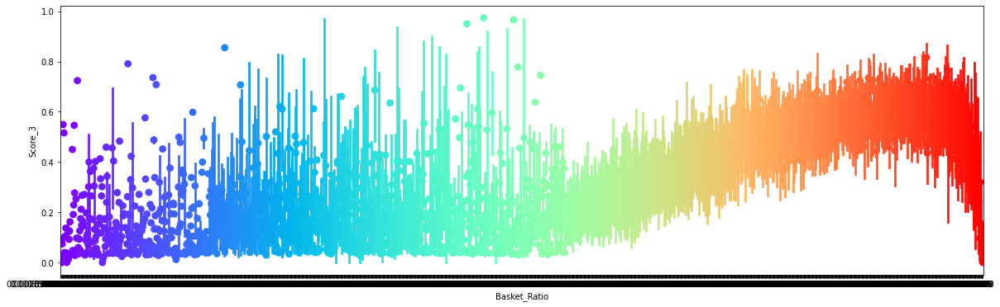

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Basket_Ratio',y="Score_3",data= train_df, palette='rainbow')

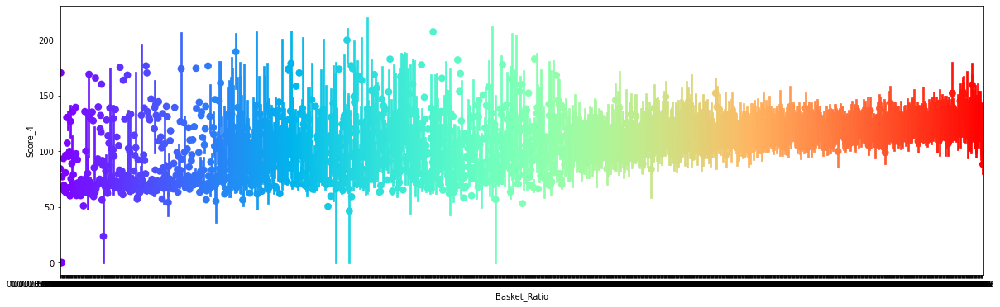

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Basket_Ratio',y="Score_4",data= train_df, palette='rainbow')

From above pointplot

Most of the points are between 50 to 150

Very few points above 150 and below 50

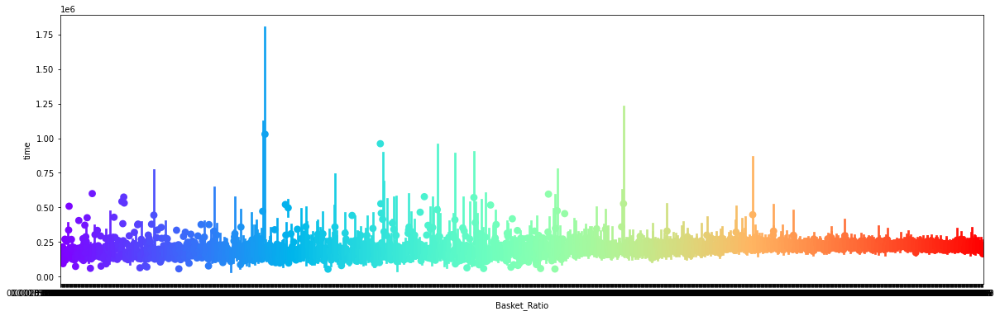

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Basket_Ratio',y="time",data= train_df, palette='rainbow')

From above pointplot

Most of the points are between 0.0 to 0.50

Very few points above 0.50



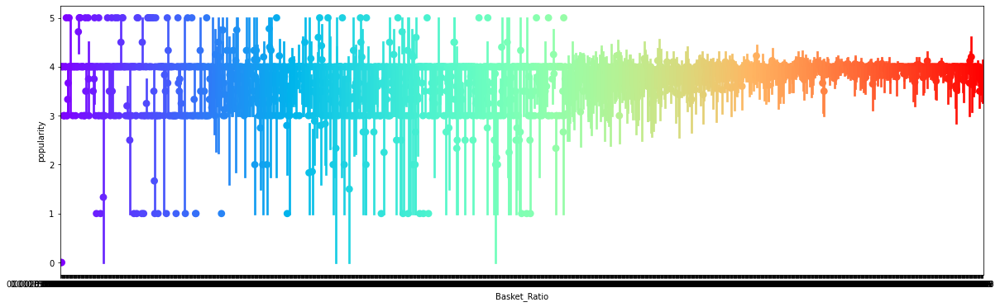

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Basket_Ratio',y="popularity",data= train_df, palette='rainbow')

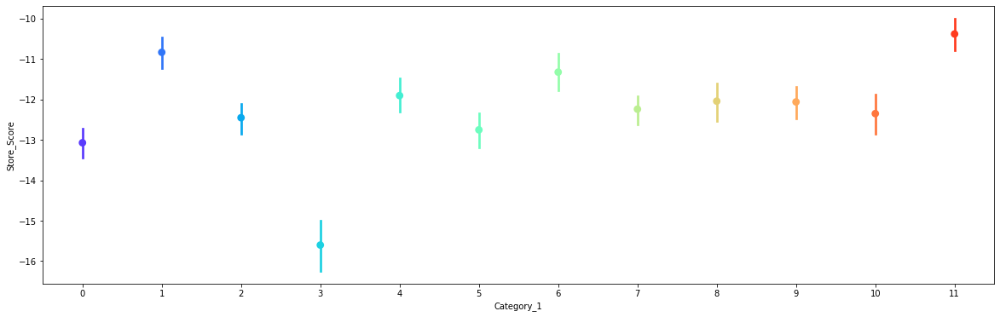

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Category_1',y="Store_Score",data= train_df, palette='rainbow')

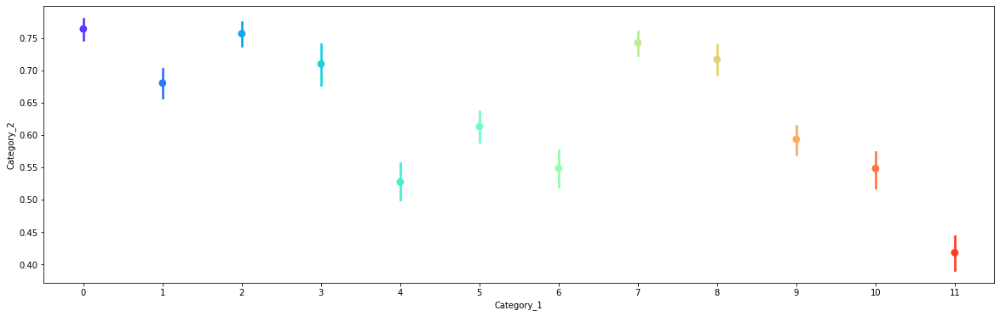

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Category_1',y="Category_2",data= train_df, palette='rainbow')

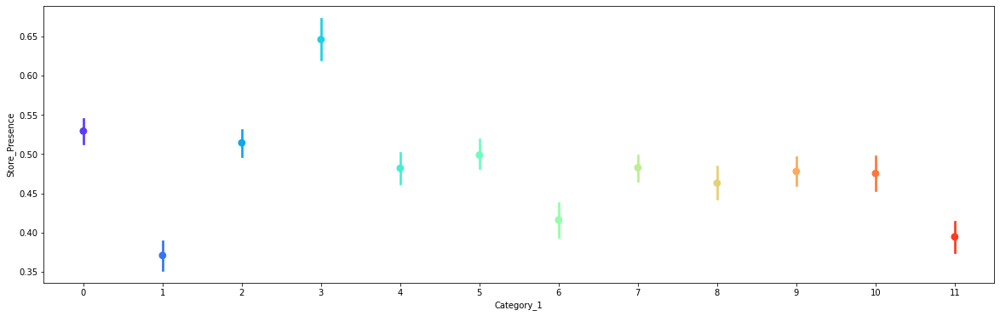

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Category_1',y="Store_Presence",data= train_df, palette='rainbow')

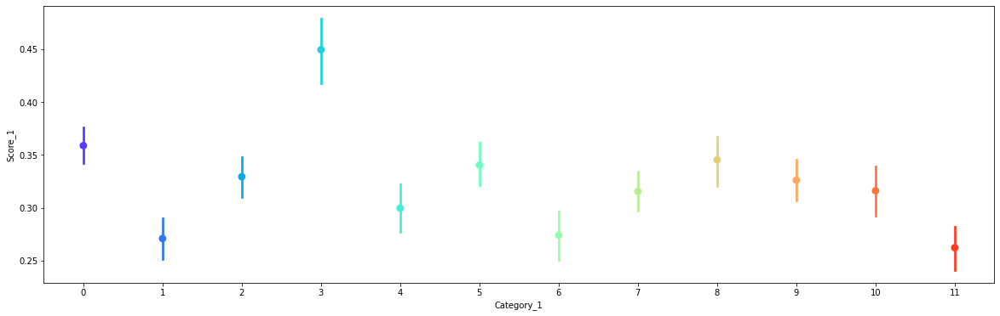

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Category_1',y="Score_1",data= train_df, palette='rainbow')

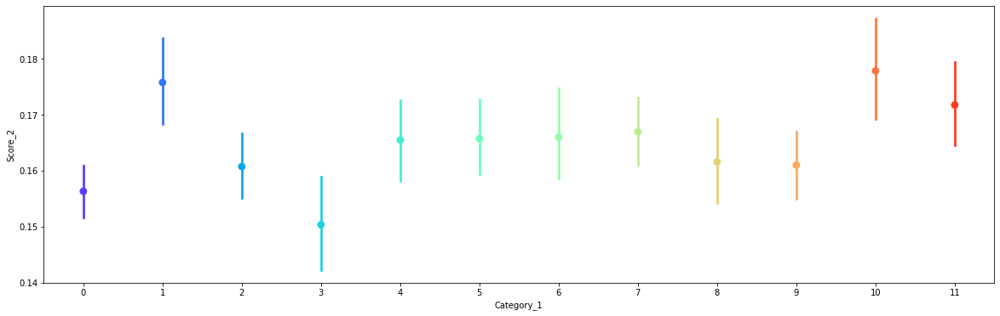

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Category_1',y="Score_2",data= train_df, palette='rainbow')

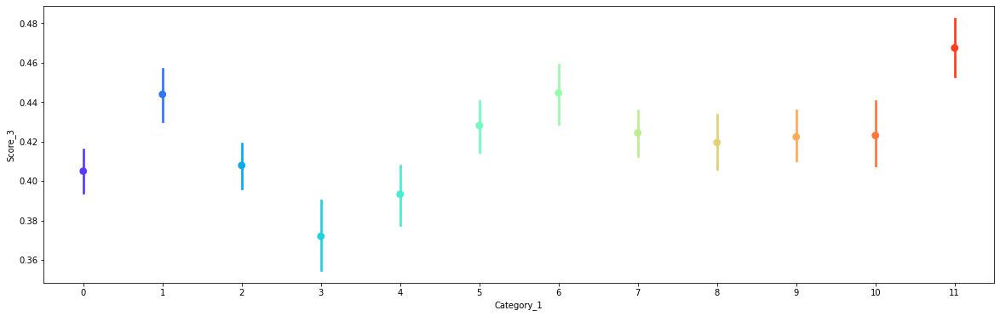

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Category_1',y="Score_3",data= train_df, palette='rainbow')

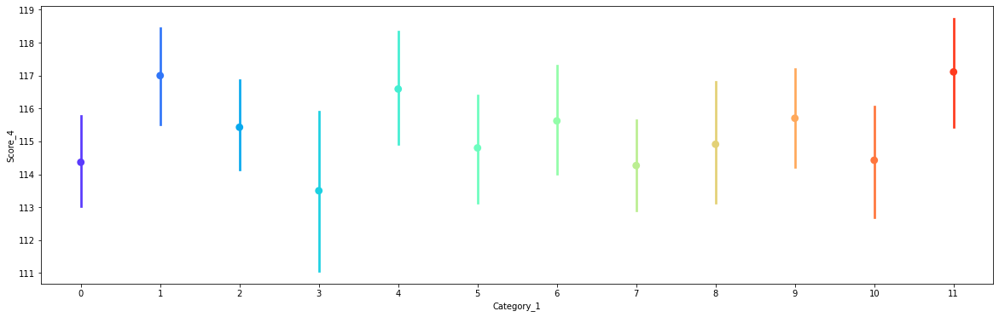

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Category_1',y="Score_4",data= train_df, palette='rainbow')

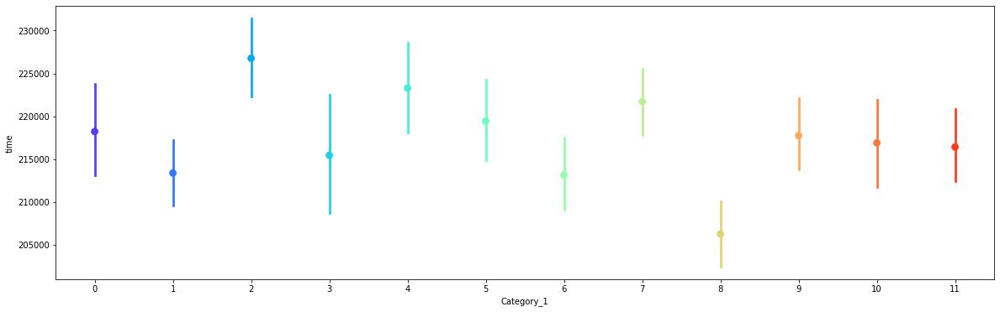

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Category_1',y="time",data= train_df, palette='rainbow')

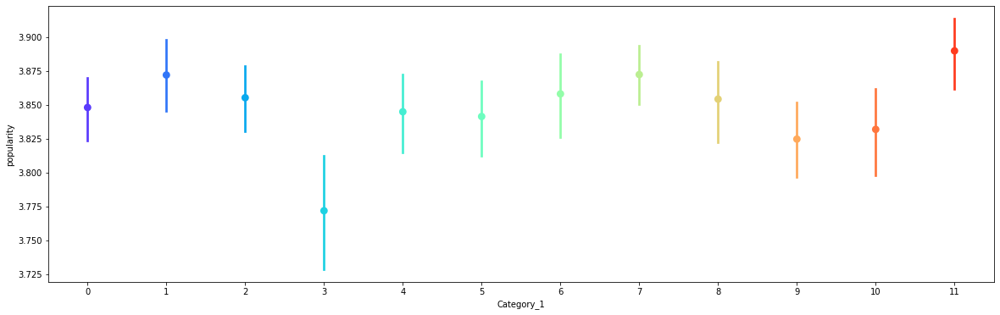

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Category_1',y="popularity",data= train_df, palette='rainbow')

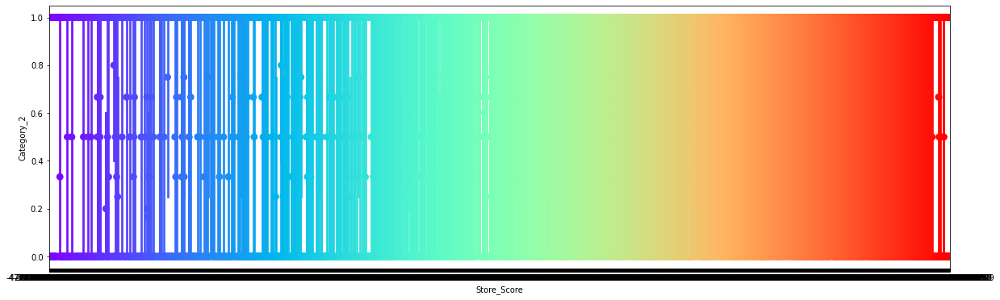

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Store_Score',y="Category_2",data= train_df, palette='rainbow')

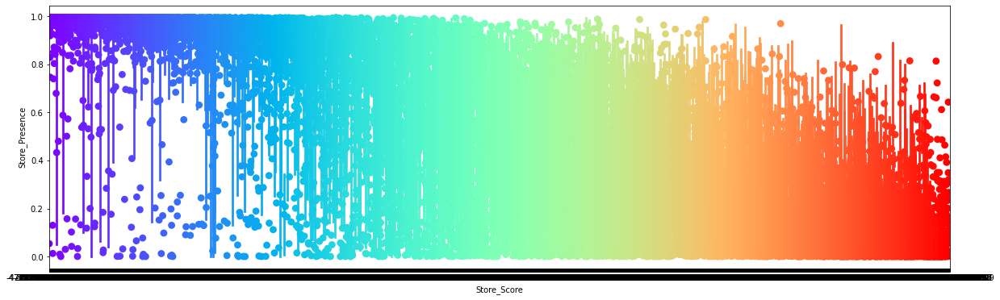

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Store_Score',y="Store_Presence",data= train_df, palette='rainbow')

as the value of store score increasing value of store presence decreasing

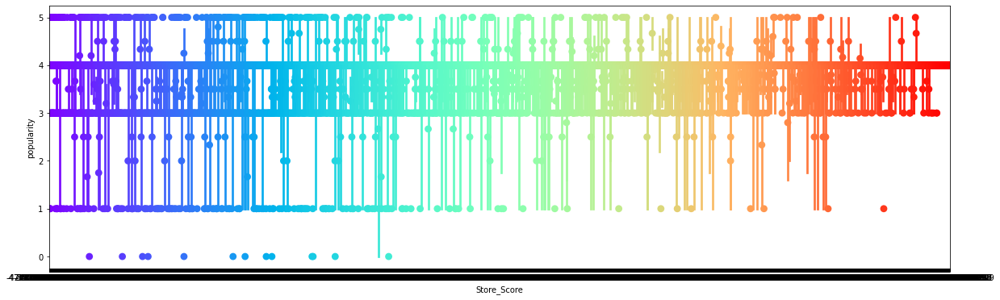

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Store_Score',y="popularity",data= train_df, palette='rainbow')

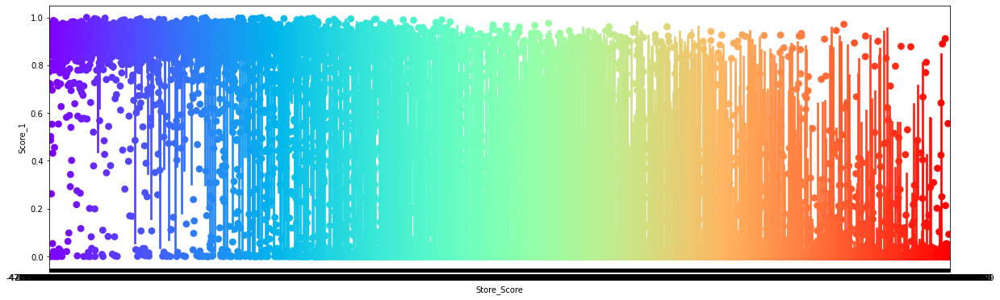

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Store_Score',y="Score_1",data= train_df, palette='rainbow')

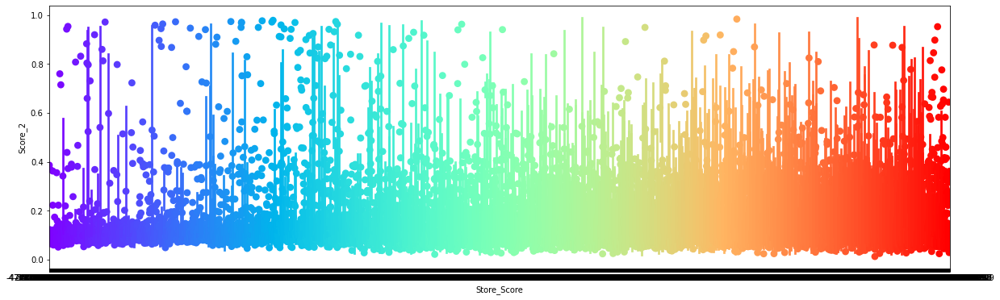

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Store_Score',y="Score_2",data= train_df, palette='rainbow')

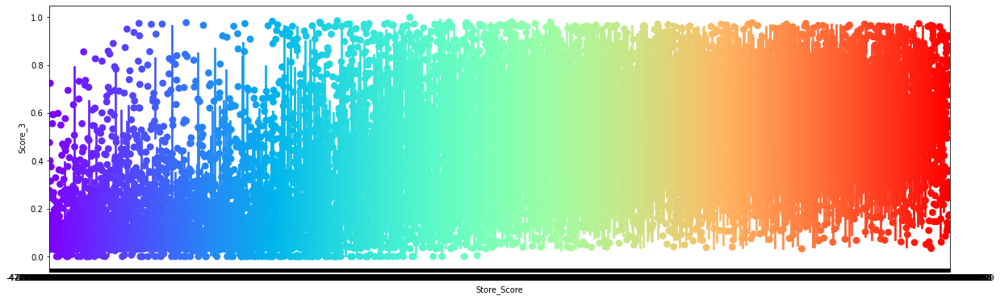

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Store_Score',y="Score_3",data= train_df, palette='rainbow')

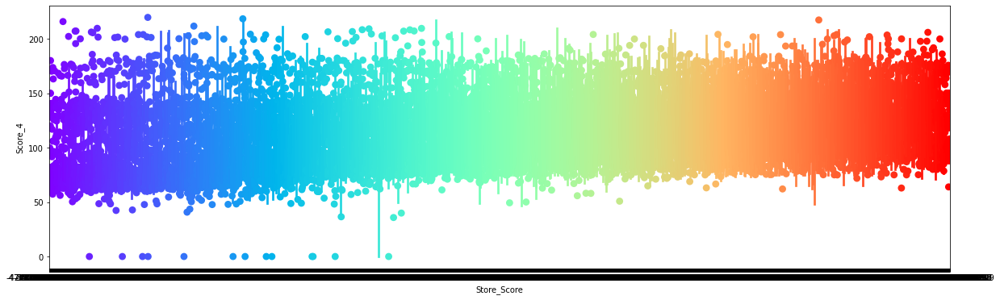

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Store_Score',y="Score_4",data= train_df, palette='rainbow')

From above pointplot

Most of the points are between 50 to 200

Very few points above 200 and below 50

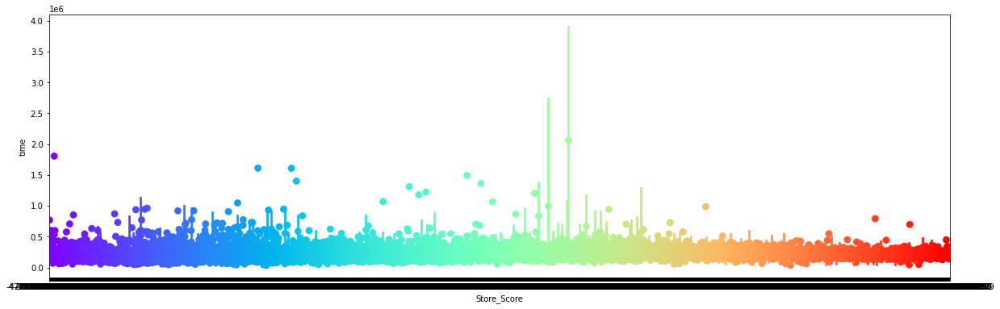

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Store_Score',y="time",data= train_df, palette='rainbow')

From above pointplot

Most of the points are between 0.0 and 0.5

Very few points above 0.5

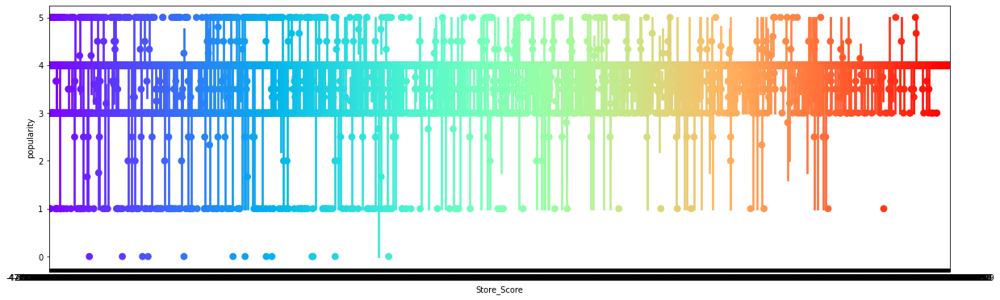

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Store_Score',y="popularity",data= train_df, palette='rainbow')

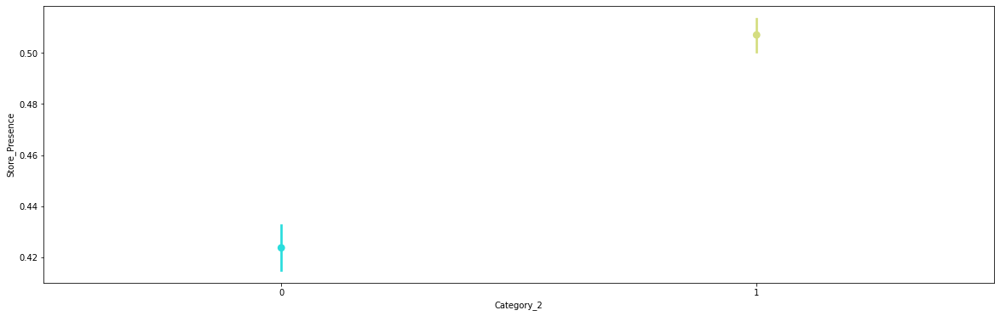

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Category_2',y="Store_Presence",data= train_df, palette='rainbow')

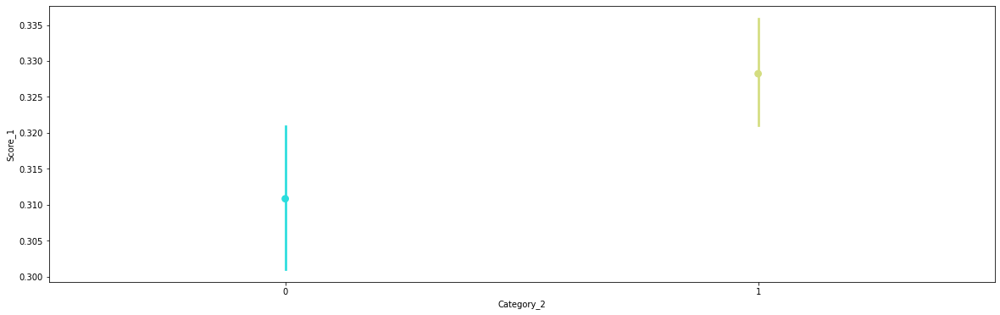

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Category_2',y="Score_1",data= train_df, palette='rainbow')

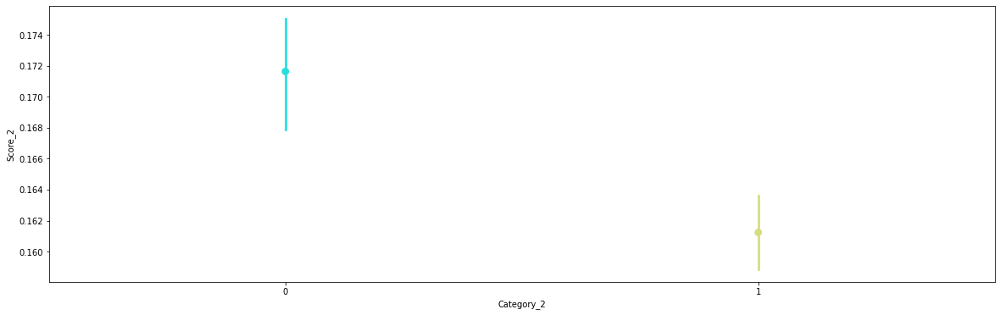

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Category_2',y="Score_2",data= train_df, palette='rainbow')

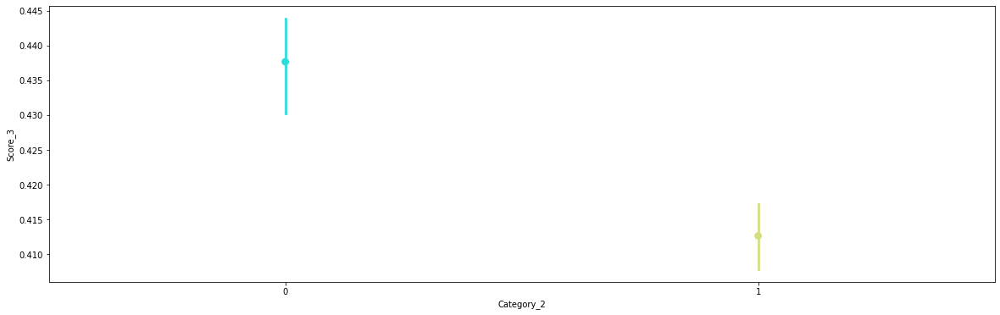

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Category_2',y="Score_3",data= train_df, palette='rainbow')

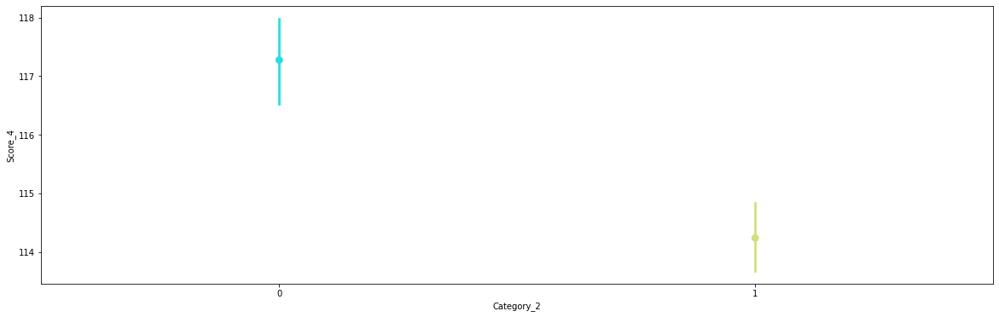

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Category_2',y="Score_4",data= train_df, palette='rainbow')

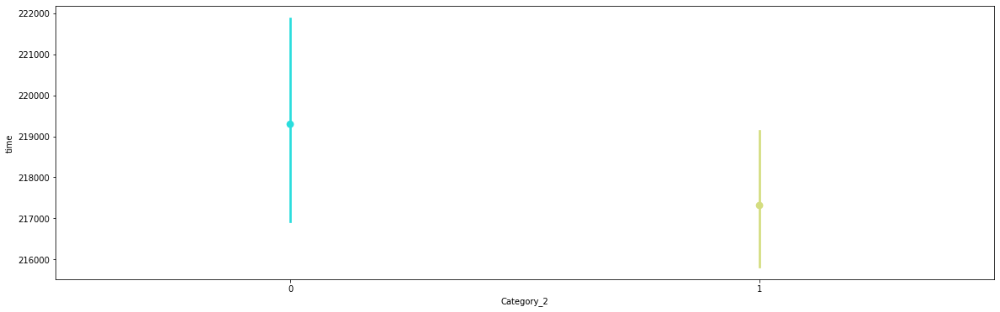

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Category_2',y="time",data= train_df, palette='rainbow')

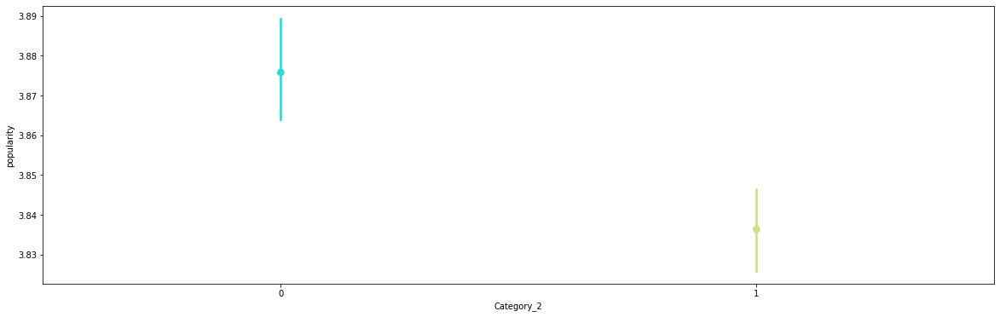

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Category_2',y="popularity",data= train_df, palette='rainbow')

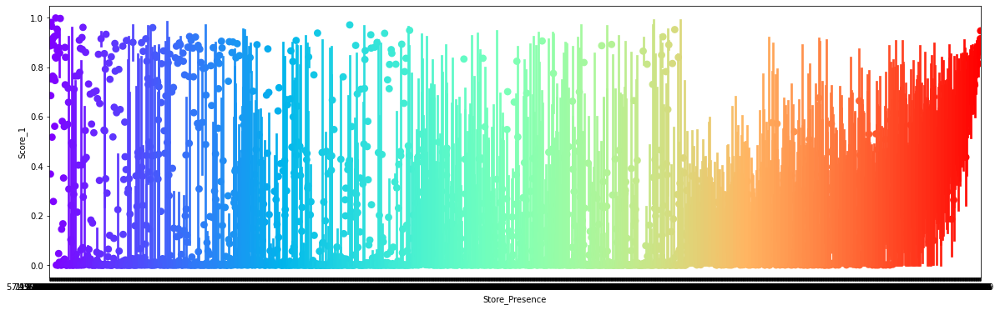

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Store_Presence',y="Score_1",data= train_df, palette='rainbow')

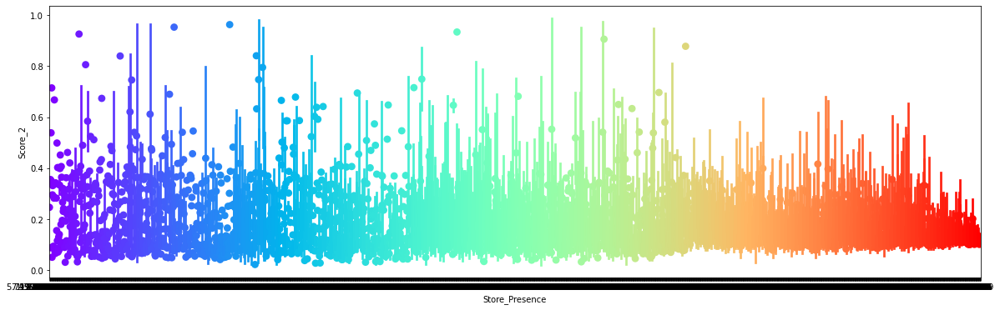

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Store_Presence',y="Score_2",data= train_df, palette='rainbow')

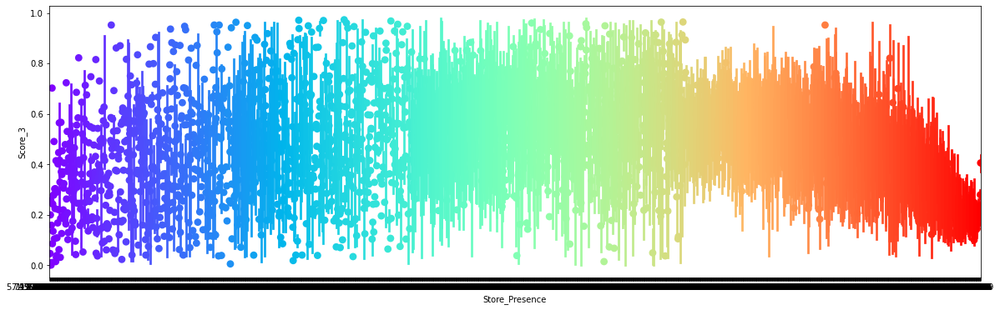

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Store_Presence',y="Score_3",data= train_df, palette='rainbow')

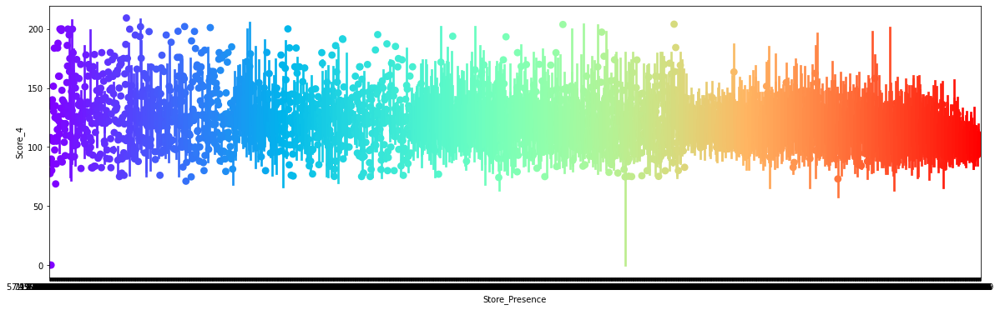

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Store_Presence',y="Score_4",data= train_df, palette='rainbow')

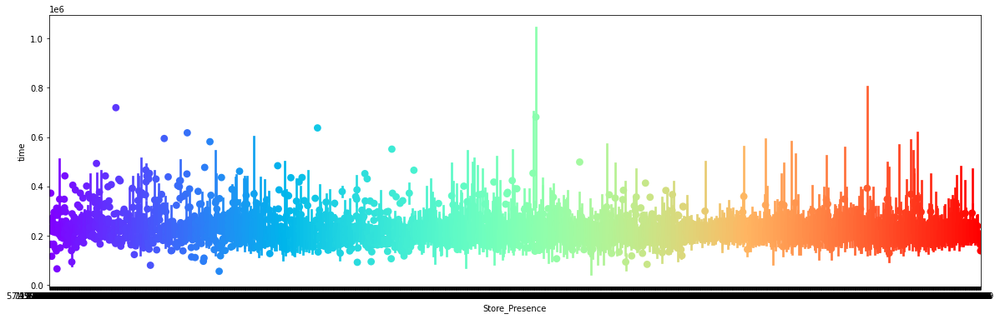

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Store_Presence',y="time",data= train_df, palette='rainbow')

From above pointplot

Most of the points are between 0.1 and 0.4

Very few points above 0.4 and below 0,1

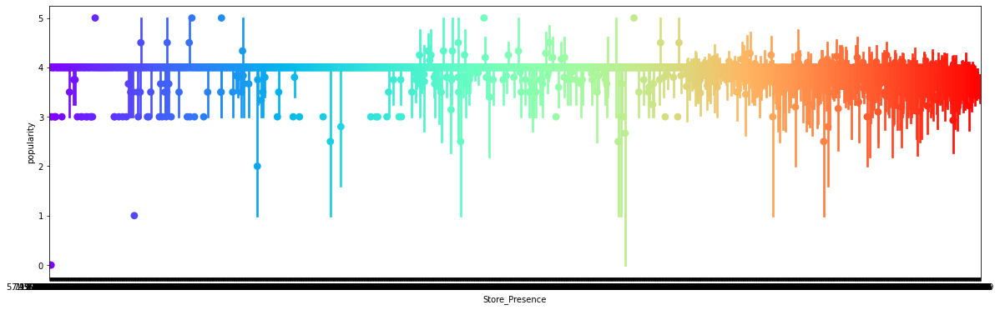

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Store_Presence',y="popularity",data= train_df, palette='rainbow')

From above pointplot

Most of the points are between 3 to 4

Very few points above 4 and below 3

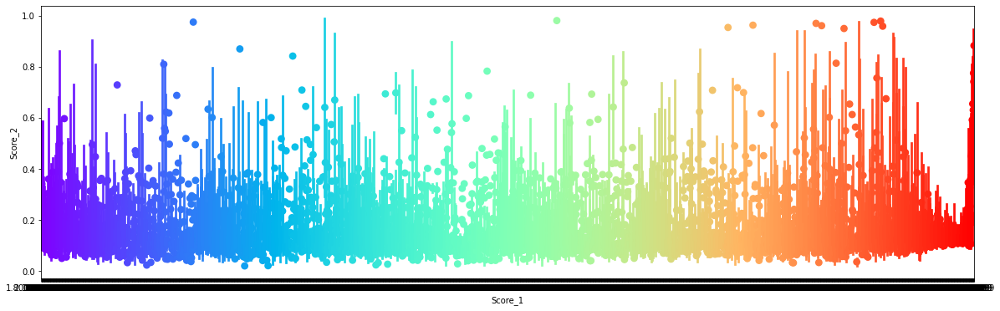

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Score_1',y="Score_2",data= train_df, palette='rainbow')

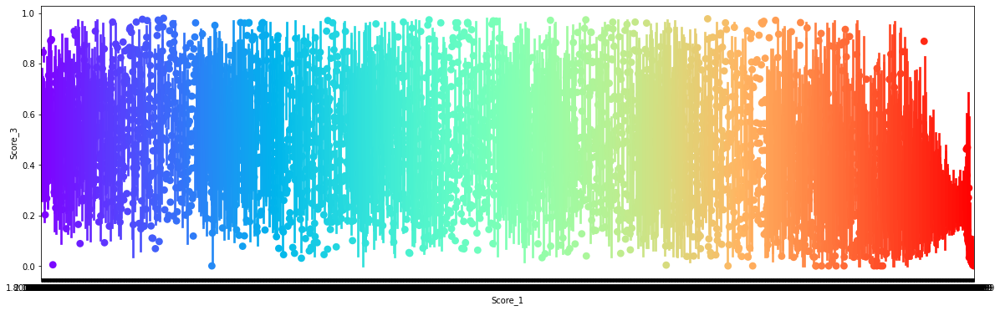

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Score_1',y="Score_3",data= train_df, palette='rainbow')

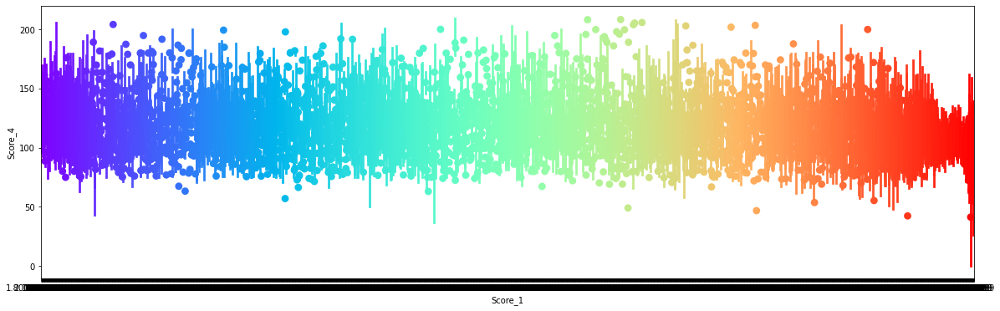

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Score_1',y="Score_4",data= train_df, palette='rainbow')

From above pointplot

Most of the points are between 75 to 175
Very few points above 175 and below 75

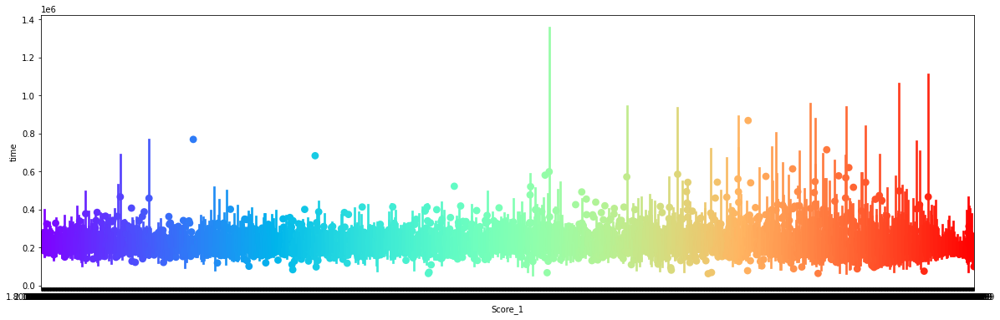

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Score_1',y="time",data= train_df, palette='rainbow')

From above pointplot

1. Most of the points are between 0.1 to 0.4
2. Very few points above 0.4

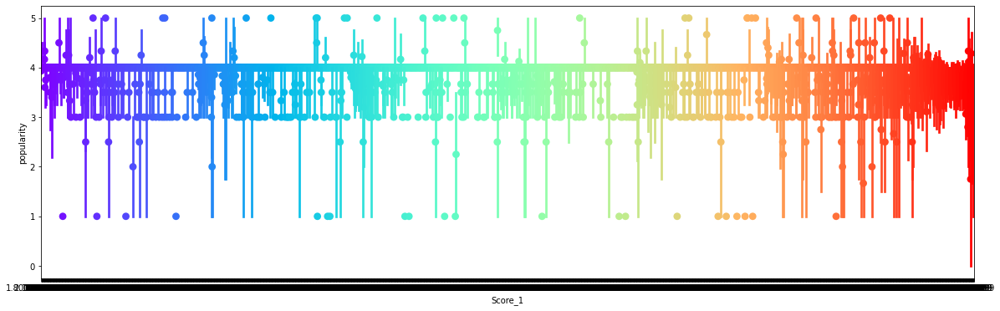

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Score_1',y="popularity",data= train_df, palette='rainbow')

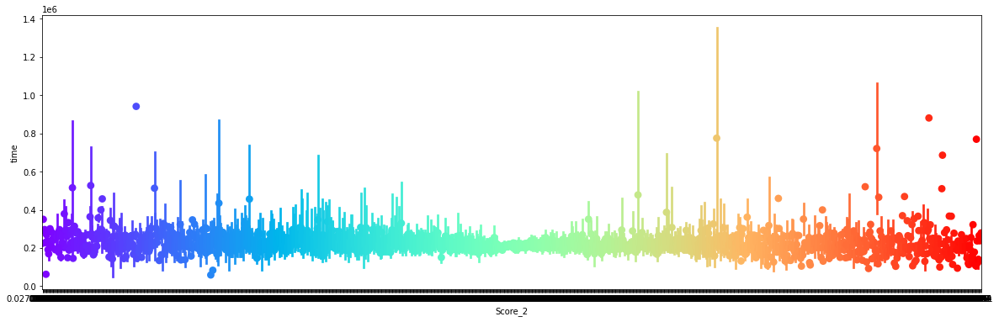

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Score_2',y="time",data= train_df, palette='rainbow')

From above pointplot

1. Most of the points are between 1 to 3

2. Very few points above 3

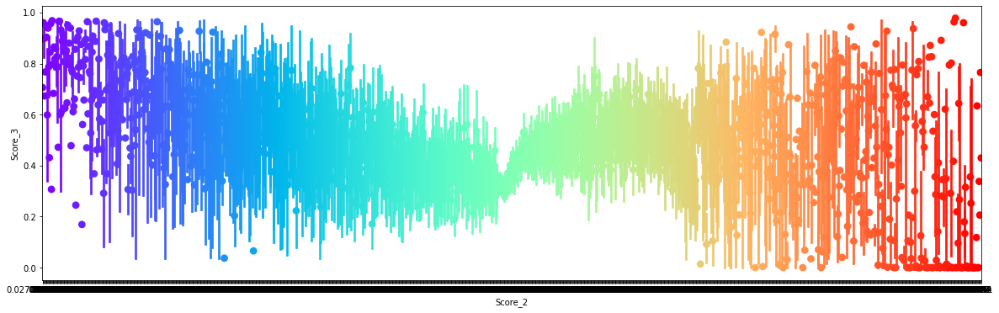

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Score_2',y="Score_3",data= train_df, palette='rainbow')

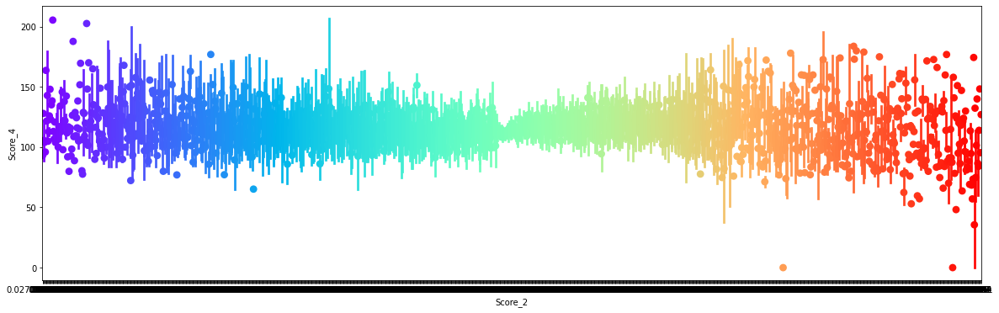

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Score_2',y="Score_4",data= train_df, palette='rainbow')

From above pointplot

Most of the points are between 75 to 150

Very few points above 150 and below 75

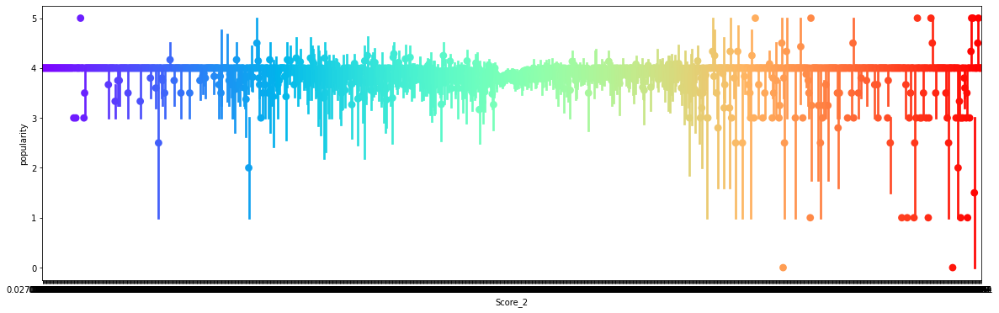

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Score_2',y="popularity",data= train_df, palette='rainbow')

From above pointplot

1. Most of the points are around 4
2. few points are between 3 and 4
3. very few are below 3

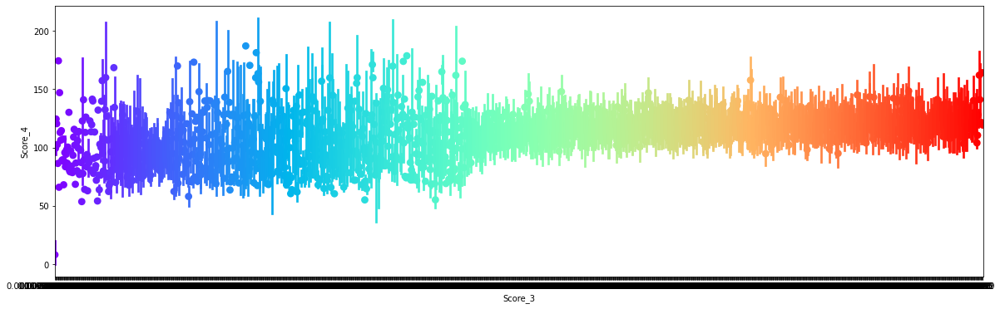

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Score_3',y="Score_4",data= train_df, palette='rainbow')

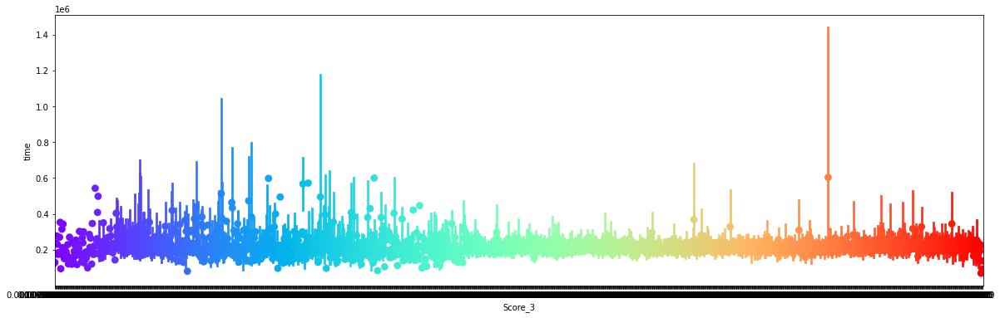

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Score_3',y="time",data= train_df, palette='rainbow')

From above pointplot

Most of the points are between o.0 to 0.4

Very few points above 0.4

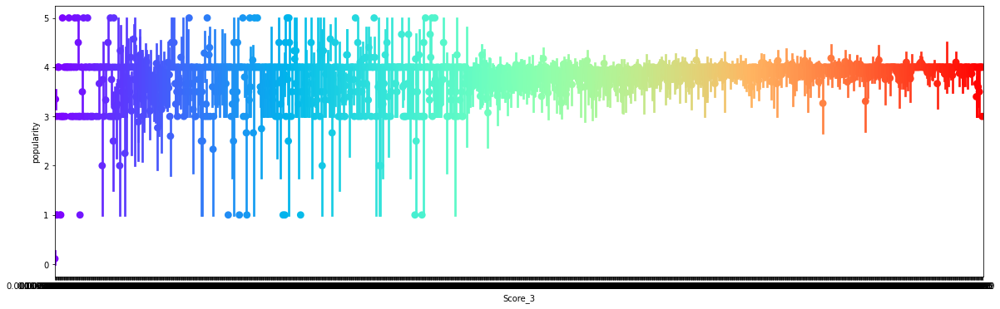

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Score_3',y="popularity",data= train_df, palette='rainbow')

From above pointplot

Most of the points are between 3 to 4

Very few points above 4 and below 3

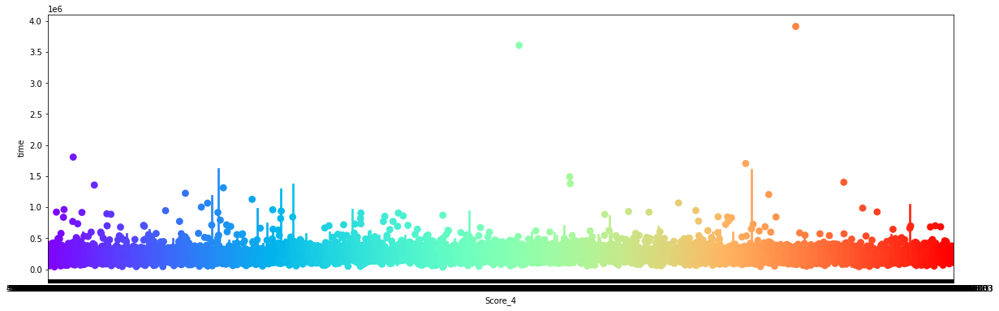

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Score_4',y="time",data= train_df, palette='rainbow')

From above pointplot

1. Most of the points are between o to 0.5
2. Very few points above 0.5

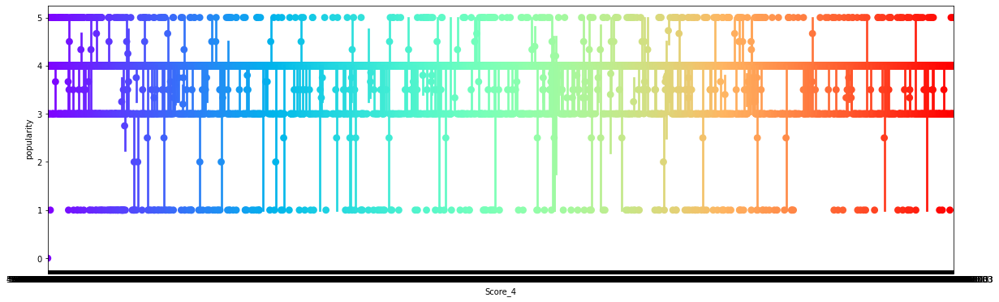

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Score_4',y="popularity",data= train_df, palette='rainbow')

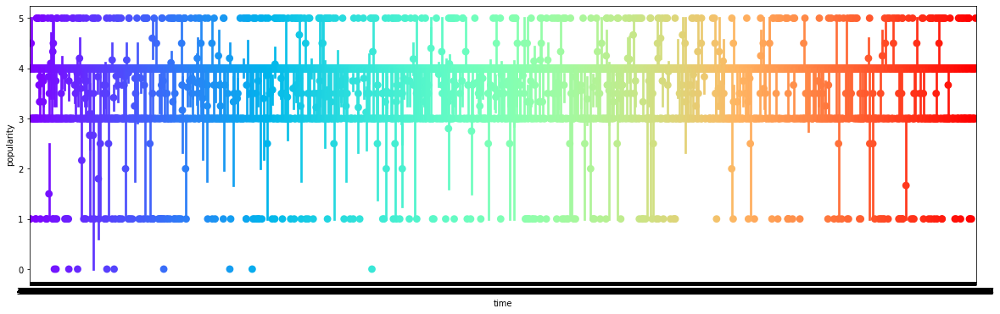

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='time',y="popularity",data= train_df, palette='rainbow')

SWARM PLOT

In [ ]:
# swarn plot
plt.figure(figsize=(20,6))
sns.swarmplot(x='Store_Ratio',y="Basket_Ratio",data= train_df, palette='rainbow')

COMBINE PLOT

In [ ]:
# combine plot 
plt.figure(figsize=(20,6))
sns.boxenplot(x='Store_Ratio',y="Basket_Ratio",data=train_df, palette='rainbow')
sns.swarmplot(x='Store_Ratio',y="Basket_Ratio",data=train_df, palette='rainbow')

# DISTPLOT

Store_Ratio


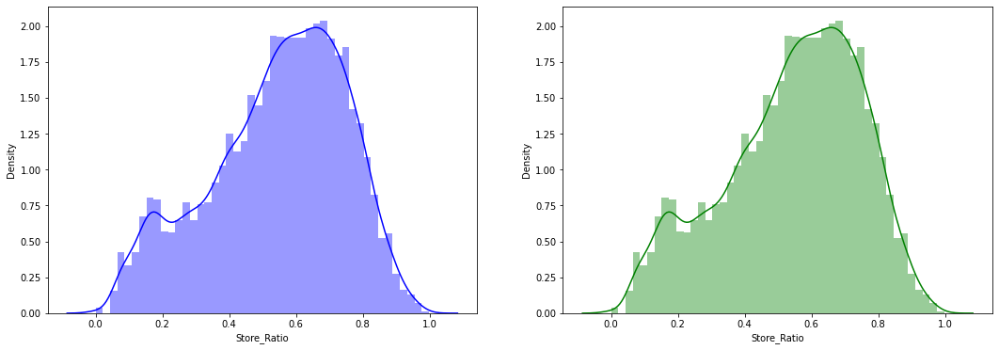

Basket_Ratio


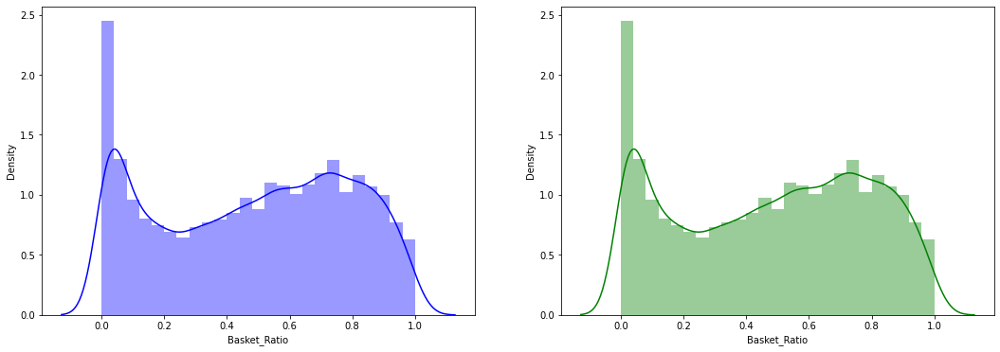

Category_1


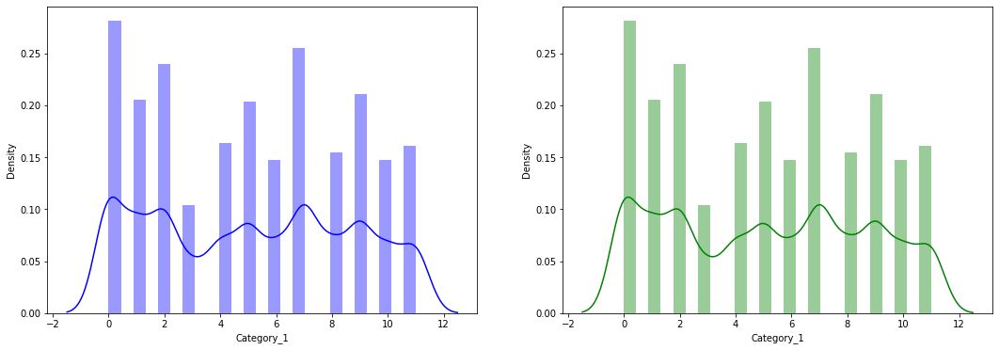

Store_Score


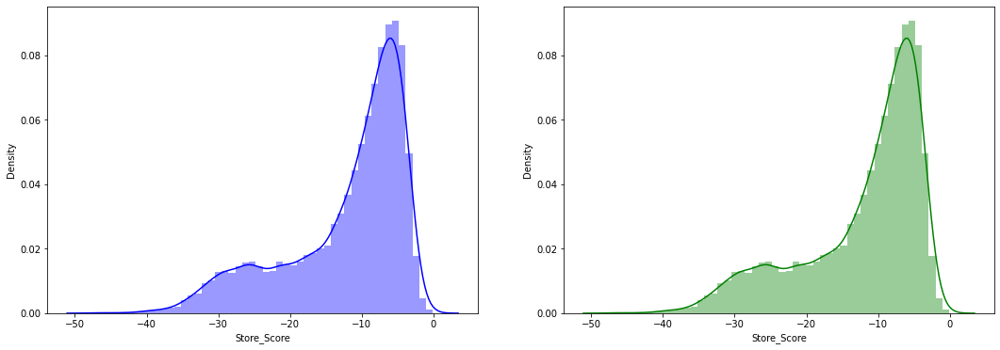

Category_2


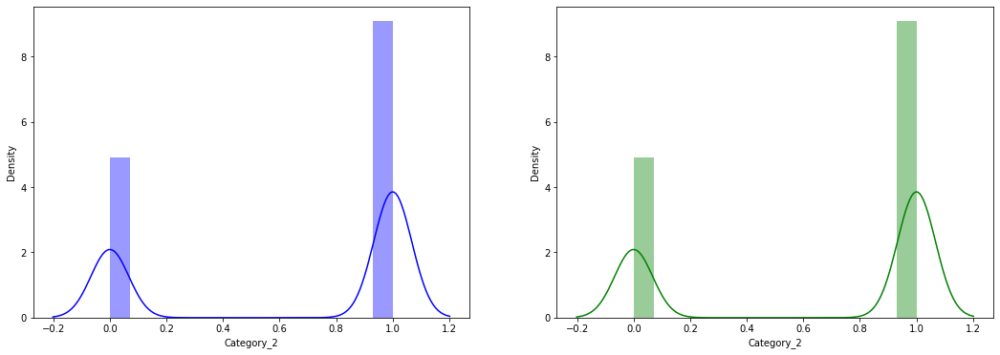

Store_Presence


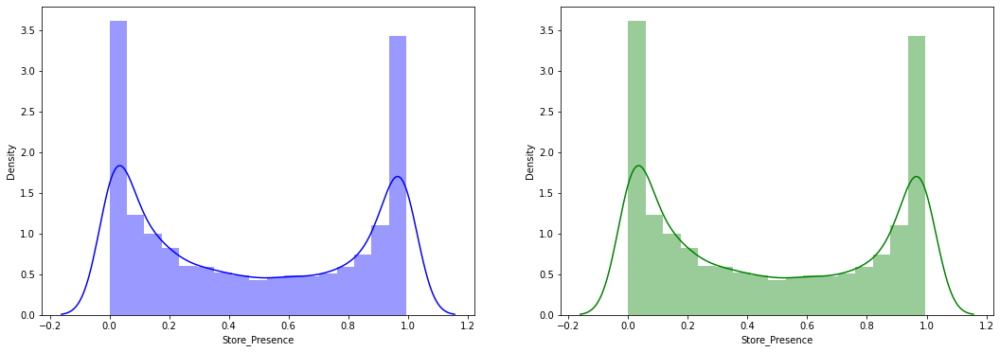

Score_1


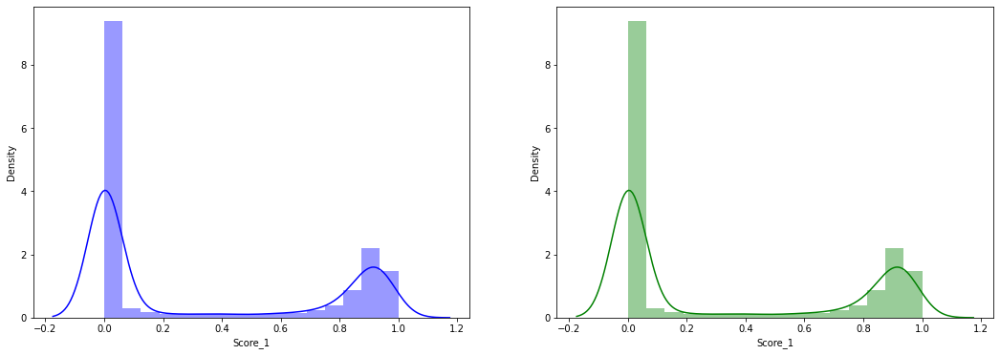

Score_2


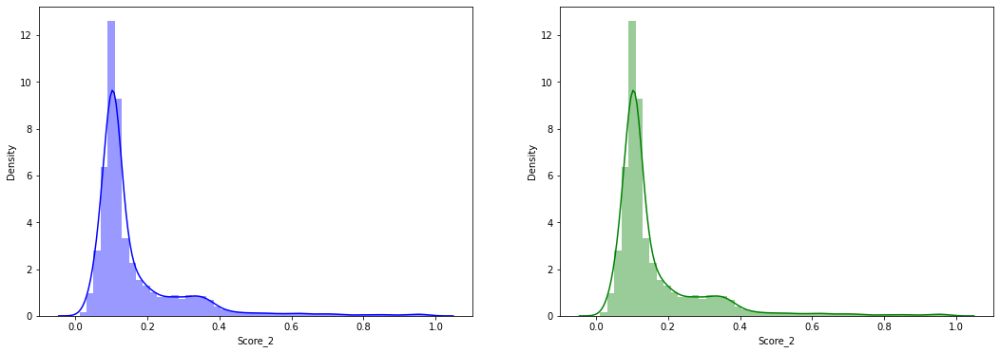

Score_3


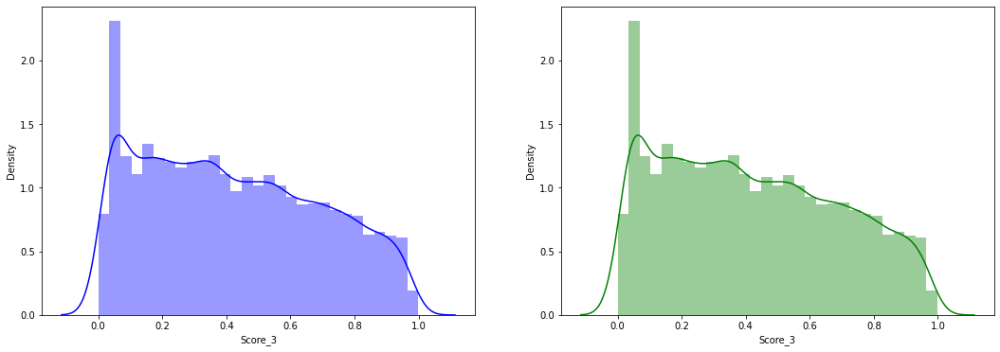

Score_4


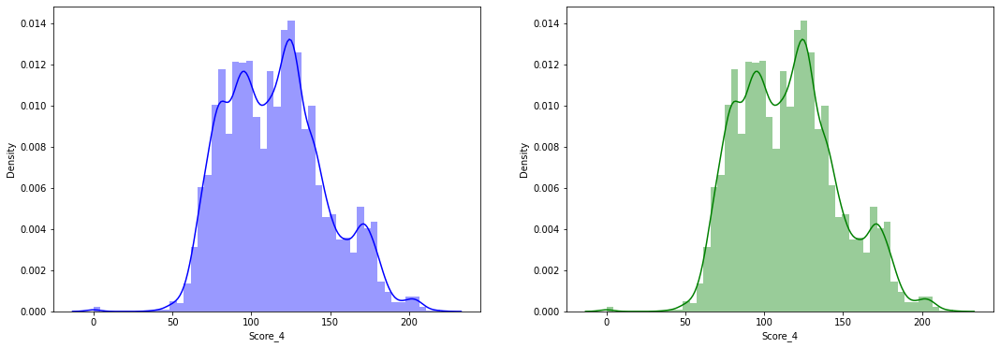

time


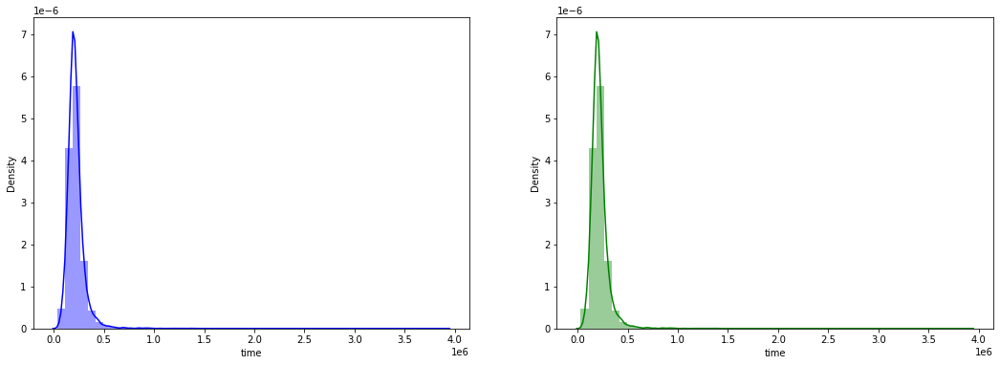

popularity


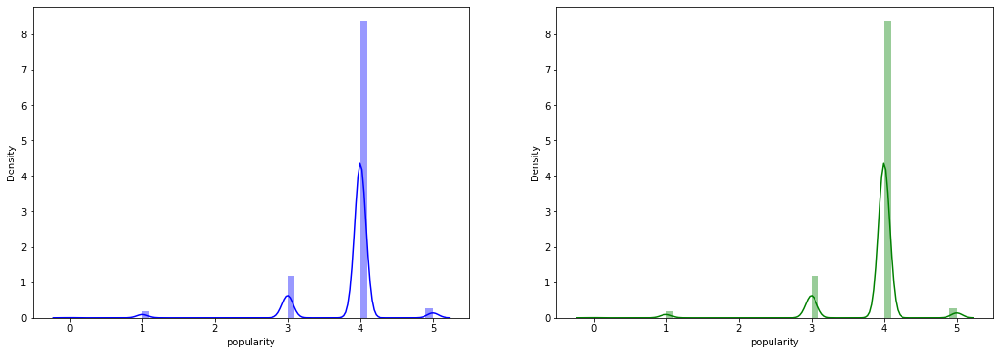

In [ ]:
for column in df.columns:
    print(column)
    fig,ax = plt.subplots(nrows=1,ncols=2,figsize=(18,6))
    sns.distplot(df[column],ax=ax[0],color="blue")
    sns.distplot(df[column],ax=ax[1],color="green")
    plt.show()

OBSERVATIONS
1. distribution of store ratio, store presence, score3 and popularity are right skewed
2. distribution of basket ratio, score2 and time are skewed left
3. distribution of category 1 is multimodal
4. distribution of category2 and score1 are bimodal

# dendrogram

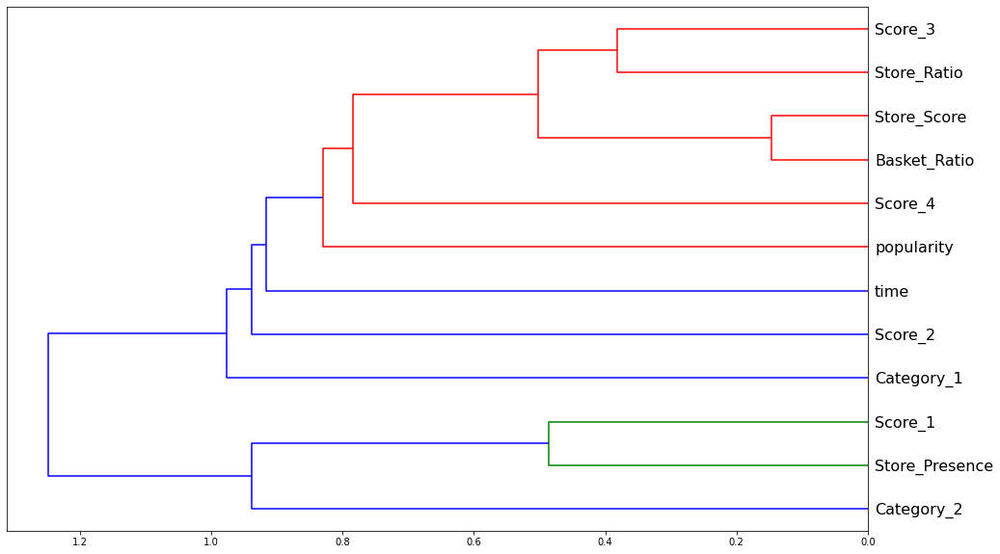

In [ ]:
# Plot a Dendrogram on the columns of the dataset

# droping the NaN values
X = train_df.dropna()

import scipy
from scipy.cluster import hierarchy as hc

corr = np.round(scipy.stats.spearmanr(X).correlation, 4)
corr_condensed = hc.distance.squareform(1-corr)
z = hc.linkage(corr_condensed, method='average')
fig = plt.figure(figsize=(16,10))
dendrogram = hc.dendrogram(z, labels=X.columns, orientation='left', leaf_font_size=16)
plt.show()

strongly correlated variables
1. score3 and store ratio
2. store score and basket ratio
3. score1 and store presence

# Boxen plot

The boxen plot, otherwise known as a Letter-value plot, is a box plot meant for large data sets (n > 10,000).

The Boxen plot is very similar to box plot, except for the fact that it plots different quartile values.

By plotting different quartile values, we are able to understand the shape of the distribution particularly in the head end and tail end.

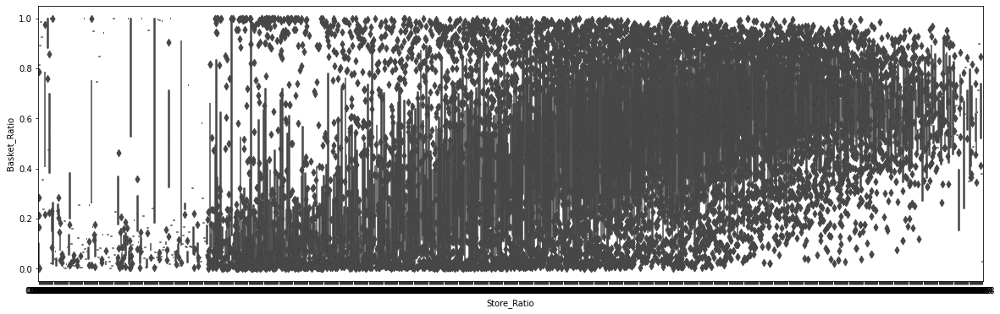

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Store_Ratio',y="Basket_Ratio",data= train_df, palette='rainbow')

there is positive correlation betwwen store ratio and basket ratio.

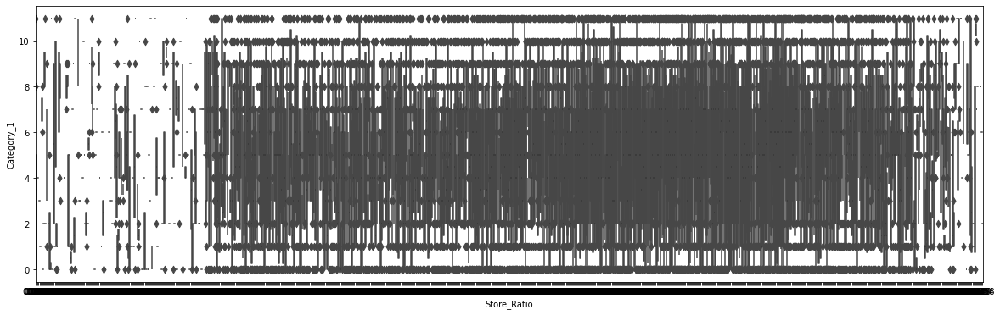

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Store_Ratio',y="Category_1",data= train_df, palette='rainbow')

there is no relation between store ratio and category 1

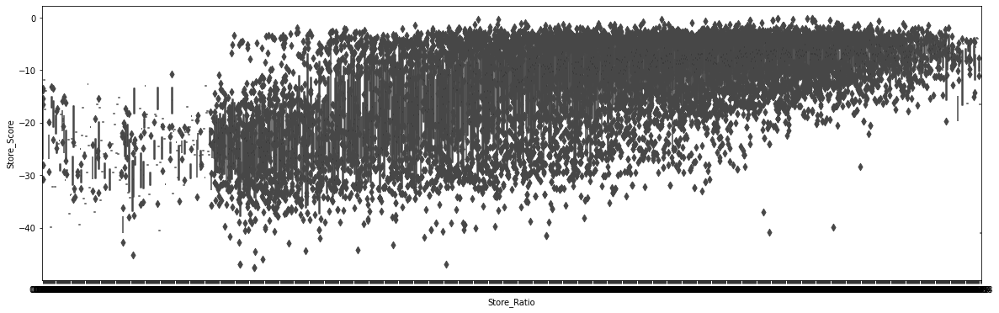

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Store_Ratio',y="Store_Score",data= train_df, palette='rainbow')

there is positive correlation between store ratio and store score.

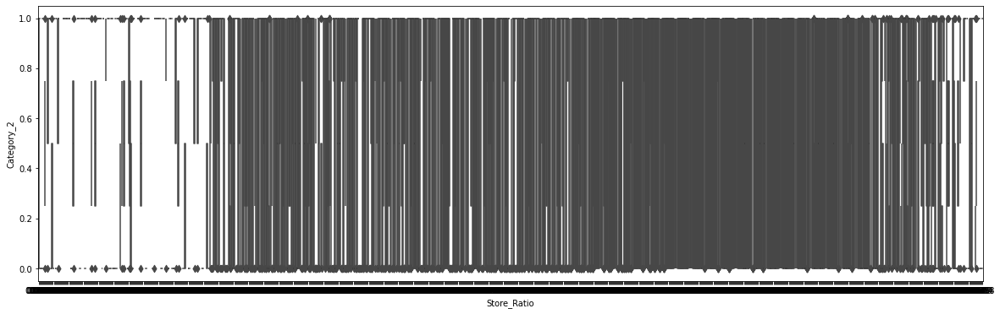

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Store_Ratio',y="Category_2",data= train_df, palette='rainbow')

there is weak correlation between store ratio and category 2

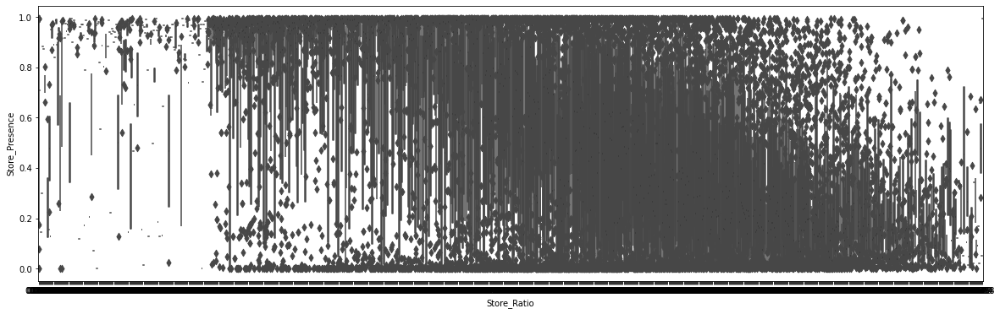

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Store_Ratio',y="Store_Presence",data= train_df, palette='rainbow')

there is strong negative correlation between store presence and store ratio

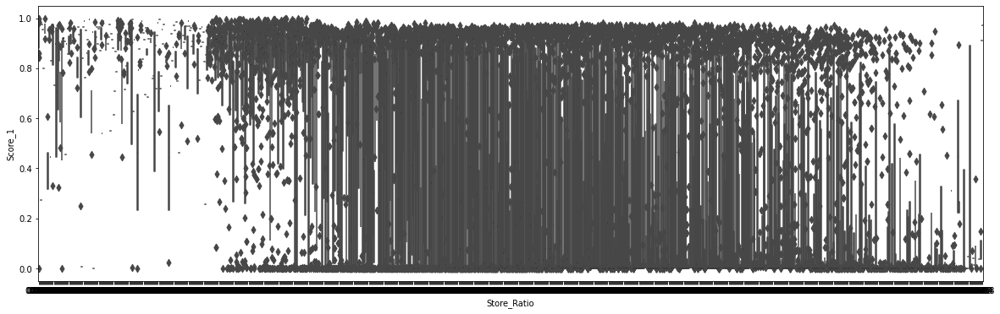

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Store_Ratio',y="Score_1",data= train_df, palette='rainbow')

there is weak correlation between store ratio and score1

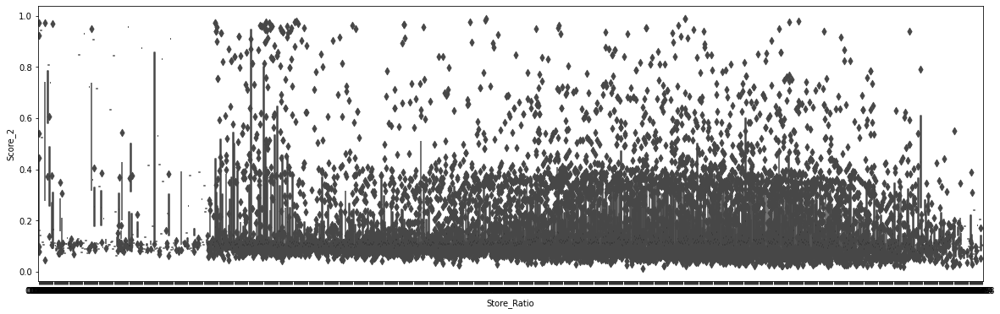

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Store_Ratio',y="Score_2",data= train_df, palette='rainbow')

there is no relation between store ratio and score 2

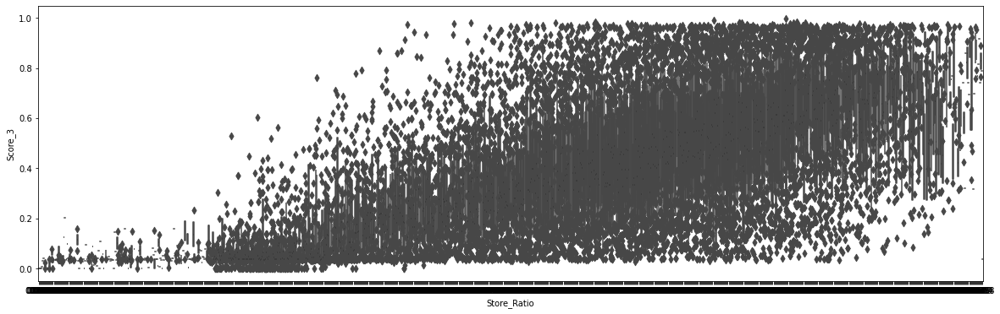

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Store_Ratio',y="Score_3",data= train_df, palette='rainbow')

there is positive correlation with store ratio and score 3

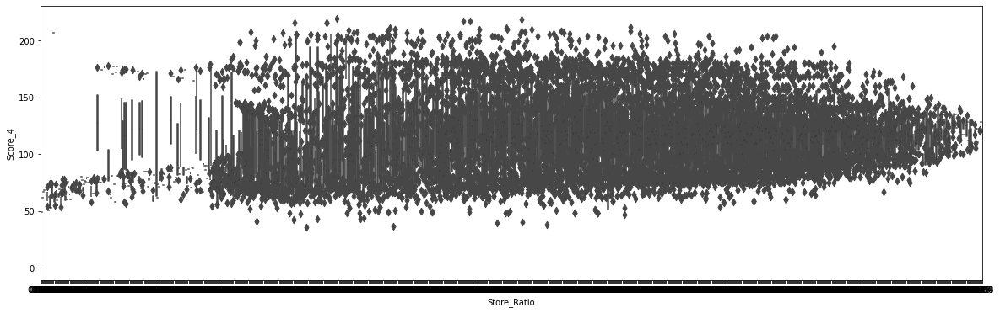

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Store_Ratio',y="Score_4",data= train_df, palette='rainbow')

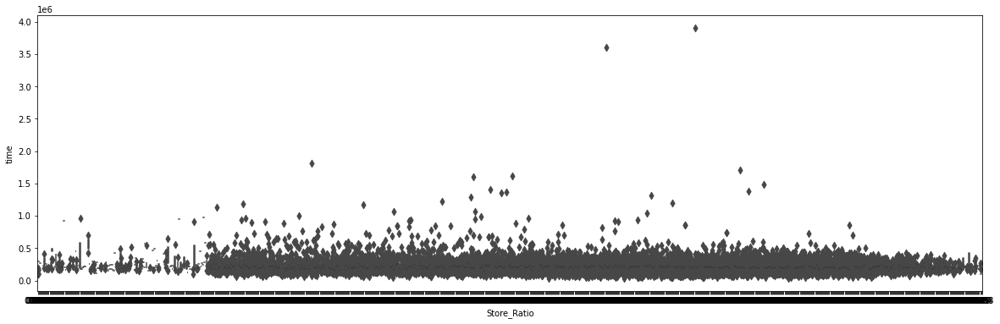

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Store_Ratio',y="time",data= train_df, palette='rainbow')

there is no relation between store ratio and time

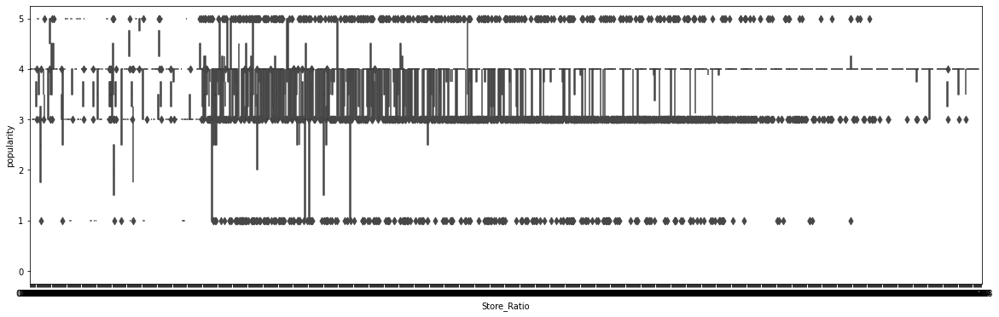

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Store_Ratio',y="popularity",data= train_df, palette='rainbow')

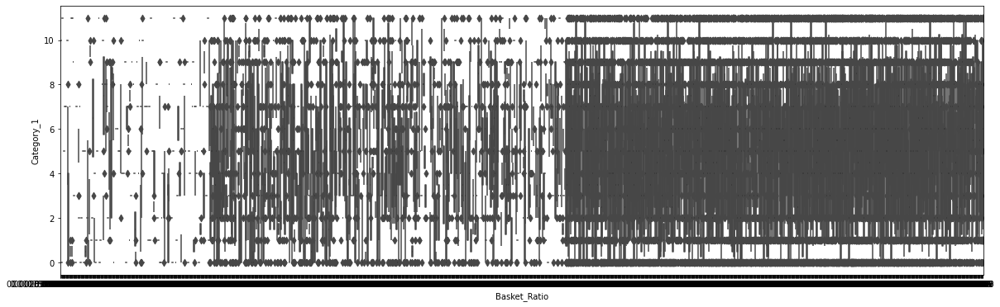

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Basket_Ratio',y="Category_1",data= train_df, palette='rainbow')

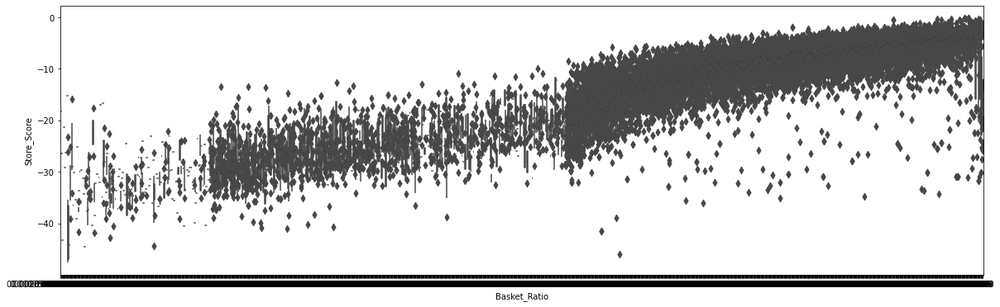

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Basket_Ratio',y="Store_Score",data= train_df, palette='rainbow')

there is a positive correlation between store score and basket ratio

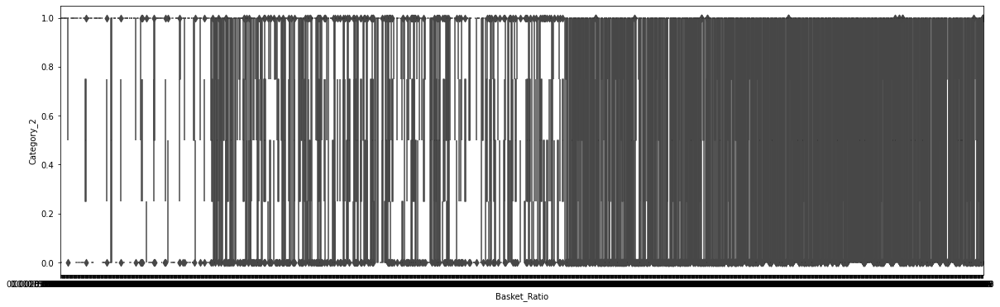

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Basket_Ratio',y="Category_2",data= train_df, palette='rainbow')

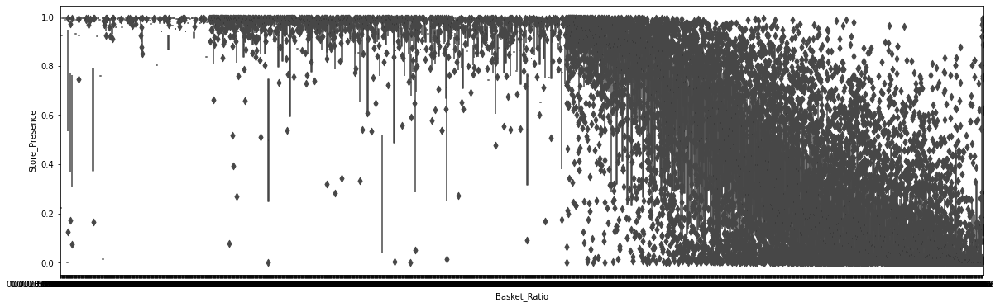

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Basket_Ratio',y="Store_Presence",data= train_df, palette='rainbow')

after a certain point as the value ok basket ratio is increasing value of store presence is decreasing

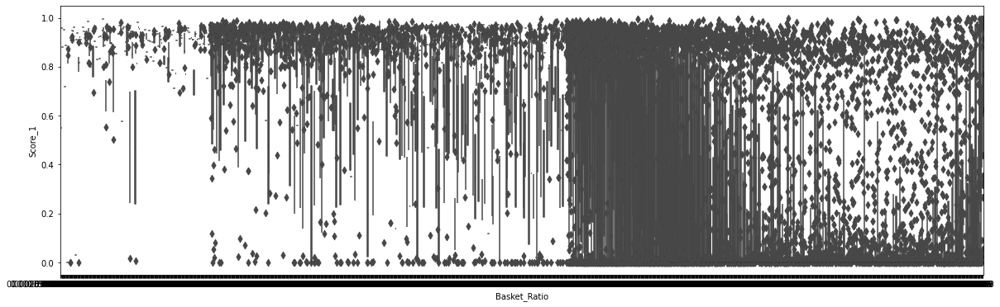

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Basket_Ratio',y="Score_1",data= train_df, palette='rainbow')

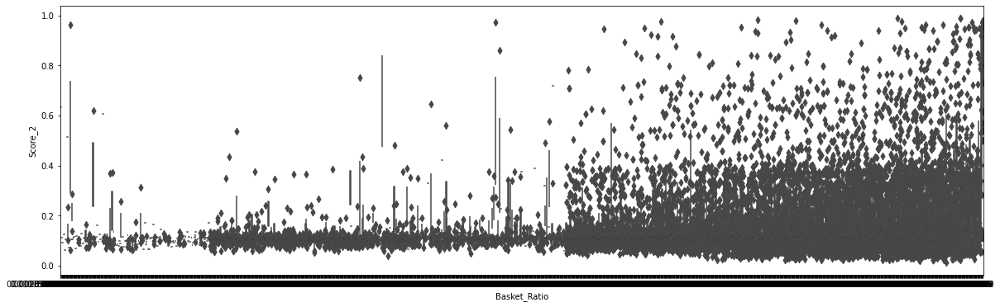

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Basket_Ratio',y="Score_2",data= train_df, palette='rainbow')

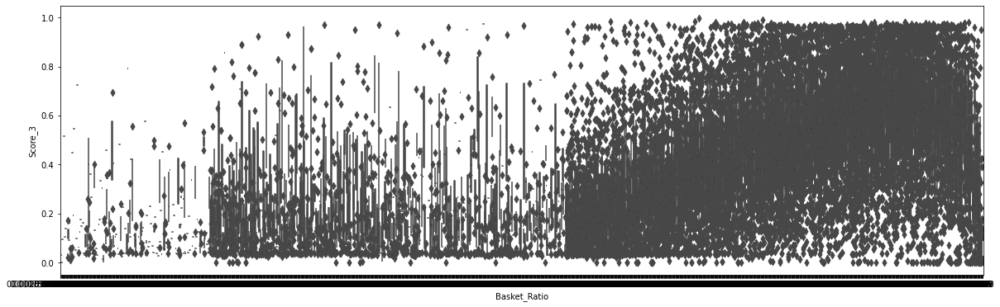

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Basket_Ratio',y="Score_3",data= train_df, palette='rainbow')

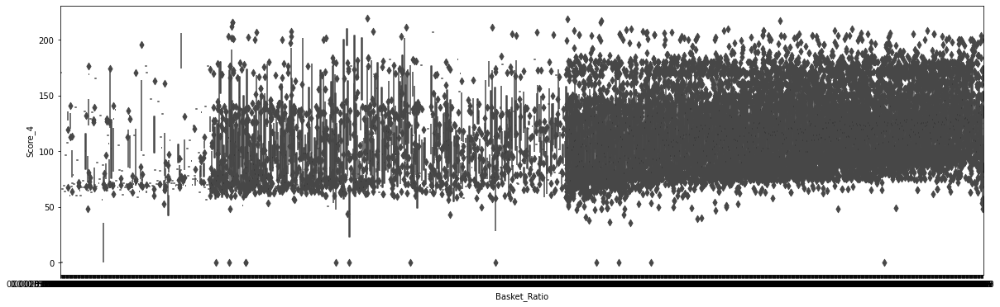

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Basket_Ratio',y="Score_4",data= train_df, palette='rainbow')

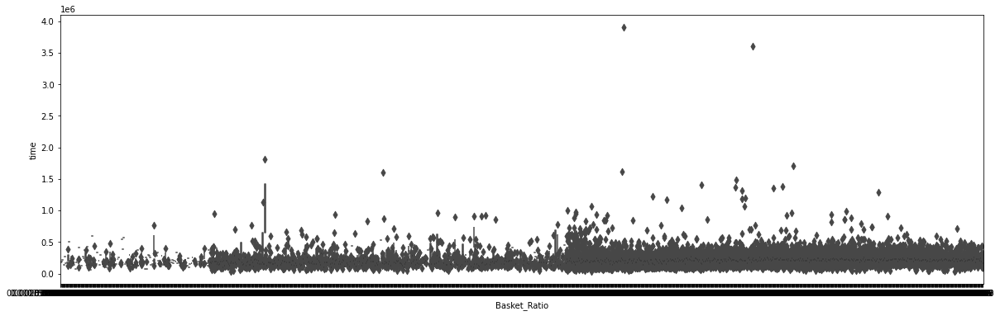

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Basket_Ratio',y="time",data= train_df, palette='rainbow')

there is no relation between time and basker ratio

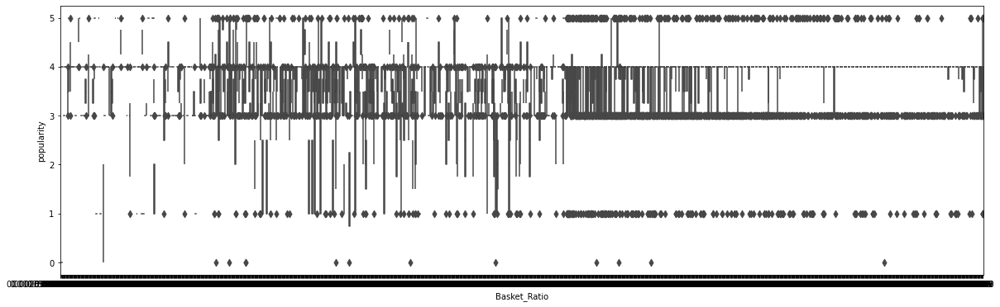

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Basket_Ratio',y="popularity",data= train_df, palette='rainbow')

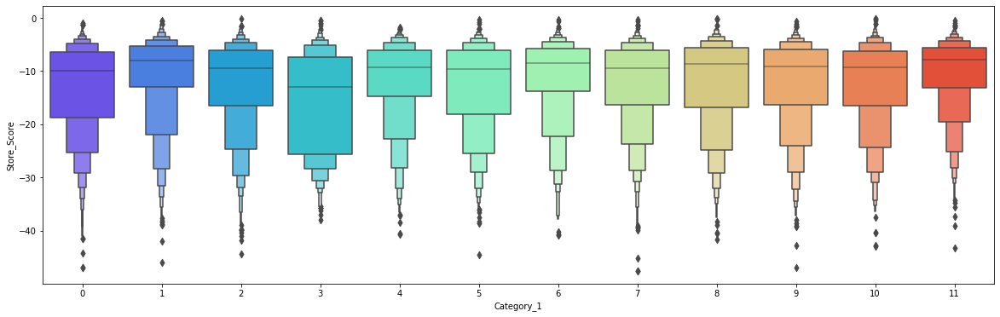

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Category_1',y="Store_Score",data= train_df, palette='rainbow')

there is no relation between between store score and category1

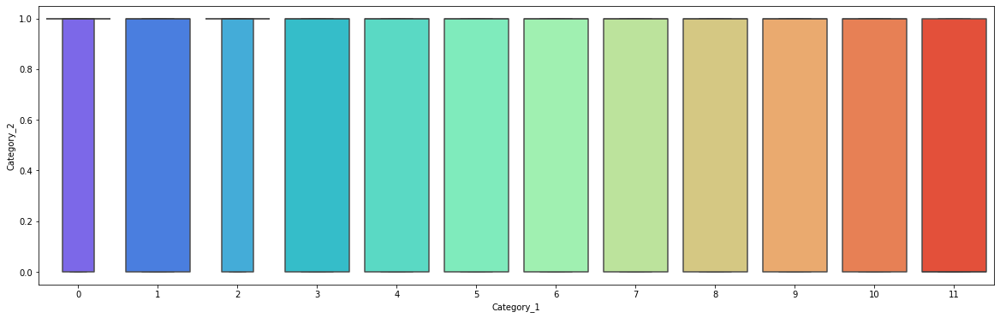

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Category_1',y="Category_2",data= train_df, palette='rainbow')

there is weak relation between category1 and category2

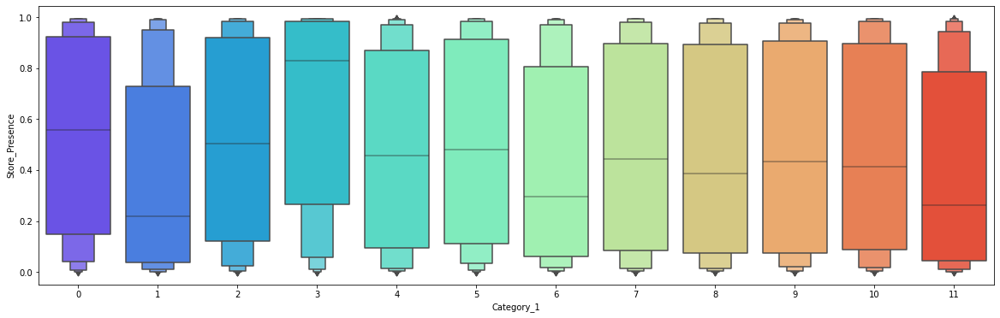

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Category_1',y="Store_Presence",data= train_df, palette='rainbow')

there is weak relation between category1 and store presence

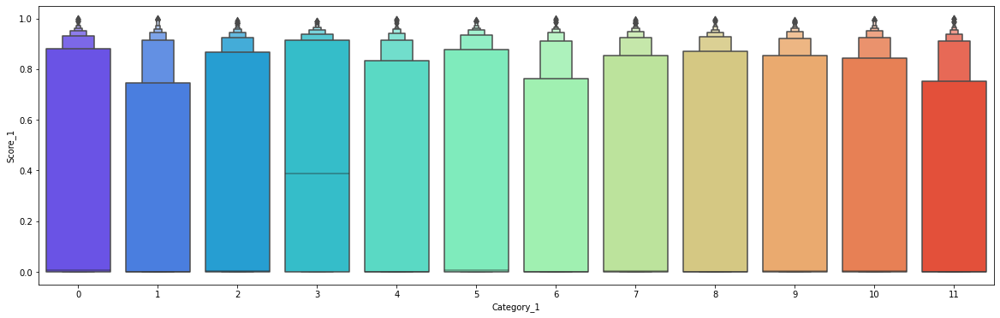

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Category_1',y="Score_1",data= train_df, palette='rainbow')

there is weak relation between category1 and score1

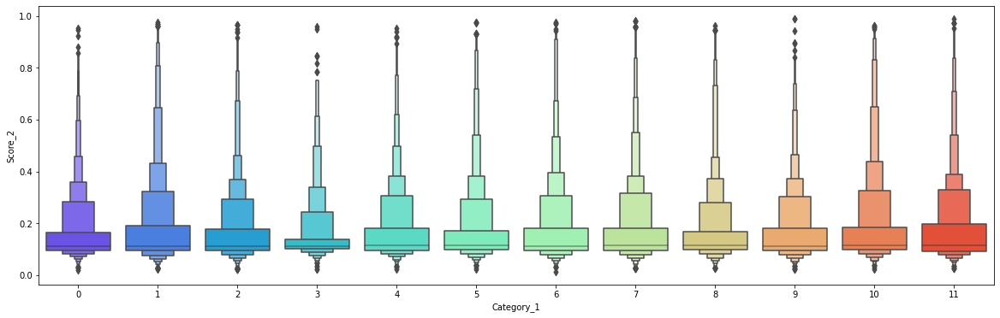

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Category_1',y="Score_2",data= train_df, palette='rainbow')

there is no relation between category1 and score2

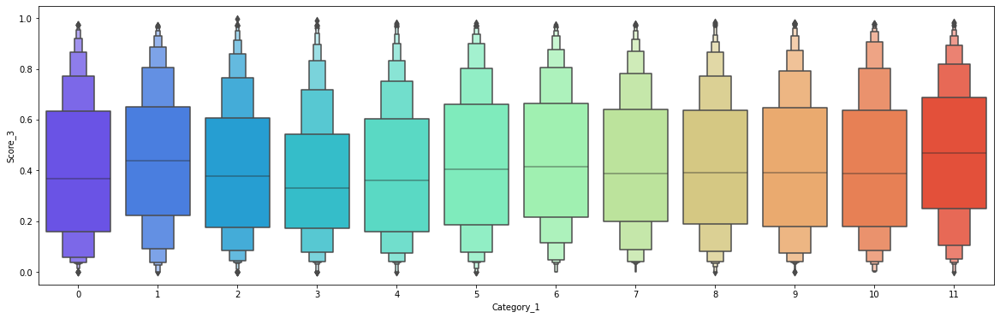

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Category_1',y="Score_3",data= train_df, palette='rainbow')

from above boxen plot:

The distribution between lower adjacent value and upper adjacent value is symmetrical.

there is no relation between category1 and score3

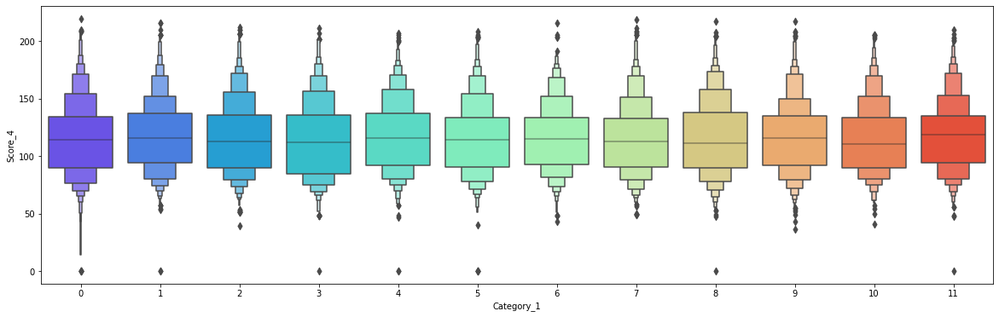

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Category_1',y="Score_4",data= train_df, palette='rainbow')

from above boxen plot:

The distribution between lower adjacent value and upper adjacent value is symmetrical.

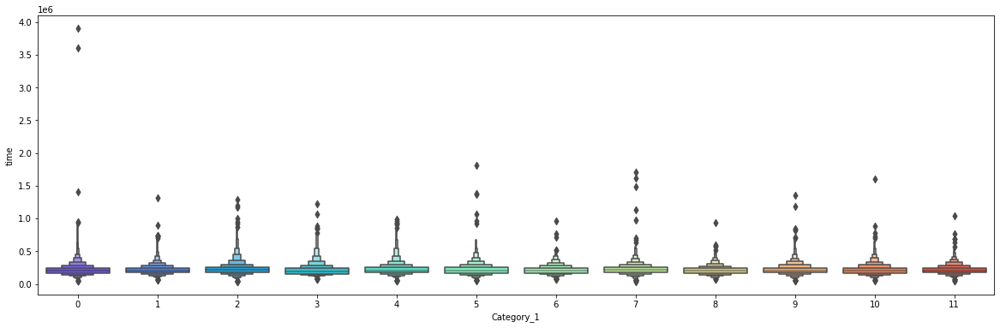

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Category_1',y="time",data= train_df, palette='rainbow')

from above boxen plot:

There is no relation between time and category1

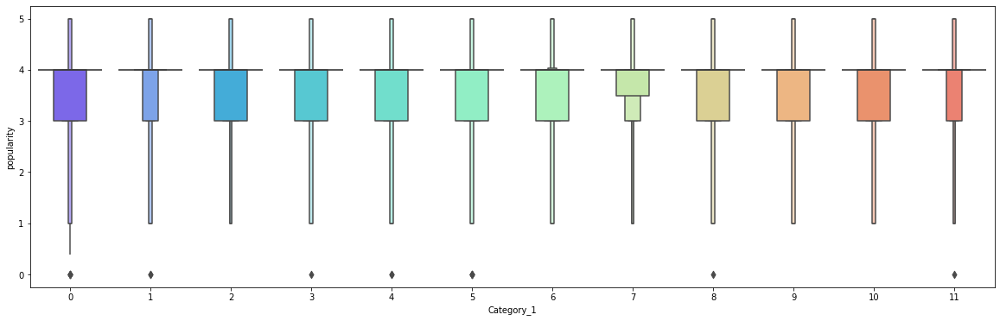

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Category_1',y="popularity",data= train_df, palette='rainbow')

there is no relation between category1 and popularity

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Store_Score',y="Store_Presence",data= train_df, palette='rainbow')

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Store_Score',y="Score_1",data= train_df, palette='rainbow')

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Store_Score',y="Score_2",data= train_df, palette='rainbow')

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Store_Score',y="Score_3",data= train_df, palette='rainbow')

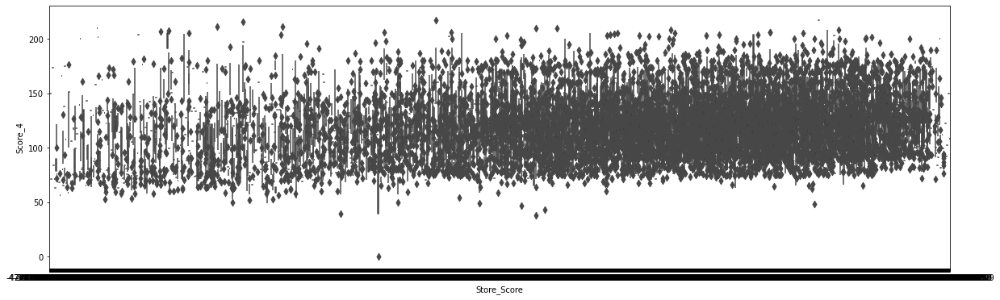

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Store_Score',y="Score_4",data= train_df, palette='rainbow')

there is weak relation between store score and score2

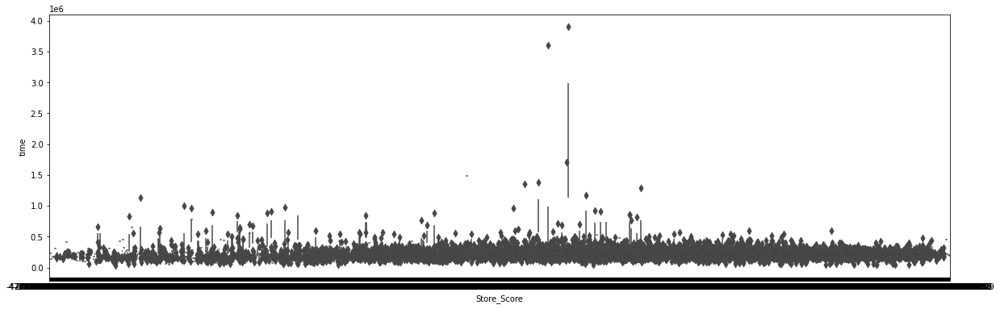

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Store_Score',y="time",data= train_df, palette='rainbow')

there is no relation between time and store score

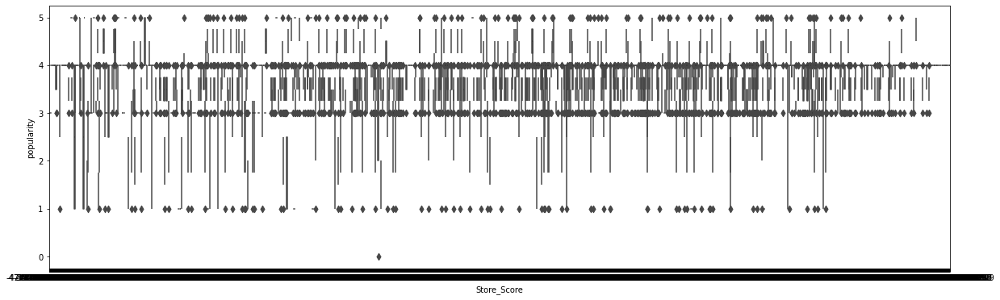

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Store_Score',y="popularity",data= train_df, palette='rainbow')

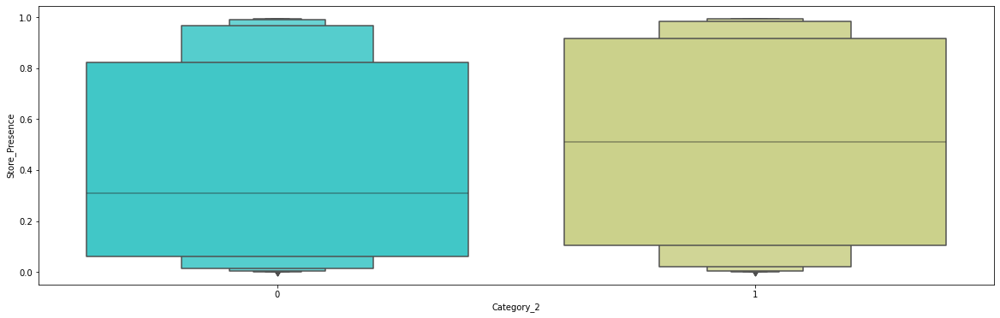

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Category_2',y="Store_Presence",data= train_df, palette='rainbow')

there is no relation between store presence and category2

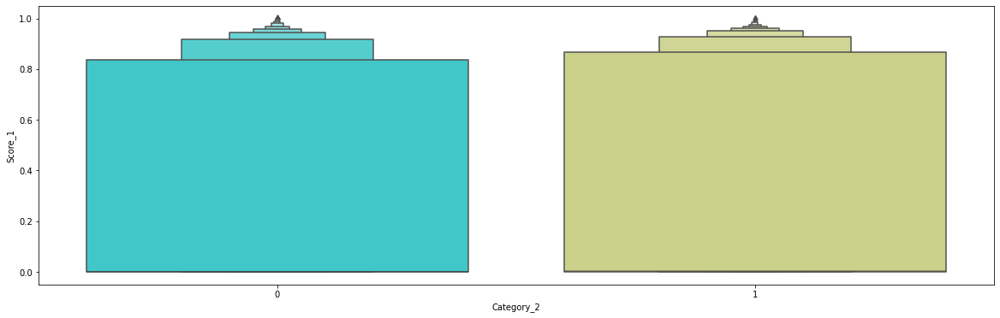

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Category_2',y="Score_1",data= train_df, palette='rainbow')

there is no relation between score1 and category2

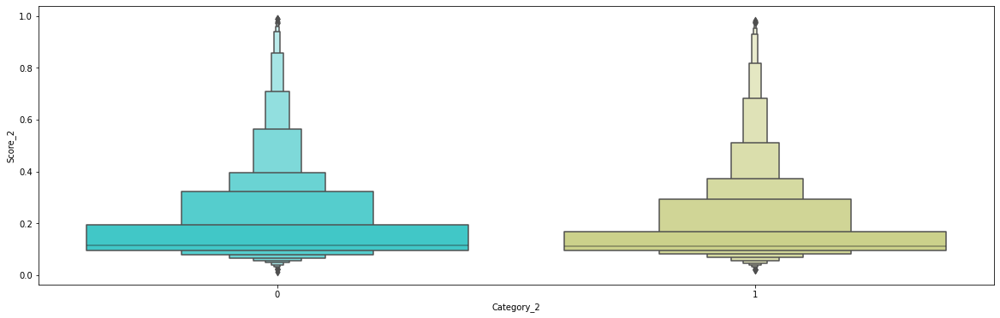

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Category_2',y="Score_2",data= train_df, palette='rainbow')

there is no relation between score2 and category2

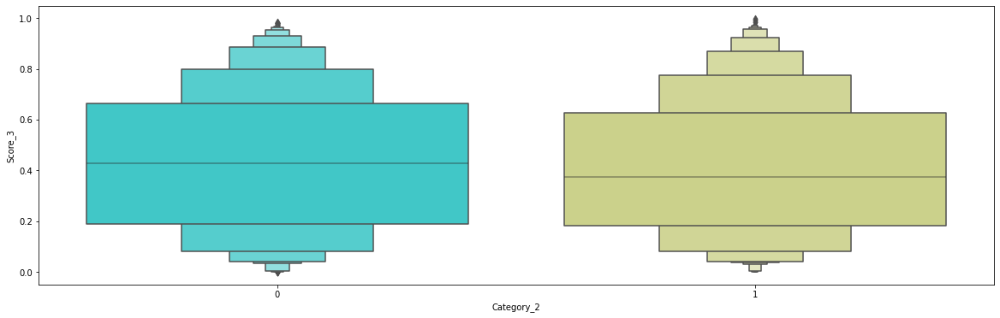

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Category_2',y="Score_3",data= train_df, palette='rainbow')

there is no relation between score3 and category2

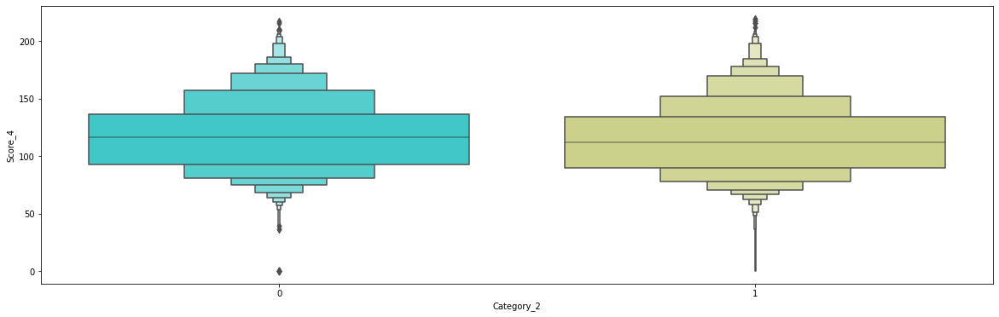

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Category_2',y="Score_4",data= train_df, palette='rainbow')

there is no relation between score4 and category2

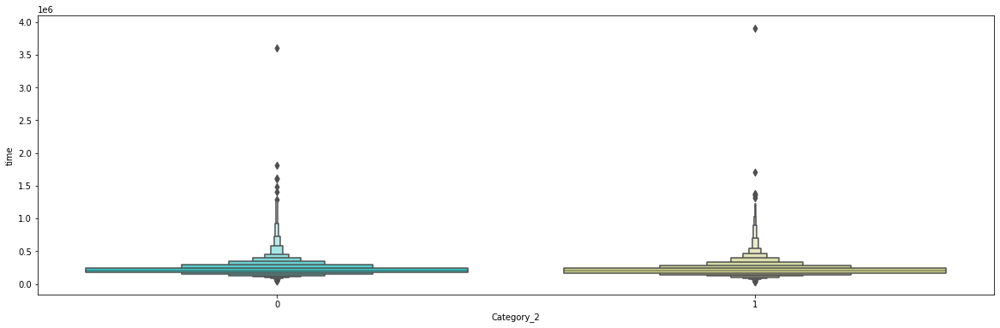

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Category_2',y="time",data= train_df, palette='rainbow')

there is no relation between time and category2

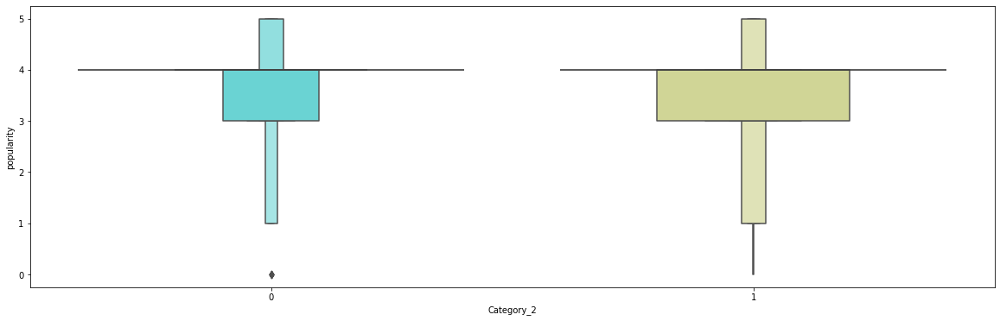

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Category_2',y="popularity",data= train_df, palette='rainbow')

there is no relation between popularity and category2

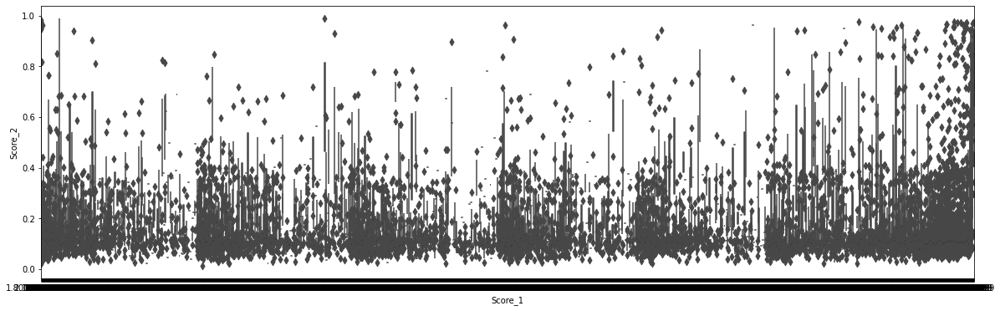

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Score_1',y="Score_2",data= train_df, palette='rainbow')

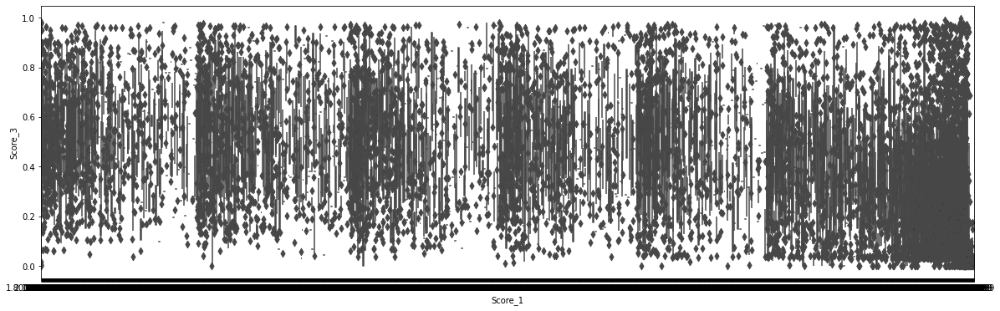

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Score_1',y="Score_3",data= train_df, palette='rainbow')

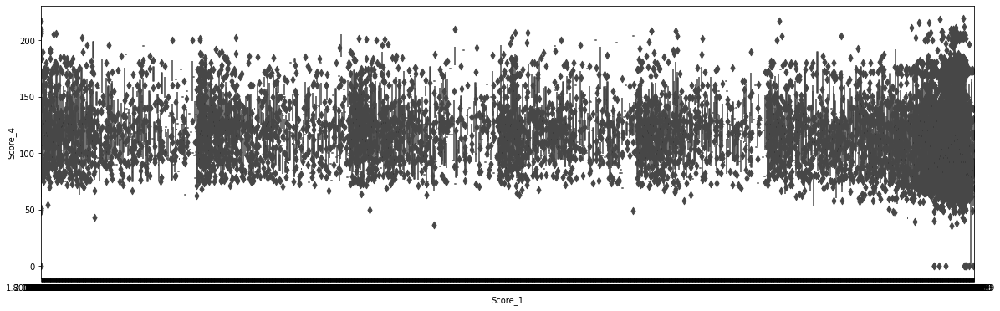

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Score_1',y="Score_4",data= train_df, palette='rainbow')

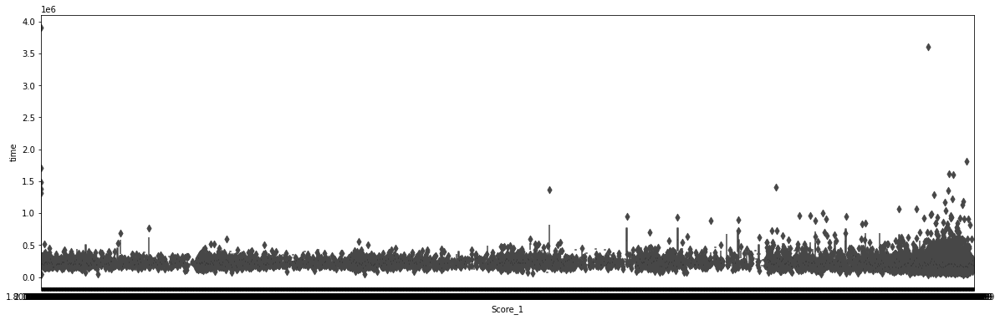

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Score_1',y="time",data= train_df, palette='rainbow')

there is no relation between score1 and time

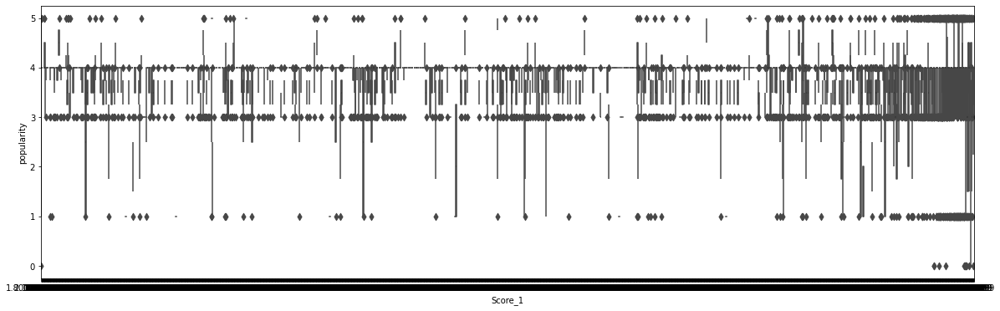

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Score_1',y="popularity",data= train_df, palette='rainbow')

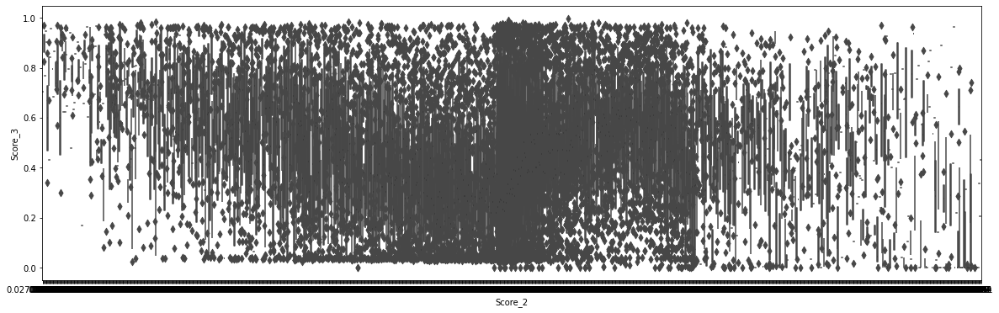

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Score_2',y="Score_3",data= train_df, palette='rainbow')

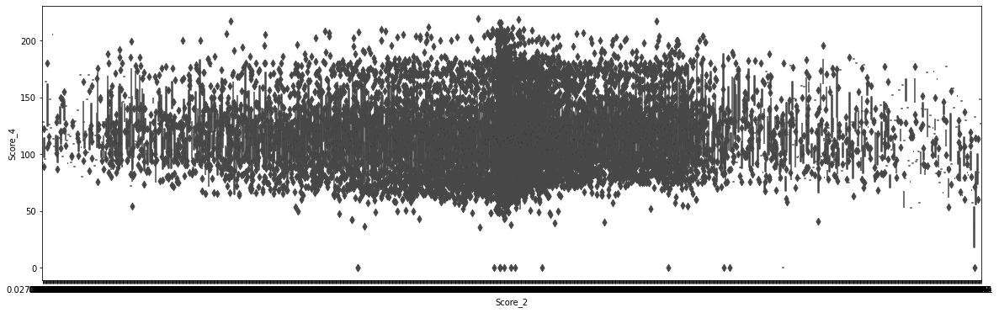

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Score_2',y="Score_4",data= train_df, palette='rainbow')

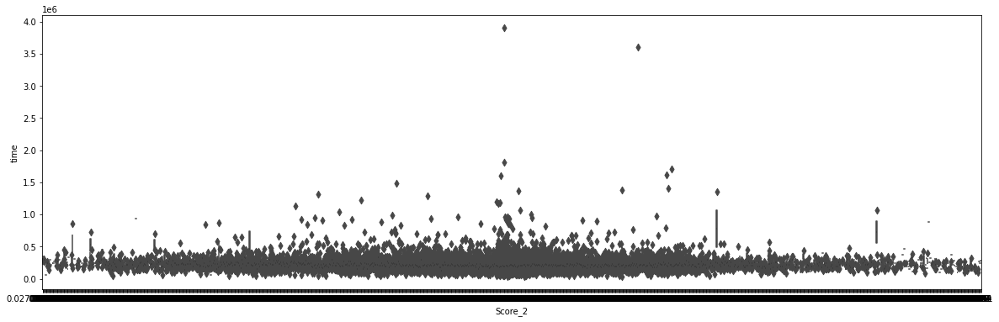

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Score_2',y="time",data= train_df, palette='rainbow')

there is no relation between score2 and time

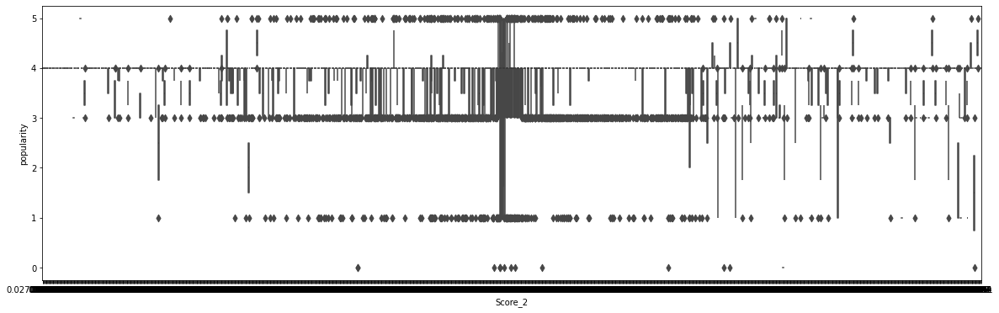

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Score_2',y="popularity",data= train_df, palette='rainbow')

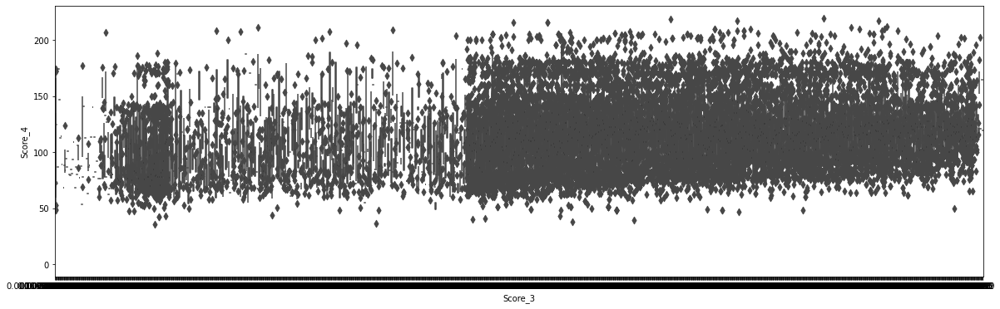

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Score_3',y="Score_4",data= train_df, palette='rainbow')

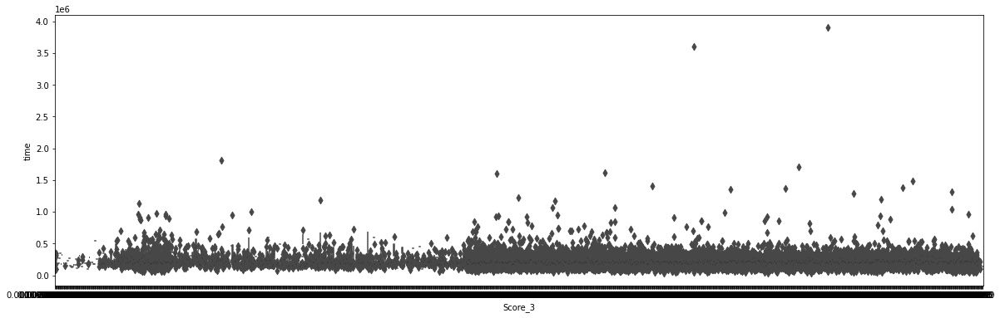

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Score_3',y="time",data= train_df, palette='rainbow')

there is no relation between score3 and time

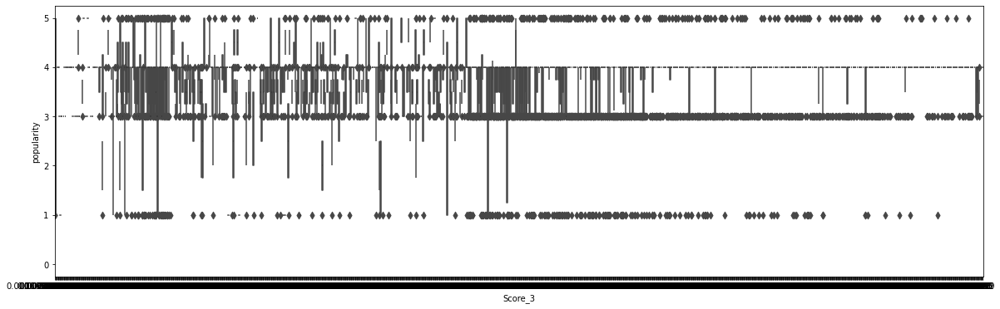

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Score_3',y="popularity",data= train_df, palette='rainbow')

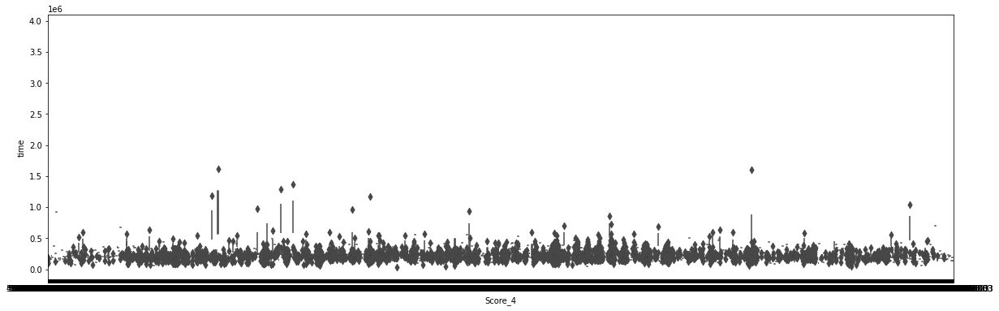

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Score_4',y="time",data= train_df, palette='rainbow')

there is no relation between score4 and time

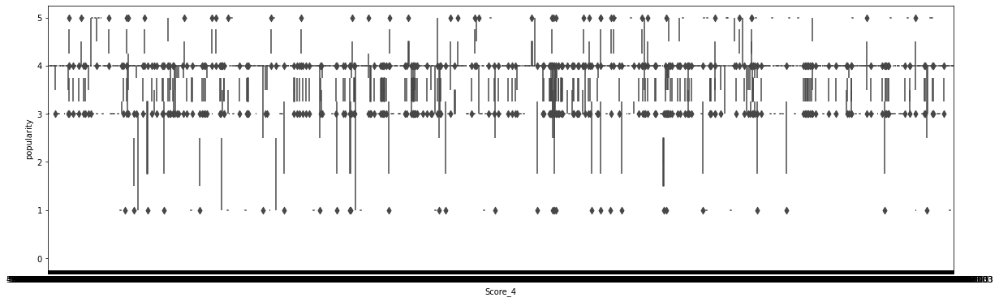

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Score_4',y="popularity",data= train_df, palette='rainbow')

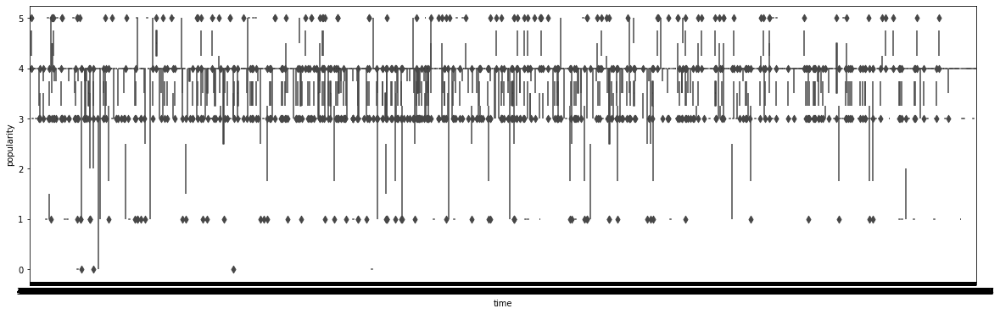

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='time',y="popularity",data= train_df, palette='rainbow')

# Voilin Plot

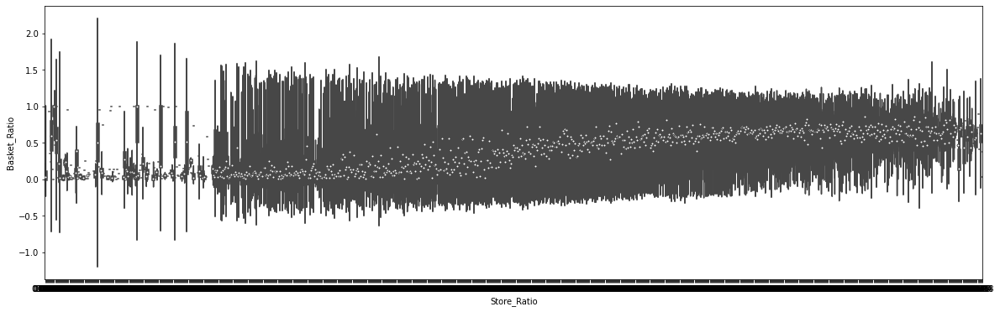

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Store_Ratio',y="Basket_Ratio",data= train_df, palette='rainbow')

there is a positive correlation between basket ratio and store ratio

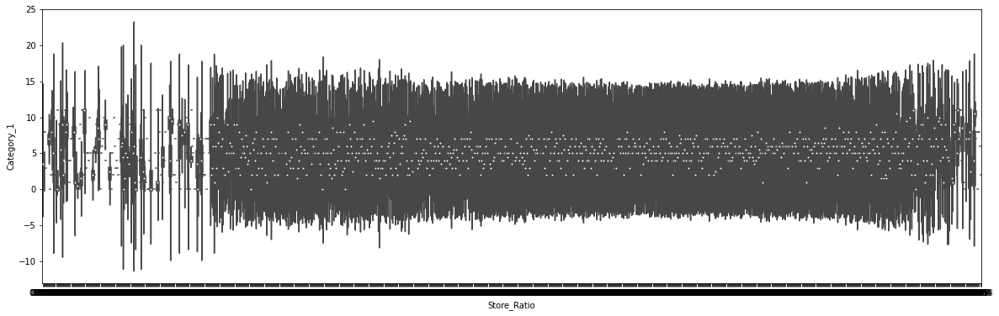

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Store_Ratio',y="Category_1",data= train_df, palette='rainbow')

there is a weak relation between store ratio and category1

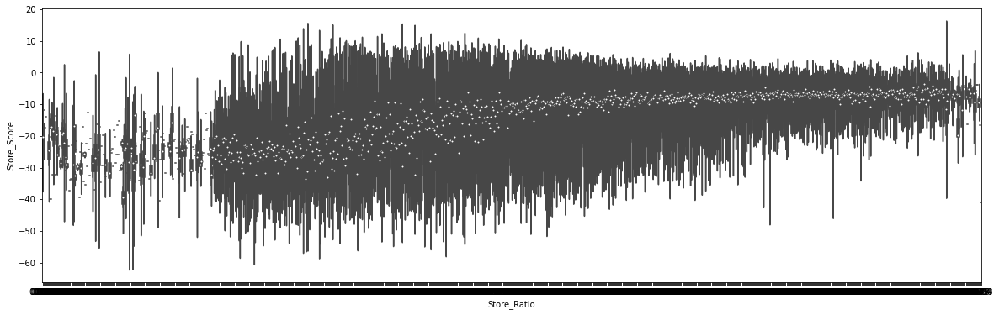

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Store_Ratio',y="Store_Score",data= train_df, palette='rainbow')

store score and store ratio are correlated to each other

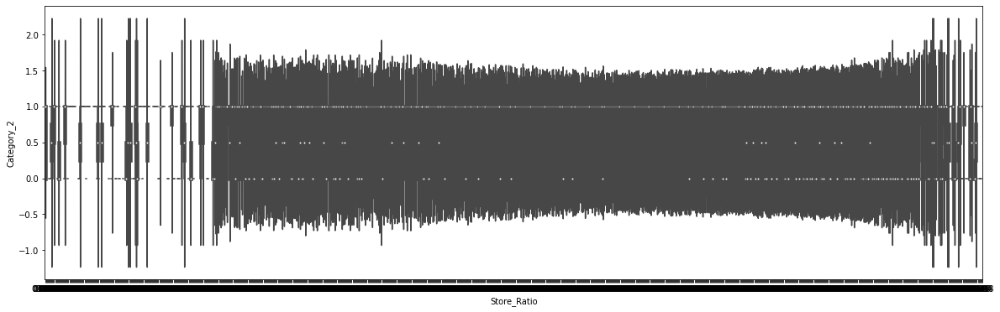

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Store_Ratio',y="Category_2",data= train_df, palette='rainbow')

there is a week correlation between store ratio and category2

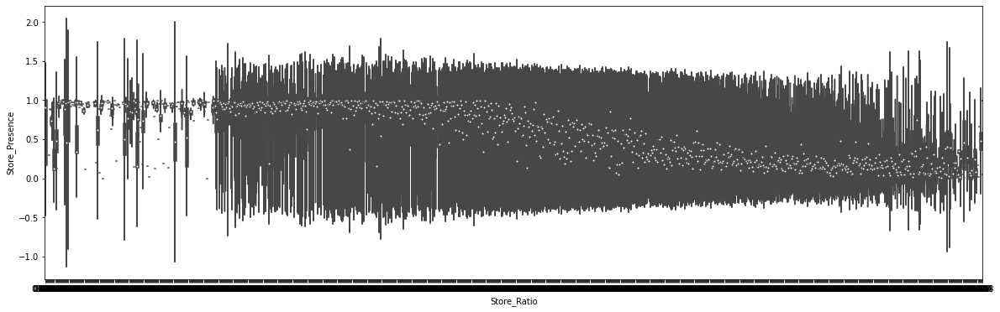

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Store_Ratio',y="Store_Presence",data= train_df, palette='rainbow')

there is strong negative correlation between store ratio and store presence

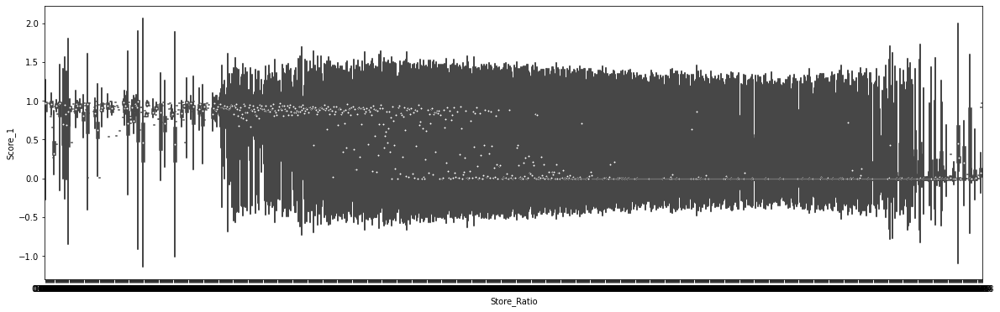

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Store_Ratio',y="Score_1",data= train_df, palette='rainbow')

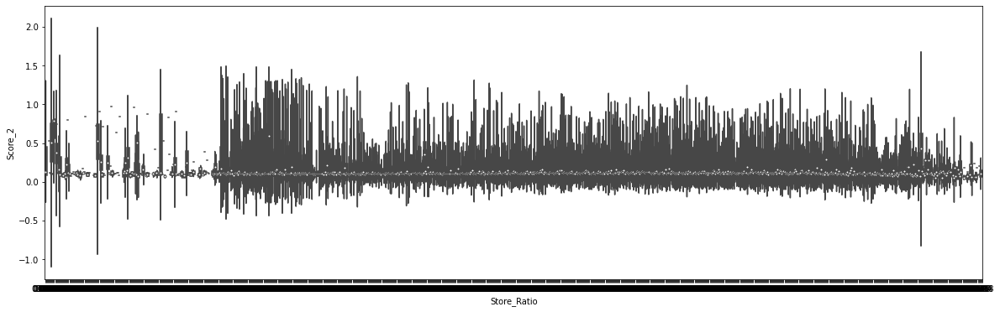

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Store_Ratio',y="Score_2",data= train_df, palette='rainbow')

there is no relation between score2 and store ratio

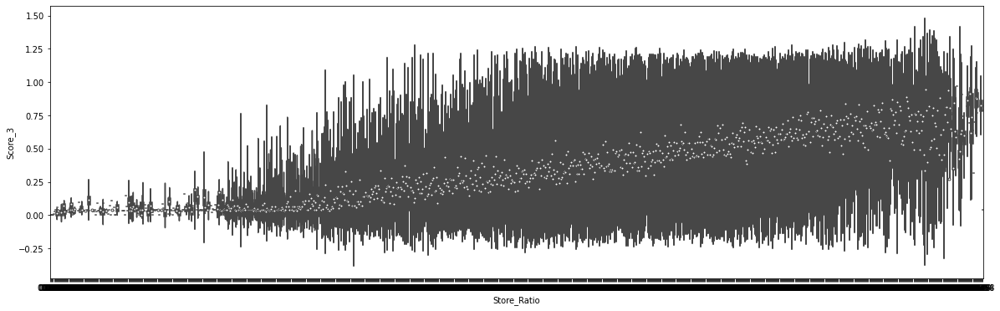

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Store_Ratio',y="Score_3",data= train_df, palette='rainbow')

there is positive correlation between store ratio and score3

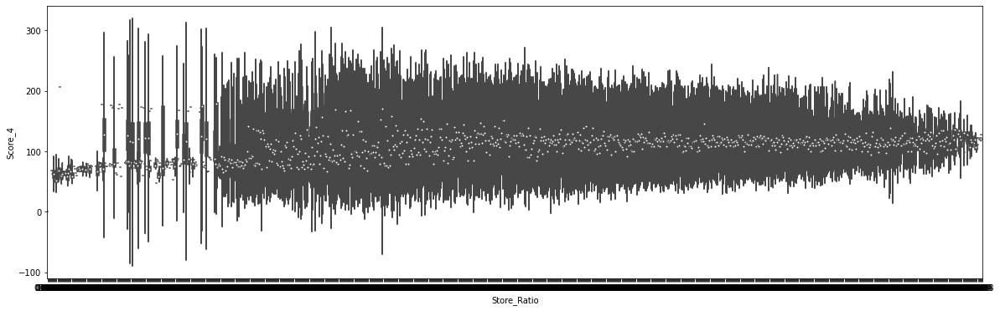

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Store_Ratio',y="Score_4",data= train_df, palette='rainbow')

there is no relation between score4 and store ratio

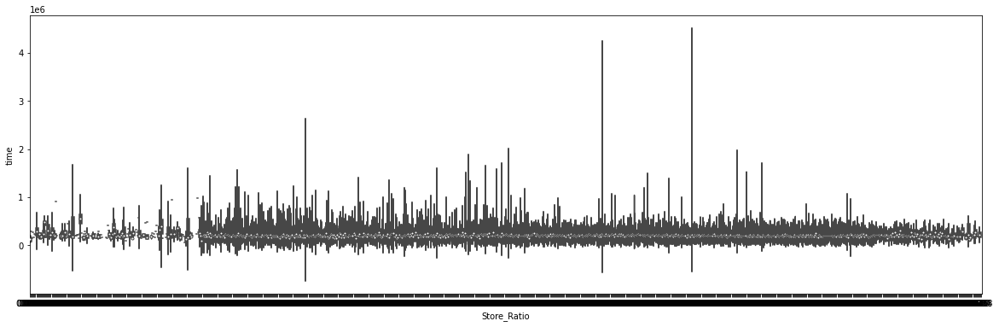

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Store_Ratio',y="time",data= train_df, palette='rainbow')

there is no relation between time and store ratio

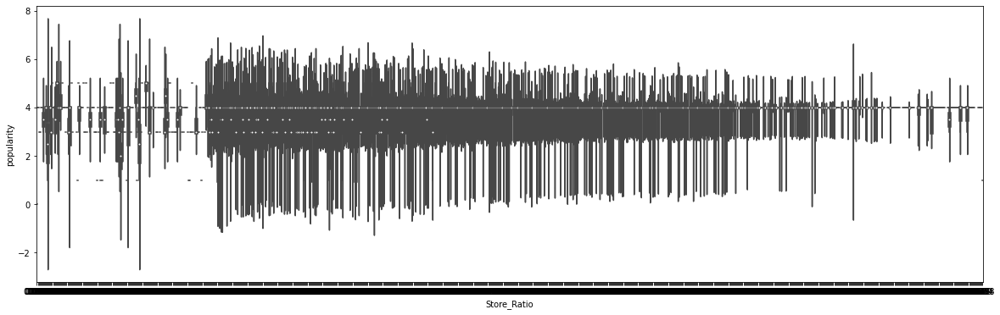

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Store_Ratio',y="popularity",data= train_df, palette='rainbow')

there is weak relation between popularity and store ratio

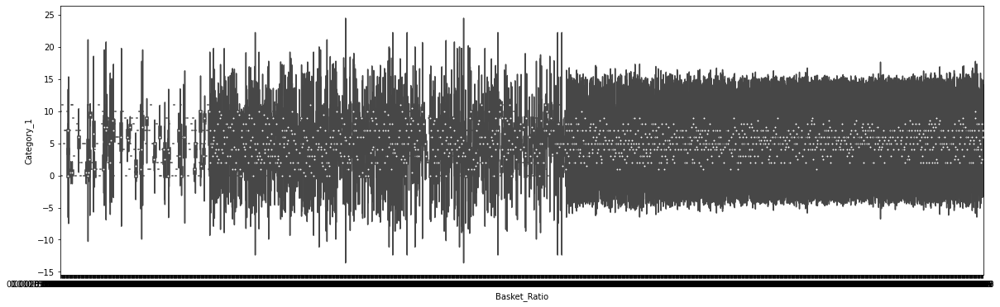

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Basket_Ratio',y="Category_1",data= train_df, palette='rainbow')

there is no relation between category1 and basket ratio

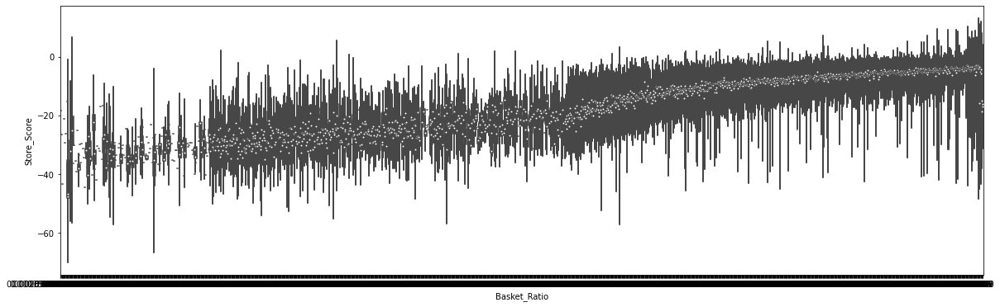

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Basket_Ratio',y="Store_Score",data= train_df, palette='rainbow')

there is positive correlation between basket ratio and store score

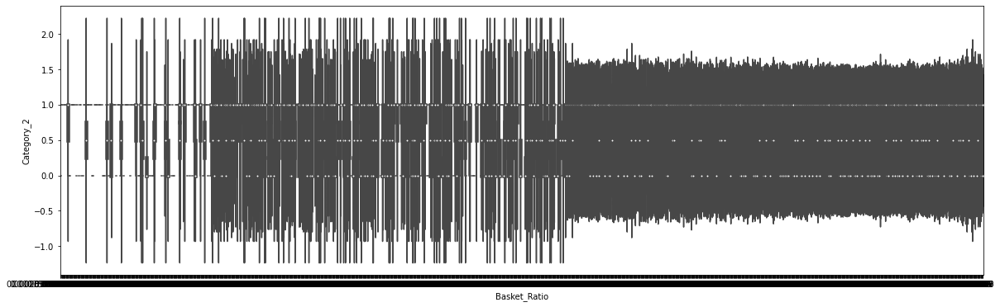

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Basket_Ratio',y="Category_2",data= train_df, palette='rainbow')

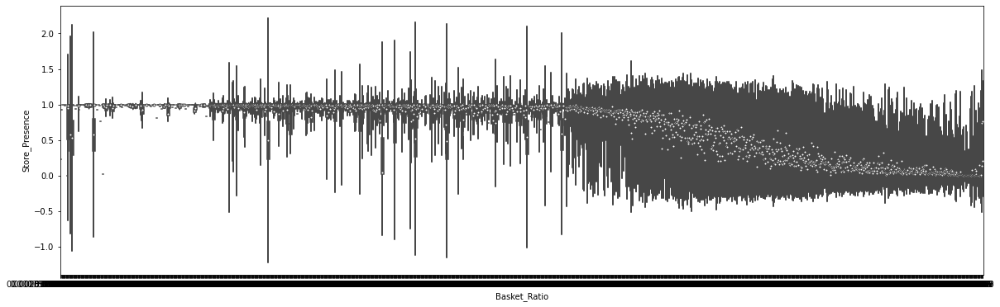

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Basket_Ratio',y="Store_Presence",data= train_df, palette='rainbow')

there is no relation between basket ratio and store presence

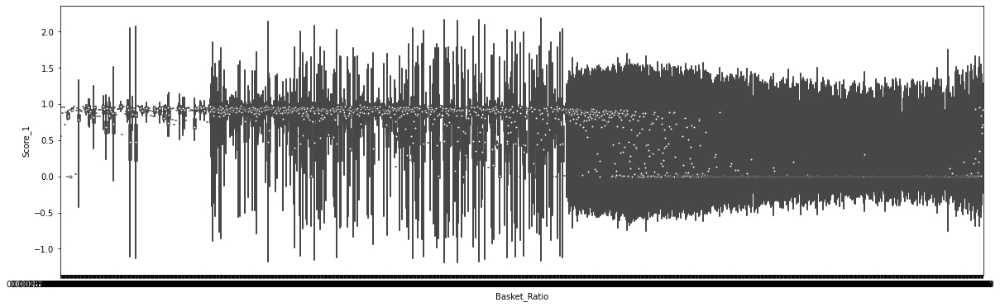

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Basket_Ratio',y="Score_1",data= train_df, palette='rainbow')

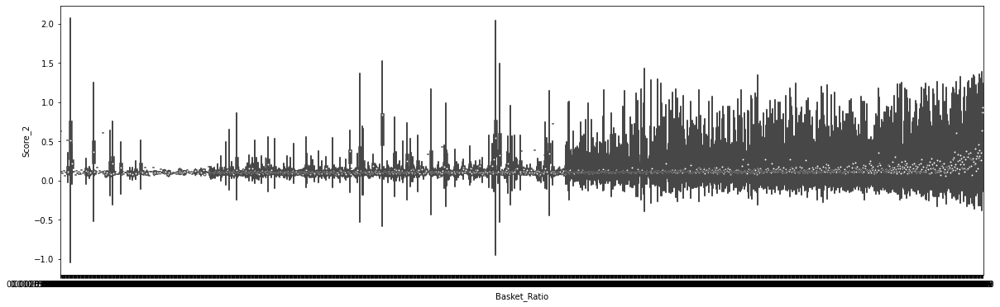

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Basket_Ratio',y="Score_2",data= train_df, palette='rainbow')

there is very weak relation between score2 and basket ratio

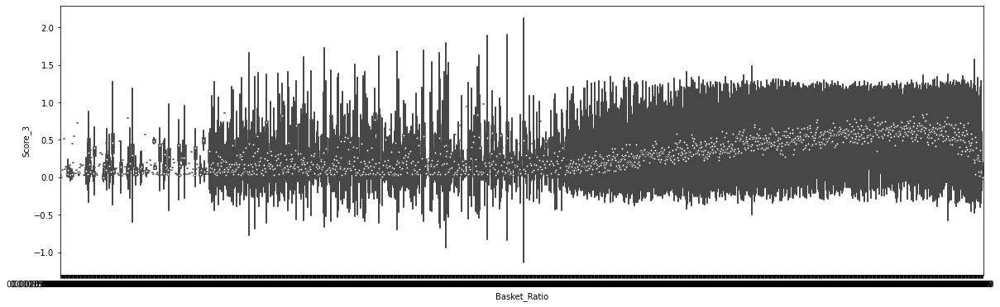

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Basket_Ratio',y="Score_3",data= train_df, palette='rainbow')

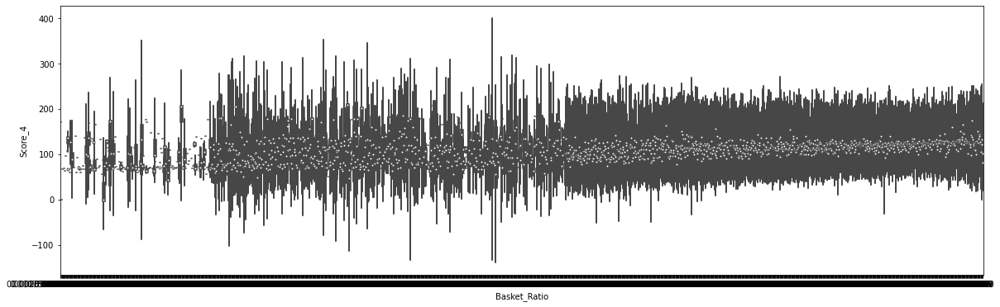

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Basket_Ratio',y="Score_4",data= train_df, palette='rainbow')

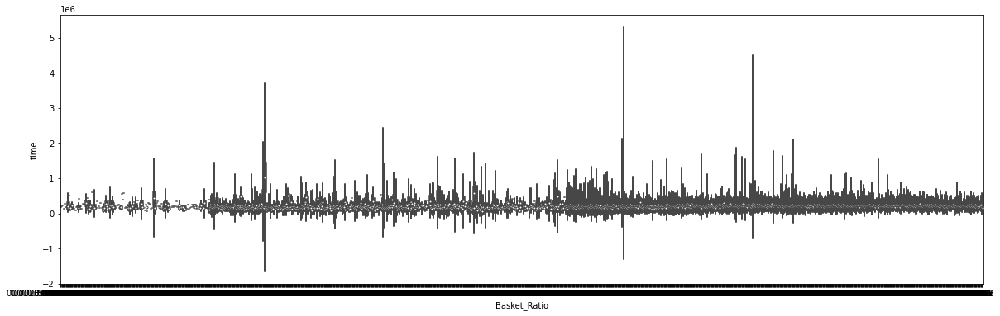

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Basket_Ratio',y="time",data= train_df, palette='rainbow')

there is no relation between time and basket ratio

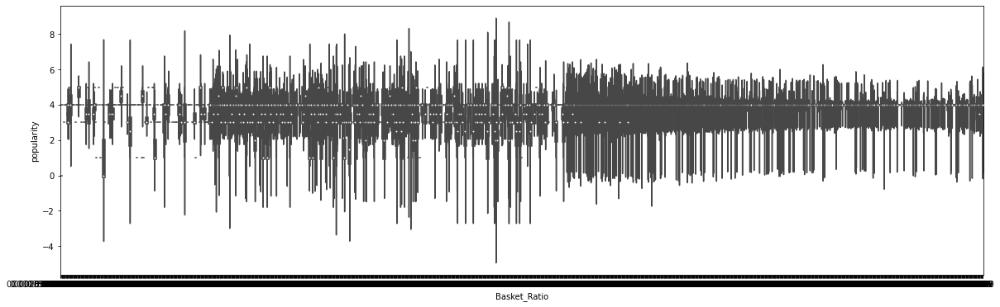

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Basket_Ratio',y="popularity",data= train_df, palette='rainbow')

there is weak relation between basket ratio and popularity

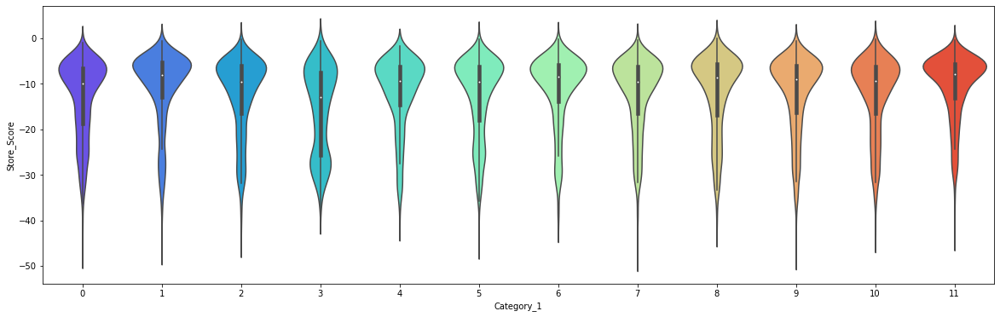

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Category_1',y="Store_Score",data= train_df, palette='rainbow')

there is no relation between store score and category1

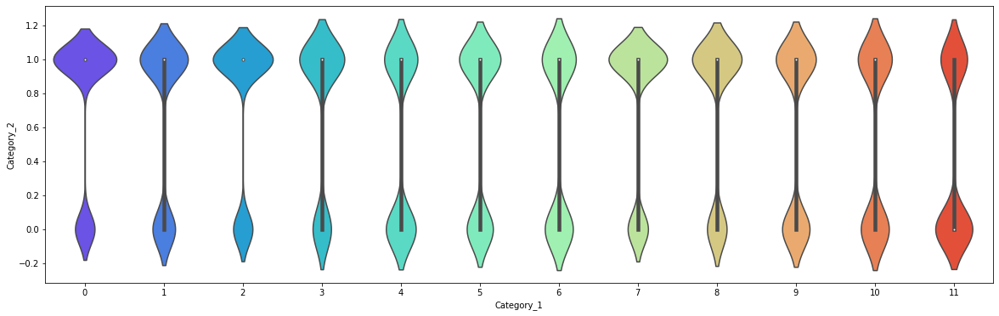

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Category_1',y="Category_2",data= train_df, palette='rainbow')

there is no relation between  category2 and category1

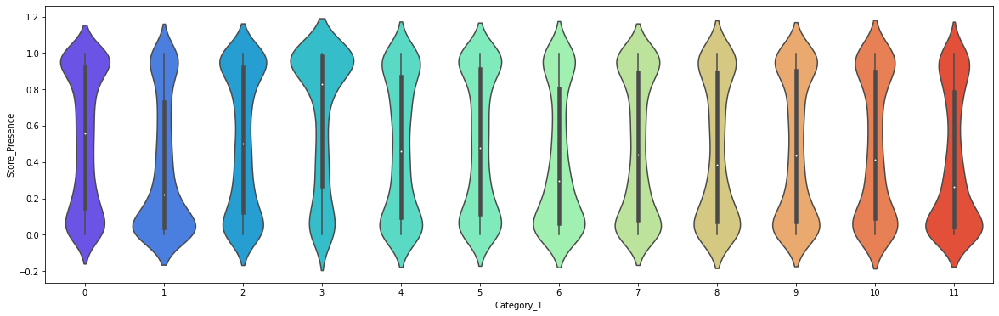

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Category_1',y="Store_Presence",data= train_df, palette='rainbow')

there is no relation between  store presence and category1

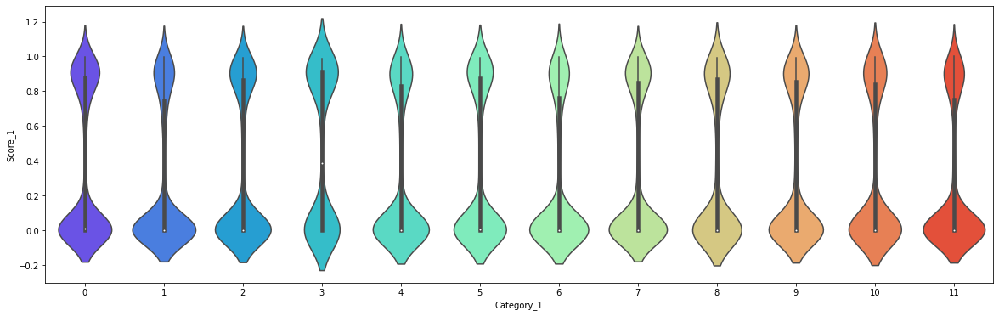

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Category_1',y="Score_1",data= train_df, palette='rainbow')

there is no relation between  score1 and category1

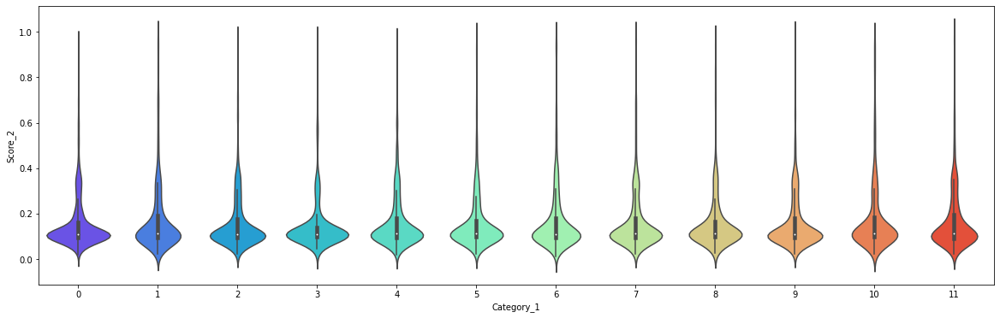

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Category_1',y="Score_2",data= train_df, palette='rainbow')

there is no relation between  score2 and category1

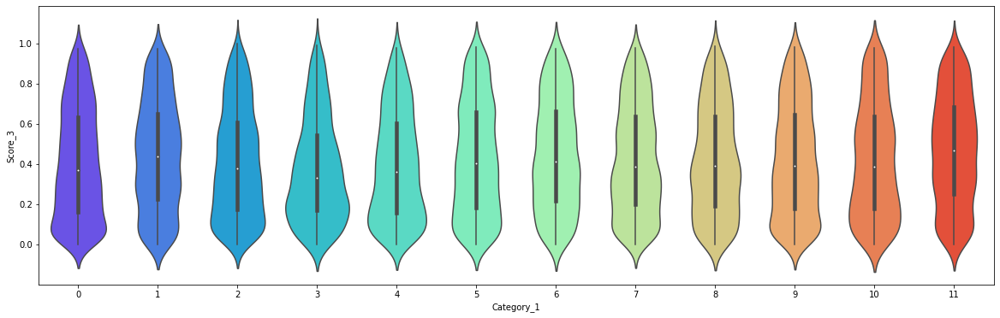

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Category_1',y="Score_3",data= train_df, palette='rainbow')

there is no relation between  score3 and category1

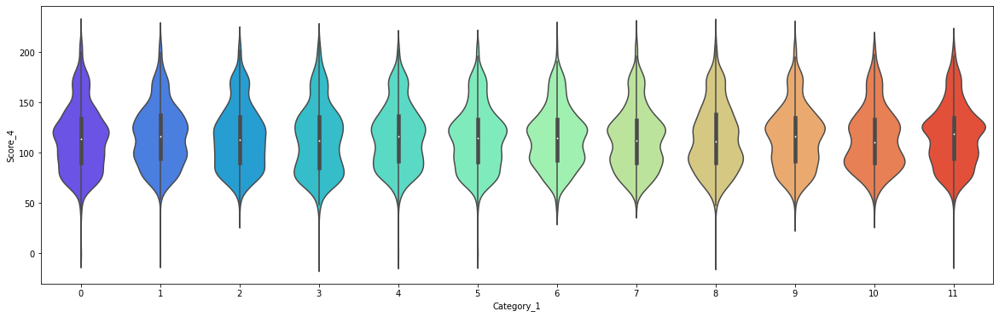

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Category_1',y="Score_4",data= train_df, palette='rainbow')

there is no relation between  score4 and category1

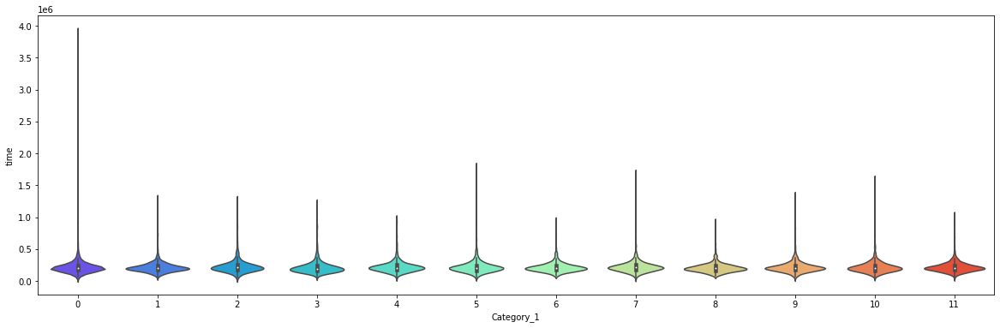

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Category_1',y="time",data= train_df, palette='rainbow')

there is no relation between  time and category1

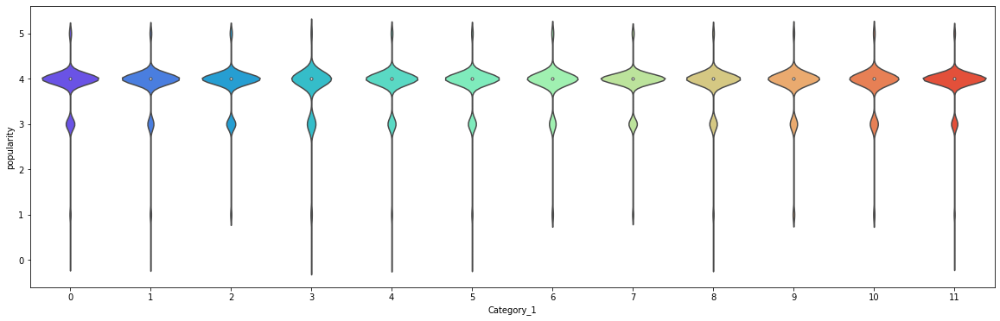

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Category_1',y="popularity",data= train_df, palette='rainbow')

there is no relation between  popularity and category1

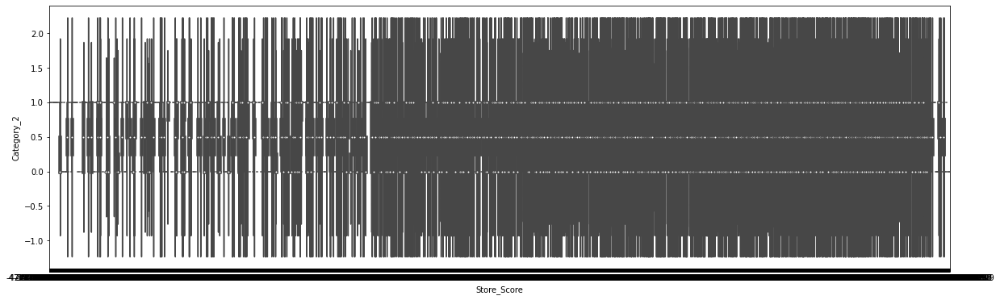

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Store_Score',y="Category_2",data= train_df, palette='rainbow')

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Store_Score',y="Store_Presence",data= train_df, palette='rainbow')

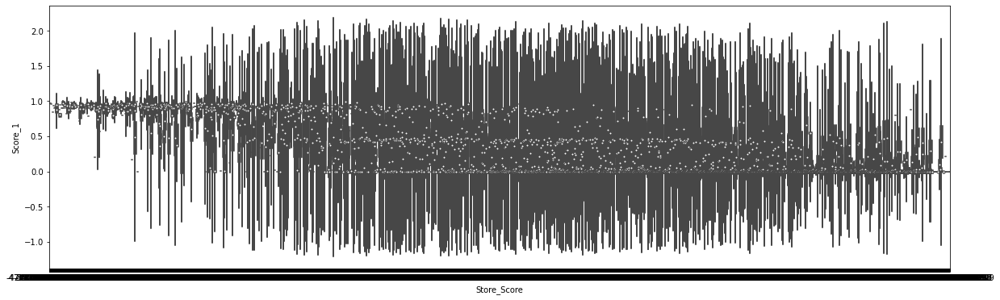

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Store_Score',y="Score_1",data= train_df, palette='rainbow')

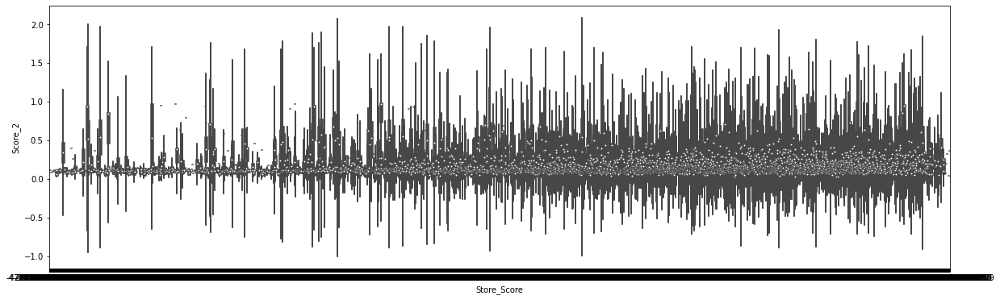

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Store_Score',y="Score_2",data= train_df, palette='rainbow')

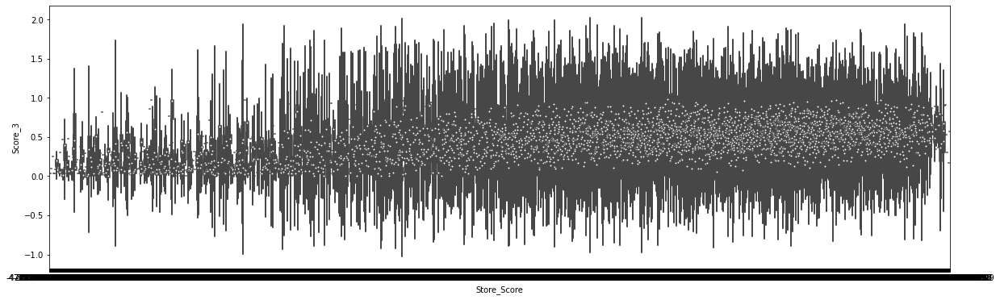

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Store_Score',y="Score_3",data= train_df, palette='rainbow')

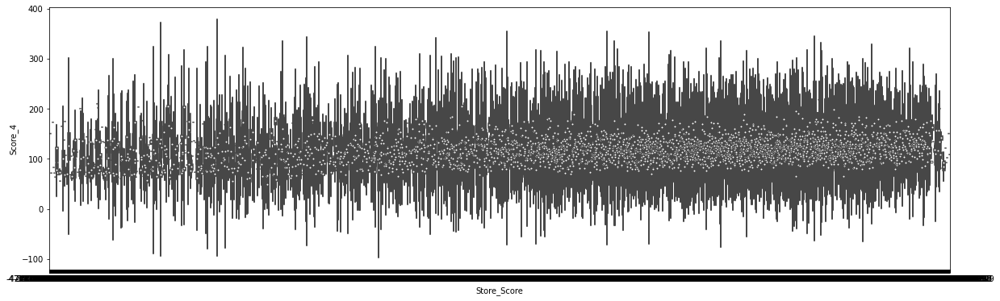

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Store_Score',y="Score_4",data= train_df, palette='rainbow')

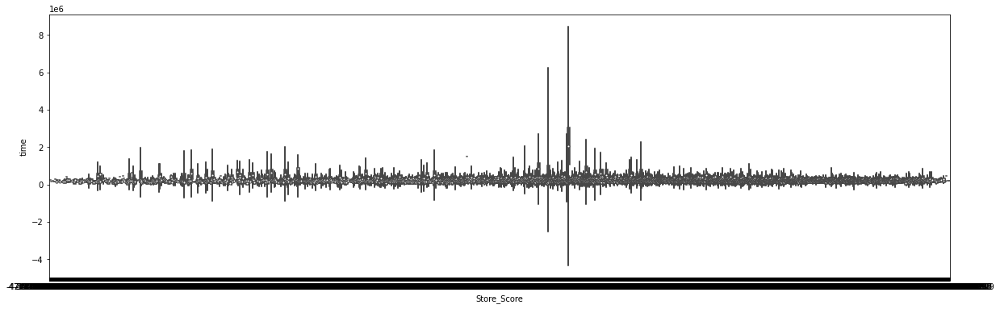

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Store_Score',y="time",data= train_df, palette='rainbow')

there is no relation between time and store score

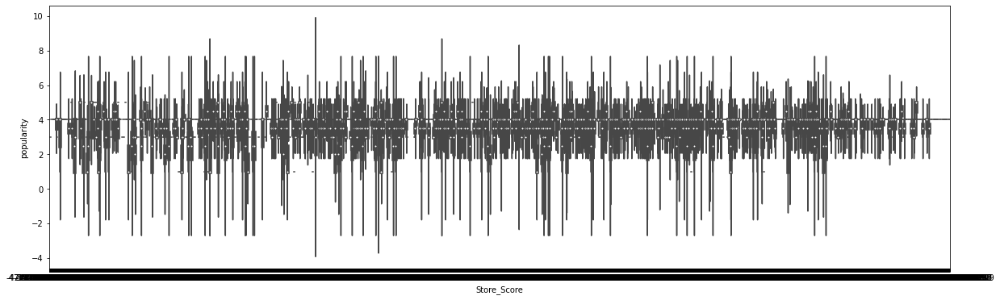

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Store_Score',y="popularity",data= train_df, palette='rainbow')

there is weak relation between  store score and popularity

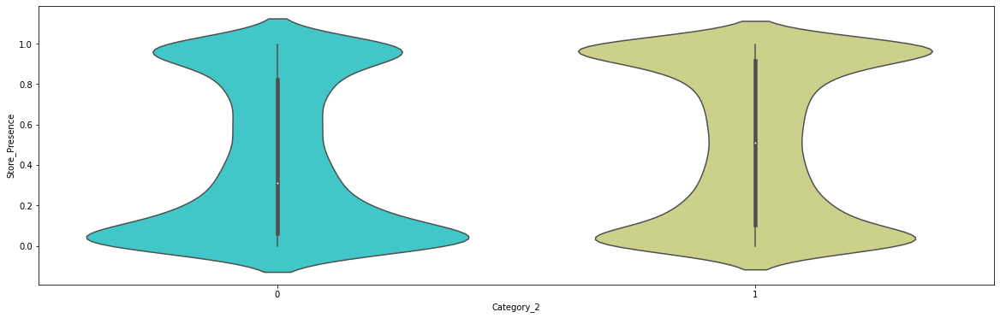

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Category_2',y="Store_Presence",data= train_df, palette='rainbow')

there is no relation between  category2 and store presence

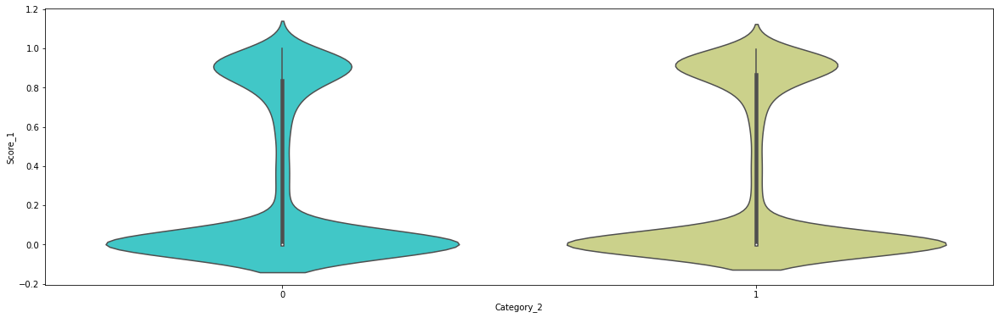

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Category_2',y="Score_1",data= train_df, palette='rainbow')

there is no relation between  category2 and score1

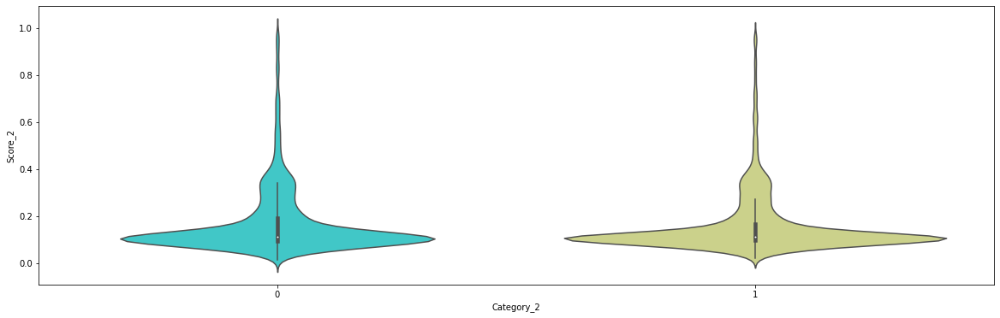

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Category_2',y="Score_2",data= train_df, palette='rainbow')

there is no relation between  category2 and score2

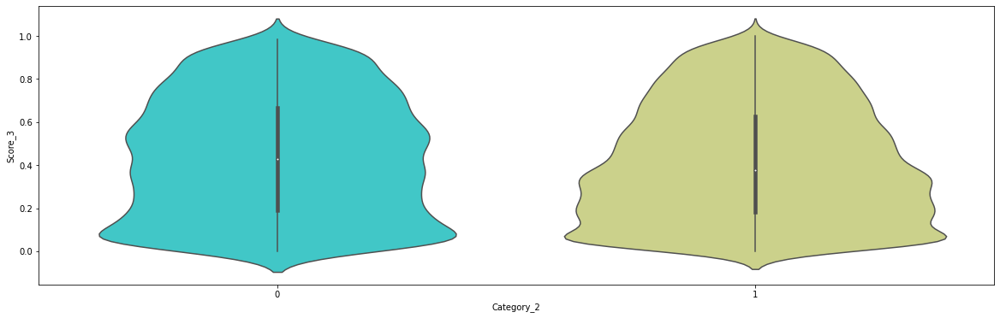

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Category_2',y="Score_3",data= train_df, palette='rainbow')

there is no relation between  category2 and score3

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Category_2',y="Score_4",data= train_df, palette='rainbow')

there is no relation between  category2 and score4

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Category_2',y="time",data= train_df, palette='rainbow')

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Category_2',y="popularity",data= train_df, palette='rainbow')

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Store_Presence',y="Score_1",data= train_df, palette='rainbow')

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Store_Presence',y="Score_2",data= train_df, palette='rainbow')

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Store_Presence',y="Score_3",data= train_df, palette='rainbow')

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Store_Presence',y="Score_4",data= train_df, palette='rainbow')

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Store_Presence',y="time",data= train_df, palette='rainbow')

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Store_Presence',y="popularity",data= train_df, palette='rainbow')

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Score_1',y="Score_2",data= train_df, palette='rainbow')

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Score_1',y="Score_3",data= train_df, palette='rainbow')

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Score_1',y="Score_4",data= train_df, palette='rainbow')

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Score_1',y="time",data= train_df, palette='rainbow')

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Score_1',y="popularity",data= train_df, palette='rainbow')

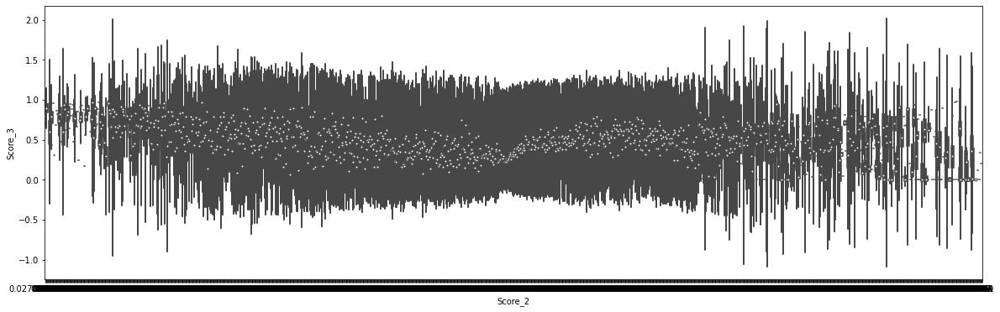

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Score_2',y="Score_3",data= train_df, palette='rainbow')

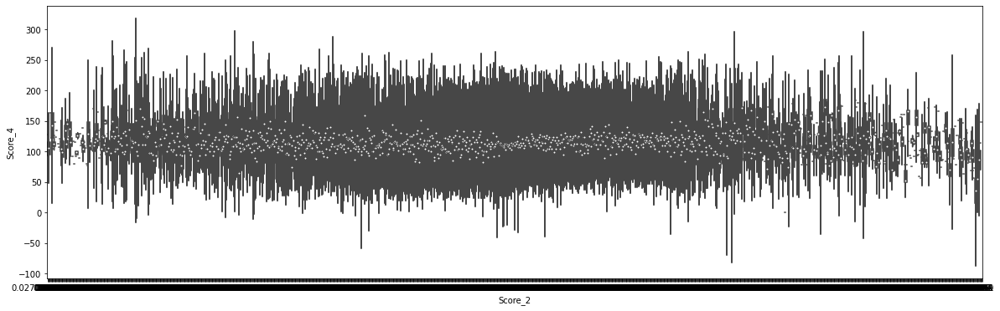

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Score_2',y="Score_4",data= train_df, palette='rainbow')

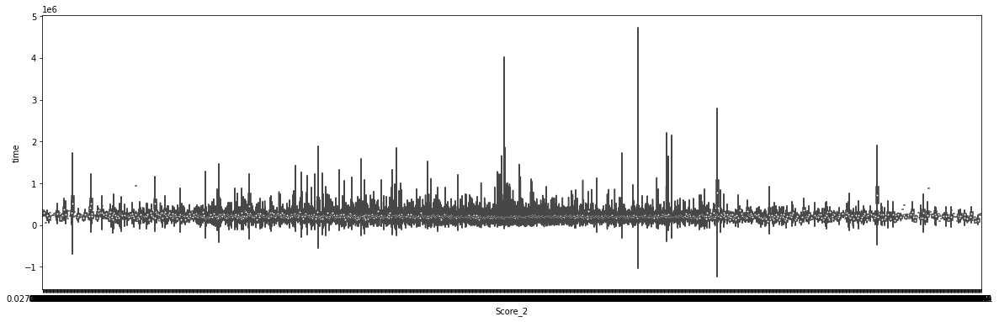

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Score_2',y="time",data= train_df, palette='rainbow')

there is no relation between time and score

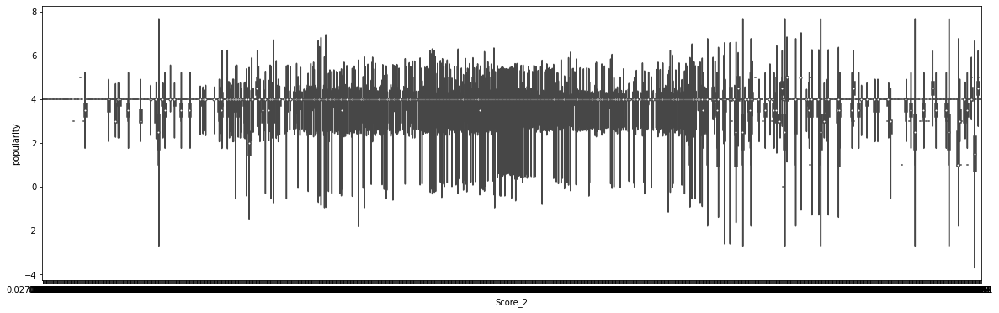

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Score_2',y="popularity",data= train_df, palette='rainbow')

there is no relation between score and popularity

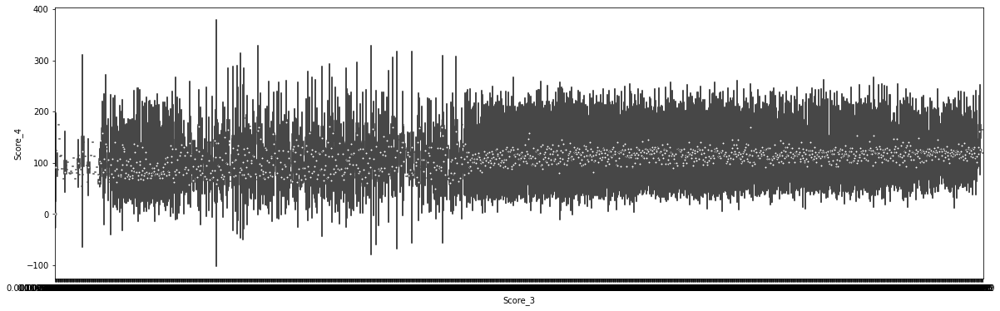

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Score_3',y="Score_4",data= train_df, palette='rainbow')

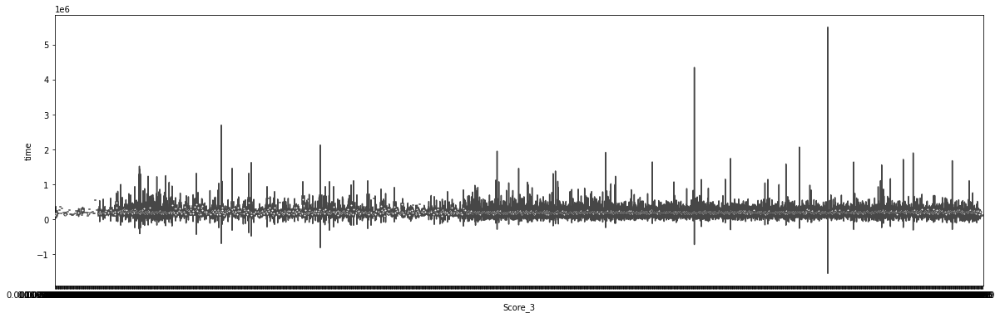

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Score_3',y="time",data= train_df, palette='rainbow')

there is no relation between time and score 3

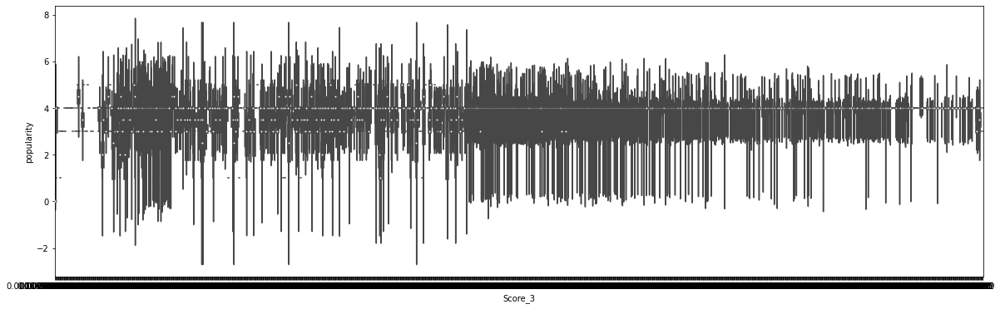

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Score_3',y="popularity",data= train_df, palette='rainbow')

there is weak relation between popularity and score 3



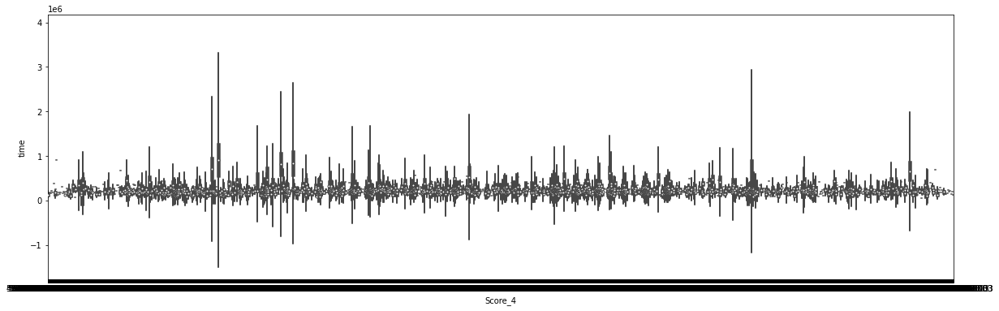

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Score_4',y="time",data= train_df, palette='rainbow')

there is no relation between time and score4

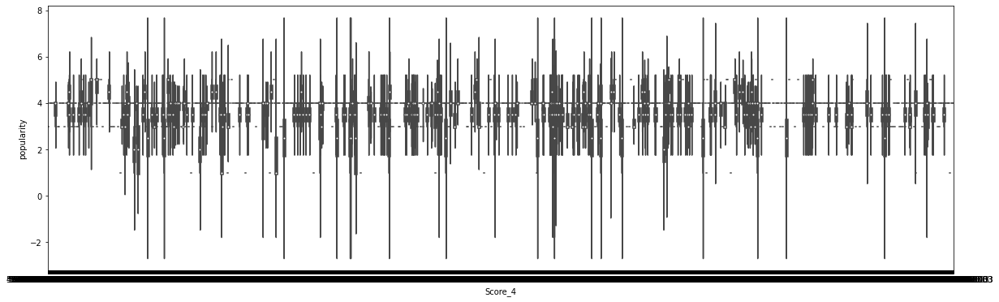

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Score_4',y="popularity",data= train_df, palette='rainbow')

there is no relation between popularity and score 4

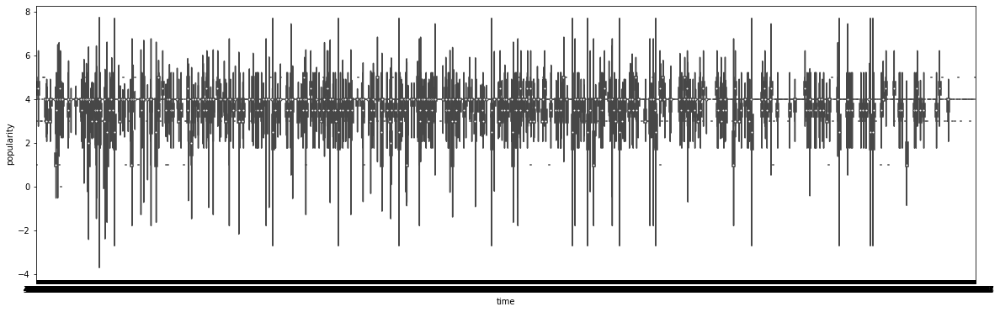

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='time',y="popularity",data= train_df, palette='rainbow')

there is on relation between time and popularity

# preprocessing

In [28]:
train_df['hour'] = pd.to_datetime(df['time'].astype(int), unit='s').dt.hour
train_df['month'] = pd.to_datetime(df['time'].astype(int), unit='s').dt.month
train_df['day'] = pd.to_datetime(df['time'].astype(int), unit='s').dt.day
train_df['year'] = pd.to_datetime(df['time'].astype(int), unit='s').dt.year
train_df['minute'] = pd.to_datetime(df['time'].astype(int), unit='s').dt.minute

In [29]:
y = train_df[['popularity']]
train_df = df.drop(["popularity","time"],1)

In [30]:
X = train_df

In [31]:
X.head()

,Store_Ratio,Basket_Ratio,Category_1,Store_Score,Category_2,Store_Presence,Score_1,Score_2,Score_3,Score_4,hour,month,day,year,minute
0,0.407,0.00380,2,-35.865,1,0.9920,0.944,0.0988,0.1100,113.911,4,1,3,1970,32
1,0.234,0.10500,0,-19.884,1,0.9440,0.900,0.1290,0.0382,76.332,3,1,3,1970,48
2,0.668,0.72600,9,-7.512,1,0.0387,0.000,0.1340,0.4530,124.075,23,1,2,1970,49
3,0.184,0.00561,4,-34.357,1,0.8490,0.931,0.1110,0.0641,79.037,3,1,3,1970,6
4,0.231,0.13100,6,-22.842,1,0.9370,0.000,0.1090,0.0677,109.560,3,1,3,1970,48


In [32]:
def scale_data(df,col):
  from numpy import asarray
  from sklearn.preprocessing import MinMaxScaler
  scaler = MinMaxScaler()

  df[col] = scaler.fit_transform(df[col])
  return df

In [33]:
col_X = ['Store_Ratio', 'Basket_Ratio', 'Category_1', 'Store_Score',
       'Category_2', 'Store_Presence', 'Score_1', 'Score_2', 'Score_3',
       'Score_4']
X = scale_data(X,col_X)

In [34]:
X.head()

,Store_Ratio,Basket_Ratio,Category_1,Store_Score,Category_2,Store_Presence,Score_1,Score_2,Score_3,Score_4,hour,month,day,year,minute
0,0.407816,0.003585,0.181818,0.246563,1.0,0.995984,0.944,0.088755,0.110110,0.518482,4,1,3,1970,32
1,0.234469,0.104807,0.000000,0.583026,1.0,0.947791,0.900,0.119600,0.038238,0.347436,3,1,3,1970,48
2,0.669339,0.725941,0.818182,0.843506,1.0,0.038855,0.000,0.124706,0.453453,0.564745,23,1,2,1970,49
3,0.184369,0.005395,0.363636,0.278312,1.0,0.852410,0.931,0.101215,0.064164,0.359748,3,1,3,1970,6
4,0.231463,0.130812,0.545455,0.520749,1.0,0.940763,0.000,0.099173,0.067768,0.498678,3,1,3,1970,48


In [35]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.05, random_state = 42)

In [36]:
X_train.shape

(17297, 15)

In [37]:
np.any(np.isnan(X_train))

False

In [38]:
np.all(np.isfinite(X_train))

True

# Modelling

In [39]:
import math
import sklearn.metrics as metrics
from sklearn.metrics import median_absolute_error
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score


# Function for calculating all the relevant metrics 
def print_score(m):
    res = classification_report(y_test, m.predict(X_test))
    print("Classification Report \n",res)

In [43]:
# Visualize importance of all the features in the dataset for the prediction

def visualize_importance(feature_importances, feat_train_df):
    feature_importance_df = pd.DataFrame()

    _df = pd.DataFrame()
    _df['feature_importance'] = feature_importances
    _df['column'] = feat_train_df.columns
    feature_importance_df = pd.concat([feature_importance_df, _df], 
                                      axis=0, ignore_index=True)

    order = feature_importance_df.groupby('column')\
        .sum()[['feature_importance']]\
        .sort_values('feature_importance', ascending=False).index[:50]

    fig, ax = plt.subplots(figsize=(8, max(6, len(order) * .25)))
    sns.boxenplot(data=feature_importance_df, 
                  x='feature_importance', 
                  y='column', 
                  order=order, 
                  ax=ax, 
                  palette='viridis', 
                  orient='h')
    ax.tick_params(axis='x', rotation=0)
    ax.set_title('Importance')
    ax.grid()
    fig.tight_layout()
    return fig, ax




# LOGISTIC REGRESSION

1. Logistic regression is one of the most popular Machine Learning algorithms, which comes under the Supervised Learning technique.

2. Logistic Regression is much similar to the Linear Regression except that how they are used. Linear Regression is used for solving Regression problems, whereas Logistic regression is used for solving the classification problems.

Classification Report 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00         2
           1       0.00      0.00      0.00        11
           3       0.00      0.00      0.00       115
           4       0.84      1.00      0.91       761
           5       0.00      0.00      0.00        22

    accuracy                           0.84       911
   macro avg       0.17      0.20      0.18       911
weighted avg       0.70      0.84      0.76       911



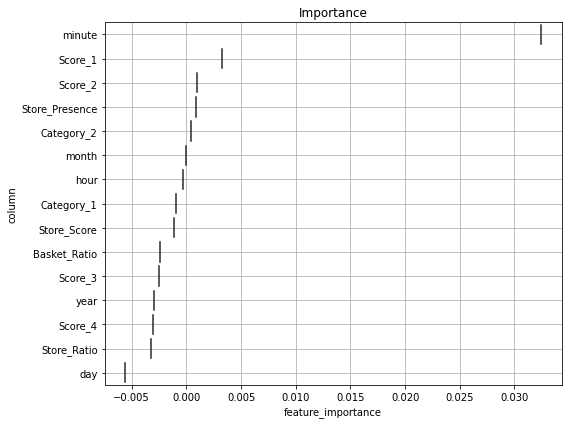

In [44]:
from sklearn.linear_model import LogisticRegression

log_class = LogisticRegression()

# fitting the model on train data
log_class.fit(X_train, y_train)

print_score(log_class)

# visualizing importance of features
fig, ax = visualize_importance(log_class.coef_[0], X)


#RANDOM FOREST CLASSIFIER

 random forest algorithm creates decision trees on data samples and then gets the prediction from each of them and finally selects the best solution by means of voting. It is an ensemble method which is better than a single decision tree because it reduces the over-fitting by averaging the result.

Classification Report 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00         2
           1       1.00      0.73      0.84        11
           3       0.90      0.33      0.48       115
           4       0.89      1.00      0.94       761
           5       1.00      0.41      0.58        22

    accuracy                           0.89       911
   macro avg       0.96      0.69      0.77       911
weighted avg       0.90      0.89      0.87       911



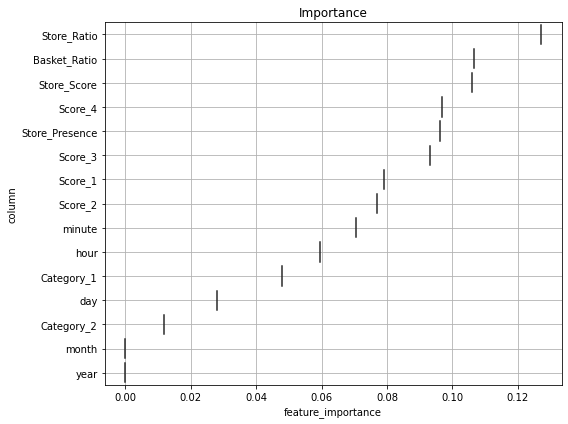

In [45]:
from sklearn.ensemble import RandomForestClassifier

rf_clf = RandomForestClassifier(n_estimators=200, max_depth=40)

# fitting the model on train data
rf_clf.fit(X_train, y_train)

print_score(rf_clf)

# visualizing importance of features
fig, ax = visualize_importance(rf_clf.feature_importances_, X)

# ADA BOOST CLASSIFIER

An AdaBoost classifier is a meta-estimator that begins by fitting a classifier on the original dataset and then fits additional copies of the classifier on the same dataset but where the weights of incorrectly classified instances are adjusted such that subsequent classifiers focus more on difficult cases.

Classification Report 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00         2
           1       0.00      0.09      0.00        11
           3       0.00      0.00      0.00       115
           4       0.70      0.34      0.45       761
           5       0.00      0.00      0.00        22

    accuracy                           0.28       911
   macro avg       0.34      0.29      0.29       911
weighted avg       0.58      0.28      0.38       911



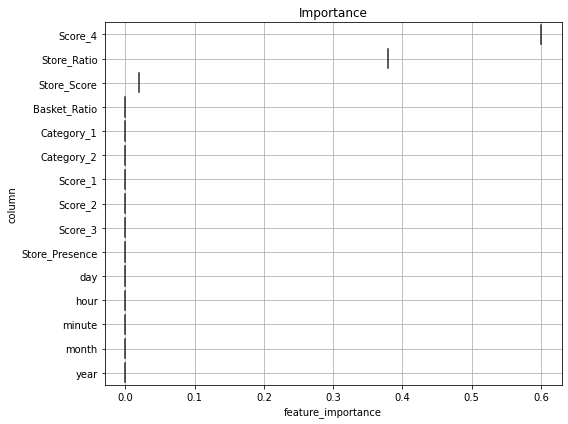

In [46]:
# Fit a AdaBoost classifier model to the train dataset

# Import AdaBoostClassifier
from sklearn.ensemble import AdaBoostClassifier

Ada_clf = AdaBoostClassifier()

# fitting the model on train data
Ada_clf.fit(X_train,y_train)


print_score(Ada_clf)

# visualizing importance of features
fig, ax = visualize_importance(Ada_clf.feature_importances_, X)

#SUPORT VECTOR CLASSIFIER

1. A support vector machine (SVM) is a supervised machine learning model that uses classification algorithms for two-group classification problems. After giving an SVM model sets of labeled training data for each category, they’re able to categorize new text.



In [49]:
from sklearn.svm import SVC

svc = SVC()

svc.fit(X_train,y_train)

print_score(svc)

Classification Report 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00         2
           1       0.00      0.00      0.00        11
           3       0.00      0.00      0.00       115
           4       0.84      1.00      0.91       761
           5       0.00      0.00      0.00        22

    accuracy                           0.84       911
   macro avg       0.17      0.20      0.18       911
weighted avg       0.70      0.84      0.76       911



# DESISION TREE CLASSICIFIER

Decision Tree Classifier is a simple and widely used classification technique. It applies a straitforward idea to solve the classification problem. Decision Tree Classifier poses a series of carefully crafted questions about the attributes of the test record. Each time time it receive an answer, a follow-up question is asked until a conclusion about the calss label of the record is reached.

Classification Report 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00         2
           1       0.30      0.73      0.42        11
           3       0.45      0.44      0.45       115
           4       0.92      0.88      0.90       761
           5       0.24      0.45      0.32        22

    accuracy                           0.82       911
   macro avg       0.58      0.70      0.62       911
weighted avg       0.84      0.82      0.83       911



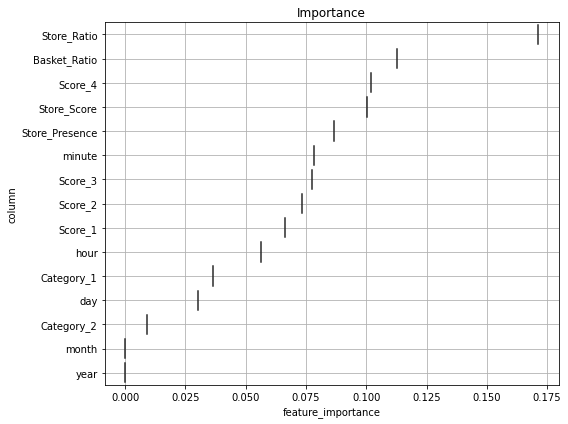

In [51]:
from sklearn.tree import DecisionTreeClassifier

dt_clf = DecisionTreeClassifier()

# fitting the model on train data
dt_clf.fit(X_train,y_train)

print_score(dt_clf)

# visualizing importance of features
fig, ax = visualize_importance(dt_clf.feature_importances_, X)

# K NEIGHBOUR CLASSIFIER

In [53]:
# Fit a K-Neighbour classifier model to the train dataset

# Import KNeighborsClassifier

from sklearn.neighbors import KNeighborsClassifier

knn_clf = KNeighborsClassifier()

# fitting the model on train data
knn_clf.fit(X_train,y_train)

print_score(knn_clf)

Classification Report 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00         2
           1       0.12      0.09      0.11        11
           3       0.50      0.24      0.33       115
           4       0.87      0.96      0.91       761
           5       0.50      0.14      0.21        22

    accuracy                           0.84       911
   macro avg       0.40      0.29      0.31       911
weighted avg       0.80      0.84      0.81       911



# GRADIENT BOOSTING CLASSIFIER

Classification Report 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00         2
           1       0.33      0.09      0.14        11
           3       0.45      0.11      0.18       115
           4       0.86      0.98      0.91       761
           5       0.80      0.18      0.30        22

    accuracy                           0.84       911
   macro avg       0.69      0.47      0.51       911
weighted avg       0.80      0.84      0.80       911



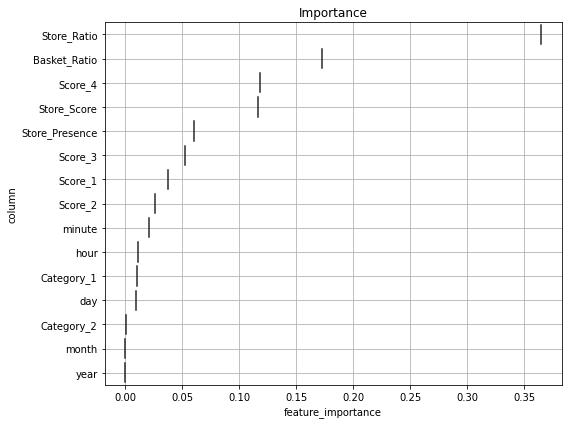

In [54]:
# Fit a Gradient Boosting Classifier model to the train dataset

# Import GradientBoostingClassifier
from sklearn.ensemble import GradientBoostingClassifier

# Instantiate the model
GBR_clf = GradientBoostingClassifier()

# fitting the model on train data
GBR_clf.fit(X_train,y_train)

# print score of the model
print_score(GBR_clf)

# visualizing importance of features
fig, ax = visualize_importance(GBR_clf.feature_importances_, X)

# BAGGING CLASSIFIER

In [55]:
# Fit a Bagging Classifier model to the train dataset

# Import BaggingClassifier
from sklearn.ensemble import BaggingClassifier

# Instantiate the model
bg_clf = BaggingClassifier()

# fitting the model on train data
bg_clf.fit(X_train,y_train)

# print score of the model
print_score(bg_clf)

Classification Report 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00         2
           1       0.89      0.73      0.80        11
           3       0.56      0.37      0.45       115
           4       0.90      0.96      0.93       761
           5       0.90      0.41      0.56        22

    accuracy                           0.87       911
   macro avg       0.85      0.69      0.75       911
weighted avg       0.85      0.87      0.85       911



# VOTING CLASSIFIER

In [56]:
# Fit a VotingClassifier model to the train dataset

# Import VotingClassifier
from sklearn.ensemble import VotingClassifier

# list of classifier objects
classifiers = [("knn", knn_clf), ("svc", svc), ("dt", dt_clf), ("rf_clf", rf_clf)]

# Instantiate the model
voting_clf = VotingClassifier(estimators=classifiers, voting="hard")

# fitting the model on train data
voting_clf.fit(X_train, y_train)

# print score of the model
print_score(voting_clf)

Classification Report 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00         2
           1       0.89      0.73      0.80        11
           3       0.86      0.32      0.47       115
           4       0.89      0.99      0.94       761
           5       1.00      0.23      0.37        22

    accuracy                           0.89       911
   macro avg       0.93      0.65      0.72       911
weighted avg       0.89      0.89      0.86       911



# EASY ENSEMBLE CLASSIFIER

In [57]:
# Fit a EasyEnsembleClassifier model to the train dataset

# Import EasyEnsembleClassifier
from imblearn.ensemble import EasyEnsembleClassifier

# Instantiate the model
easy = EasyEnsembleClassifier()

# fitting the model on train data
easy.fit(X_train,y_train)

# print score of the model
print_score(easy)

Classification Report 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00         2
           1       0.03      0.73      0.05        11
           3       0.14      0.06      0.09       115
           4       0.94      0.65      0.76       761
           5       0.04      0.09      0.06        22

    accuracy                           0.56       911
   macro avg       0.43      0.50      0.39       911
weighted avg       0.80      0.56      0.65       911



# XGB CLASSIFIER

Classification Report 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00         2
           1       0.00      0.00      0.00        11
           3       0.58      0.06      0.11       115
           4       0.84      0.99      0.91       761
           5       0.00      0.00      0.00        22

    accuracy                           0.84       911
   macro avg       0.49      0.41      0.40       911
weighted avg       0.78      0.84      0.78       911



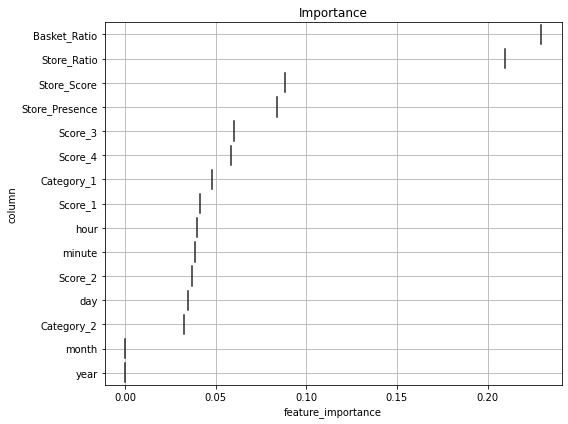

In [58]:
# Fit a XGBClassifier model to the train dataset

# Import XGBClassifier
from xgboost import XGBClassifier

# Instantiate the model
xgb_clf = XGBClassifier()

# fitting the model on train data
xgb_clf.fit(X_train,y_train)

# print score of the model
print_score(xgb_clf)

# visualizing importance of features
fig, ax = visualize_importance(xgb_clf.feature_importances_, X)

# Hyperparameter tuning

A hyperparameter is a parameter whose value is set before the learning process begins.

Hyperparameters tuning is crucial as they control the overall behavior of a machine learning model.

Every machine learning models will have different hyperparameters that can be set.



# grid search

One traditional and popular way to perform hyperparameter tuning is by using an Exhaustive Grid Search from Scikit learn.

This method tries every possible combination of each set of hyper-parameters.

Using this method, we can find the best set of values in the parameter search space.

This usually uses more computational power and takes a long time to run since this method needs to try every combination in the grid size.

In [62]:
# Helper function to perform hyper parameter tunning with GridSearchCV
def grid_search(model,grid):
  from sklearn.model_selection import GridSearchCV, train_test_split
  from sklearn.model_selection import KFold
  from sklearn.model_selection import GridSearchCV

  
  cv=KFold(n_splits=5,shuffle=False,random_state=None)

  clf=GridSearchCV(model,grid,cv=cv,n_jobs=-1,scoring='f1_macro')
  clf.fit(X_train.iloc[1:10000],y_train.iloc[1:10000])
  print(clf.score(X_train.iloc[1:10000],y_train.iloc[1:10000]))

In [63]:
# create parameters dict in list for tunning

log_para_grid = {
    'C':10.0 **np.arange(-2,3),
    'penalty':['l1','l2']
    }
# passing data for hyper parameter tunning with Gridsearchcv    
grid_search(log_class, log_para_grid)

0.18232284750190483


In [ ]:
# create parameters dict in list for tunning
rf_para_grid = {
    'n_estimators' : [100, 300, 500, 800, 1200],
    'max_depth' : [5, 8, 15, 25, 30],
    'min_samples_split' : [2, 5, 10, 15, 100],
    'min_samples_leaf' : [1, 2, 5, 10],
}
# passing data for hyper parameter tunning with Gridsearchcv
grid_search(rf_clf, rf_para_grid)

In [ ]:
# create parameters dict in list for tunning

knn_para_grid = {
                  'leaf_size' :list(range(1,50)),
                  'n_neighbors' : list(range(1,30)),
                  'p' :[1,2]
              }
# passing data for hyper parameter tunning with Gridsearchcv
grid_search(knn_clf,X_train, Y_train, param_grid = knn_para_grid)

In [ ]:
# create parameters dict in list for tunning

GBR_para_grid = {
'n_estimators':  [x for x in range(50,500, 20)], 
 'learning_rate' : [0.1, 0.2, 0.3, 0.4, 0.5],
 'max_depth': [x for x in range(5,20)], 
 'min_samples_split': [x for x in range(2,10)]
}
# passing data for hyper parameter tunning with Gridsearchcv
random_Search(GBR_clf,X_train, Y_train, param_grid = GBR_para_grid )

In [ ]:
# create parameters dict in list for tunning

DTR_para_grid = {
                  "splitter":["best","random"],
            "max_depth" : [1,3,5,7,9,11,12],
           "min_samples_leaf":[1,2,3,4,5,6,7,8,9,10],
           "min_weight_fraction_leaf":[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9],
           "max_features":["auto","log2","sqrt",None],
           "max_leaf_nodes":[None,10,20,30,40,50,60,70,80,90]
              }

# passing data for hyper parameter tunning with Gridsearchcv
grid_search(dt_clf,X_train, Y_train, param_grid = DTR_para_grid)

In [ ]:
# create parameters dict in list for tunning

Ada_para_grid = {
                  'n_estimators' :[10, 50, 100, 500],
                  'learning_rate' : [0.0001, 0.001, 0.01, 0.1, 1.0]
              }
# passing data for hyper parameter tunning with Gridsearchcv
grid_search(Ada_clf,X_train, Y_train, param_grid = Ada_para_grid)

In [ ]:
# create parameters dict in list for tunning
XGB_para_grid = {"learning_rate"    : [0.05, 0.10, 0.15, 0.20, 0.25, 0.30 ] ,
 "max_depth"        : [ 3, 4, 5, 6, 8, 10, 12, 15],
 "min_child_weight" : [ 1, 3, 5, 7 ],
 "gamma"            : [ 0.0, 0.1, 0.2 , 0.3, 0.4 ],
 "colsample_bytree" : [ 0.3, 0.4, 0.5 , 0.7 ] }

# passing data for hyper parameter tunning with Gridsearchcv
grid_search(xgb_clf,X_train, Y_train, param_grid = XGB_para_grid)

# NOTE : you can use any one of RandomizedSearchCv or GridSearchCV, both works fine.

# RamdomizedSearchCV

In [ ]:
# Helper function to perform hyper parameter tunning with RandomizedSearchCV
def random_Search(model,X_train, Y_train,param_grid):
  from sklearn.model_selection import RandomizedSearchCV

  # Random search of parameters, using 3 fold cross validation, 
  # search across 100 different combinations, and use all available cores
  random = RandomizedSearchCV(estimator = model, param_distributions = param_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)# Fit the random search model
  random.fit(X_train, Y_train)
  random.best_params_

In [ ]:
# create parameters dict for tunning
rf_para_grid = {'n_estimators': [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)],
               'max_features': ['auto', 'sqrt'],
               'max_depth': [int(x) for x in np.linspace(10, 110, num = 11)],
               'min_samples_split': [2, 5, 10],
               'min_samples_leaf': [1, 2, 4],
               'bootstrap': [True, False]}

# passing data for hyper parameter tunning with Randomized search cv
random_Search(RandomForestRegressor(),X_train, Y_train, param_grid=rf_para_grid)

In [ ]:
# create parameters dict for tunning
GBR_para_grid = {
'n_estimators':  [x for x in range(50,500, 20)], 
 'learning_rate' : [0.1, 0.2, 0.3, 0.4, 0.5],
 'max_depth': [x for x in range(5,20)], 
 'min_samples_split': [x for x in range(2,10)]
}

# passing data for hyper parameter tunning with Randomized search cv
random_Search(GradientBoostingRegressor(),X_train, Y_train, param_grid = GBR_para_grid )

In [ ]:
# create parameters dict for tunning
knn_para_grid = {
                  'leaf_size' :list(range(1,50)),
                  'n_neighbors' : list(range(1,30)),
                  'p' :[1,2]
              }

# passing data for hyper parameter tunning with Randomized search cv
random_Search(KNeighborsRegressor(),X_train, Y_train, param_grid = knn_para_grid)

In [ ]:
# create parameters dict for tunning
DTR_para_grid = {
                  "splitter":["best","random"],
            "max_depth" : [1,3,5,7,9,11,12],
           "min_samples_leaf":[1,2,3,4,5,6,7,8,9,10],
           "min_weight_fraction_leaf":[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9],
           "max_features":["auto","log2","sqrt",None],
           "max_leaf_nodes":[None,10,20,30,40,50,60,70,80,90]
              }

# passing data for hyper parameter tunning with Randomized search cv
random_Search(DecisionTreeRegressor(),X_train, Y_train, param_grid = DTR_para_grid)

In [ ]:
# create parameters dict for tunning
Ada_para_grid = {
                  'n_estimators' :[10, 50, 100, 500],
                  'learning_rate' : [0.0001, 0.001, 0.01, 0.1, 1.0]
              }

# passing data for hyper parameter tunning with Randomized search cv
random_Search(AdaBoostRegressor(),X_train, Y_train, param_grid = Ada_para_grid)

In [ ]:
# create parameters dict for tunning
XGB_para_grid = {"learning_rate"    : [0.05, 0.10, 0.15, 0.20, 0.25, 0.30 ] ,
 "max_depth"        : [ 3, 4, 5, 6, 8, 10, 12, 15],
 "min_child_weight" : [ 1, 3, 5, 7 ],
 "gamma"            : [ 0.0, 0.1, 0.2 , 0.3, 0.4 ],
 "colsample_bytree" : [ 0.3, 0.4, 0.5 , 0.7 ] }

# passing data for hyper parameter tunning with Randomized search cv
random_Search(XGBRegressor(),X_train, Y_train, param_grid = XGB_para_grid)

### Now working with the test dataset provided

In [65]:
test_df['hour'] = pd.to_datetime(test_df['time'].astype(int), unit='s').dt.hour
test_df['month'] = pd.to_datetime(test_df['time'].astype(int), unit='s').dt.month
test_df['day'] = pd.to_datetime(test_df['time'].astype(int), unit='s').dt.day
test_df['year'] = pd.to_datetime(test_df['time'].astype(int), unit='s').dt.year
test_df['minute'] = pd.to_datetime(test_df['time'].astype(int), unit='s').dt.minute
test_df = test_df.drop(["time"],1)

In [66]:
X_test = test_df

In [67]:
X_test.columns

Index(['Store_Ratio', 'Basket_Ratio', 'Category_1', 'Store_Score',
       'Category_2', 'Store_Presence', 'Score_1', 'Score_2', 'Score_3',
       'Score_4', 'hour', 'month', 'day', 'year', 'minute'],
      dtype='object')

In [71]:
X_test.columns

Index(['Store_Ratio', 'Basket_Ratio', 'Category_1', 'Store_Score',
       'Category_2', 'Store_Presence', 'Score_1', 'Score_2', 'Score_3',
       'Score_4', 'hour', 'month', 'day', 'year', 'minute'],
      dtype='object')

In [73]:
# passing test data for scaling
col_X_test = ['Store_Ratio', 'Basket_Ratio', 'Category_1', 'Store_Score',
       'Category_2', 'Store_Presence', 'Score_1', 'Score_2', 'Score_3',
       'Score_4','hour', 'month', 'day', 'year', 'minute']
X_test = scale_data(X_test,col_X_test)

In [74]:
X_test

,Store_Ratio,Basket_Ratio,Category_1,Store_Score,Category_2,Store_Presence,Score_1,Score_2,Score_3,Score_4,hour,month,day,year,minute
0,0.167689,0.994,0.090909,0.486834,0.0,0.124498,0.991000,0.793763,0.00001,0.580798,0.739130,0.0,0.10,0.0,0.677966
1,0.599182,0.636,0.363636,0.823781,1.0,0.002088,0.322000,0.107646,0.35500,0.620557,0.956522,0.0,0.10,0.0,0.457627
2,0.467280,0.743,0.000000,0.826286,1.0,0.405622,0.009310,0.202213,0.68800,0.705058,0.478261,0.0,0.10,0.0,0.915254
3,0.432515,0.748,0.454545,0.779116,1.0,0.030120,0.221000,0.170020,0.42800,0.427750,0.782609,0.0,0.15,0.0,0.338983
4,0.820041,0.756,0.181818,0.758930,0.0,0.084639,0.007650,0.052414,0.96300,0.599519,0.347826,0.0,0.15,0.0,0.067797
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12135,0.174847,0.118,0.181818,0.452272,1.0,0.864458,0.871000,0.093763,0.05390,0.356407,0.217391,0.0,0.10,0.0,0.338983
12136,0.760736,0.859,1.000000,0.919426,1.0,0.025703,0.000063,0.088632,0.78700,0.418646,0.695652,0.0,0.10,0.0,0.661017
12137,0.584867,0.852,0.545455,0.886885,0.0,0.001054,0.000000,0.084909,0.37800,0.591572,0.521739,0.0,0.10,0.0,0.101695
12138,0.778119,0.525,1.000000,0.840830,1.0,0.441767,0.000007,0.092656,0.53100,0.368091,0.782609,0.0,0.10,0.0,0.338983


In [75]:
# Perforn the prediction on the test dataset
y_predicted = voting_clf.predict(X_test)
y_predicted

array([4, 4, 4, ..., 4, 4, 4])

In [76]:
# creating a dataframe of predicted results 
predictions = pd.DataFrame(y_predicted)

In [79]:
predictions.head()

,0
0,4
1,4
2,4
3,4
4,4
